In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import seaborn as sns

# Import data

In [2]:
bills = pd.read_csv("./Data/bills_propublica.csv")

/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (22) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
bills

,bill_id,bill_slug,bill_type,number,bill_uri,title,short_title,sponsor_title,sponsor_id,sponsor_name,...,cosponsors,cosponsors_by_party,committees,committee_codes,subcommittee_codes,primary_subject,summary,summary_short,latest_major_action_date,latest_major_action
0,sres343-115,sres343,sres,S.RES.343,https://api.propublica.org/congress/v1/115/bil...,"A resolution to authorize testimony, document ...","A resolution to authorize testimony, document ...",Sen.,M000355,Mitch McConnell,...,1,{'D': 1},NaN,[],[],Congress,(This measure has not been amended since it wa...,(This measure has not been amended since it wa...,2017-11-28,"Submitted in the Senate, considered, and agree..."
1,s1-115,s1,s,S.1,https://api.propublica.org/congress/v1/115/bil...,An original bill to provide for reconciliation...,An original bill to provide for reconciliation...,Sen.,E000285,Michael B. Enzi,...,0,{},Senate Budget Committee,['SSBU'],[],Taxation,(This measure has not been amended since it wa...,(This measure has not been amended since it wa...,2017-11-28,Placed on Senate Legislative Calendar under Ge...
2,s2166-115,s2166,s,S.2166,https://api.propublica.org/congress/v1/115/bil...,A bill to maintain annual base funding for the...,Endangered Fish Recovery Programs Extension Act,Sen.,G000562,Cory Gardner,...,4,"{'D': 3, 'R': 1}",Senate Energy and Natural Resources Committee,['SSEG'],['SSEG07'],Public Lands and Natural Resources,NaN,NaN,2018-11-26,Placed on Senate Legislative Calendar under Ge...
3,s2168-115,s2168,s,S.2168,https://api.propublica.org/congress/v1/115/bil...,"A bill to amend the Veterans Access, Choice, a...",Veterans Improved Access and Care Act of 2017,Sen.,G000562,Cory Gardner,...,0,{},Senate Veterans&#39; Affairs Committee,['SSVA'],[],Armed Forces and National Security,Veterans Improved Access and Care Act of 2017 ...,Veterans Improved Access and Care Act of 2017 ...,2017-11-28,Read twice and referred to the Committee on Ve...
4,s2167-115,s2167,s,S.2167,https://api.propublica.org/congress/v1/115/bil...,A bill to require the Secretary of the Treasur...,Strengthening Oversight of Iran's Access to Fi...,Sen.,C001098,Ted Cruz,...,2,{'R': 2},"Senate Banking, Housing, and Urban Affairs Com...",['SSBK'],[],Foreign Trade and International Finance,Strengthening Oversight of Iran's Access to Fi...,Strengthening Oversight of Iran&#39;s Access t...,2017-11-28,Read twice and referred to the Committee on Ba...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151999,hr2799-108,hr2799,hr,H.R.2799,https://api.propublica.org/congress/v1/108/bil...,Making appropriations for the Departments of C...,"Departments of Commerce, Justice, and State, t...",Rep.,W000672,Frank R. Wolf,...,0,{},House Appropriations,[],[],Economics and public finance,"Departments of Commerce, Justice, and State, t...","Departments of Commerce, Justice, and State, t...",2004-01-22,See also H. R. 2673.
152000,hres328-108,hres328,hres,H.RES.328,https://api.propublica.org/congress/v1/108/bil...,Requesting the World Trade Organization (WTO) ...,NaN,Rep.,E000187,Phil English,...,1,{'D': 1},House Ways and Means,[],[],Foreign trade and international finance,Commends the request made by the United States...,Commends the request made by the United States...,2003-07-23,Referred to the Subcommittee on Trade.
152001,hres327-108,hres327,hres,H.RES.327,https://api.propublica.org/congress/v1/108/bil...,Providing for consideration of the bill (H.R. ...,NaN,Rep.,D000299,Lincoln Diaz-Balart,...,0,{},House Rules,[],[],Congress,Sets forth the rule for the consideration of H...,Sets forth the rule for the consideration of H...,2003-07-22,Motion to reconsider laid on the table Agreed ...
152002,hres326-108,hres326,hres,H.RES.326,https://api.propublica.org/congress/v1/108/bil...,Providing for consideration of the bill (H.R. ...,NaN,Rep.,L000321,John Linder,...,0,{},House Rules,[],[],Congress,Sets forth the rule for the consideration of H...,Sets forth the rule for the cons

# Initial clean

In [4]:
bills.columns

Index(['bill_id', 'bill_slug', 'bill_type', 'number', 'bill_uri', 'title',
       'short_title', 'sponsor_title', 'sponsor_id', 'sponsor_name',
       'sponsor_state', 'sponsor_party', 'sponsor_uri', 'gpo_pdf_uri',
       'congressdotgov_url', 'govtrack_url', 'introduced_date', 'active',
       'last_vote', 'house_passage', 'senate_passage', 'enacted', 'vetoed',
       'cosponsors', 'cosponsors_by_party', 'committees', 'committee_codes',
       'subcommittee_codes', 'primary_subject', 'summary', 'summary_short',
       'latest_major_action_date', 'latest_major_action'],
      dtype='object')

In [5]:
#drop unnecessary columns
bills.drop(columns = ["bill_slug", "number", "bill_uri", "short_title", "summary_short", "govtrack_url", "active", "gpo_pdf_uri", 'congressdotgov_url', 'sponsor_uri', 'committee_codes','subcommittee_codes'  ], inplace = True)

In [6]:
bills.columns

Index(['bill_id', 'bill_type', 'title', 'sponsor_title', 'sponsor_id',
       'sponsor_name', 'sponsor_state', 'sponsor_party', 'introduced_date',
       'last_vote', 'house_passage', 'senate_passage', 'enacted', 'vetoed',
       'cosponsors', 'cosponsors_by_party', 'committees', 'primary_subject',
       'summary', 'latest_major_action_date', 'latest_major_action'],
      dtype='object')

In [7]:
bills

,bill_id,bill_type,title,sponsor_title,sponsor_id,sponsor_name,sponsor_state,sponsor_party,introduced_date,last_vote,...,senate_passage,enacted,vetoed,cosponsors,cosponsors_by_party,committees,primary_subject,summary,latest_major_action_date,latest_major_action
0,sres343-115,sres,"A resolution to authorize testimony, document ...",Sen.,M000355,Mitch McConnell,KY,R,2017-11-28,NaN,...,NaN,NaN,NaN,1,{'D': 1},NaN,Congress,(This measure has not been amended since it wa...,2017-11-28,"Submitted in the Senate, considered, and agree..."
1,s1-115,s,An original bill to provide for reconciliation...,Sen.,E000285,Michael B. Enzi,WY,R,2017-11-28,NaN,...,NaN,NaN,NaN,0,{},Senate Budget Committee,Taxation,(This measure has not been amended since it wa...,2017-11-28,Placed on Senate Legislative Calendar under Ge...
2,s2166-115,s,A bill to maintain annual base funding for the...,Sen.,G000562,Cory Gardner,CO,R,2017-11-28,NaN,...,NaN,NaN,NaN,4,"{'D': 3, 'R': 1}",Senate Energy and Natural Resources Committee,Public Lands and Natural Resources,NaN,2018-11-26,Placed on Senate Legislative Calendar under Ge...
3,s2168-115,s,"A bill to amend the Veterans Access, Choice, a...",Sen.,G000562,Cory Gardner,CO,R,2017-11-28,NaN,...,NaN,NaN,NaN,0,{},Senate Veterans&#39; Affairs Committee,Armed Forces and National Security,Veterans Improved Access and Care Act of 2017 ...,2017-11-28,Read twice and referred to the Committee on Ve...
4,s2167-115,s,A bill to require the Secretary of the Treasur...,Sen.,C001098,Ted Cruz,TX,R,2017-11-28,NaN,...,NaN,NaN,NaN,2,{'R': 2},"Senate Banking, Housing, and Urban Affairs Com...",Foreign Trade and International Finance,Strengthening Oversight of Iran's Access to Fi...,2017-11-28,Read twice and referred to the Committee on Ba...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151999,hr2799-108,hr,Making appropriations for the Departments of C...,Rep.,W000672,Frank R. Wolf,VA,R,2003-07-21,2003-07-23,...,NaN,NaN,NaN,0,{},House Appropriations,Economics and public finance,"Departments of Commerce, Justice, and State, t...",2004-01-22,See also H. R. 2673.
152000,hres328-108,hres,Requesting the World Trade Organization (WTO) ...,Rep.,E000187,Phil English,PA,R,2003-07-21,NaN,...,NaN,NaN,NaN,1,{'D': 1},House Ways and Means,Foreign trade and international finance,Commends the request made by the United States...,2003-07-23,Referred to the Subcommittee on Trade.
152001,hres327-108,hres,Providing for consideration of the bill (H.R. ...,Rep.,D000299,Lincoln Diaz-Balart,FL,R,2003-07-21,NaN,...,NaN,NaN,NaN,0,{},House Rules,Congress,Sets forth the rule for the consideration of H...,2003-07-22,Motion to reconsider laid on the table Agreed ...
152002,hres326-108,hres,Providing for consideration of the bill (H.R. ...,Rep.,L000321,John Linder,GA,R,2003-07-21,2003-07-22,...,NaN,NaN,NaN,0,{},House Rules,Congress,Sets forth the rule for the consideration of H...,2003-07-22,Motion to reconsider laid on the table Agreed ...


In [8]:
#drop bills that were never assigned to committee -- these are mostly commemorative or procedural
bills = bills[bills['committees'].notna()]

In [9]:
#add congress column
bills['congress'] =  bills['bill_id'].apply(lambda x: x[-3:])

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [10]:
#drop duplicates
bills.drop_duplicates(inplace = True)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [11]:
bills['congress'].value_counts()

111    13122
115    13097
110    12557
109    12500
112    11754
106    10312
113    10016
107     9860
116     9650
108     9221
114     8930
105     8698
104     7560
103     6182
Name: congress, dtype: int64

In [12]:
#drop congress 103
to_drop = bills[bills['congress'] == "103"].index

bills.drop(to_drop, inplace = True)

/opt/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:4117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [13]:
#drop congress 104
to_drop = bills[bills['congress'] == "104"].index

bills.drop(to_drop, inplace = True)

In [14]:
#drop congress 116
to_drop = bills[bills['congress'] == "116"].index

bills.drop(to_drop, inplace = True)

In [15]:
bills['congress'].value_counts()

111    13122
115    13097
110    12557
109    12500
112    11754
106    10312
113    10016
107     9860
108     9221
114     8930
105     8698
Name: congress, dtype: int64

# EDA

In [16]:
bills.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 120067 entries, 1 to 152003
Data columns (total 22 columns):
bill_id                     120067 non-null object
bill_type                   120067 non-null object
title                       120067 non-null object
sponsor_title               111849 non-null object
sponsor_id                  120061 non-null object
sponsor_name                120061 non-null object
sponsor_state               120060 non-null object
sponsor_party               120060 non-null object
introduced_date             120067 non-null object
last_vote                   6304 non-null object
house_passage               8230 non-null object
senate_passage              3224 non-null object
enacted                     867 non-null object
vetoed                      6 non-null object
cosponsors                  120067 non-null int64
cosponsors_by_party         120067 non-null object
committees                  120067 non-null object
primary_subject             111345 no

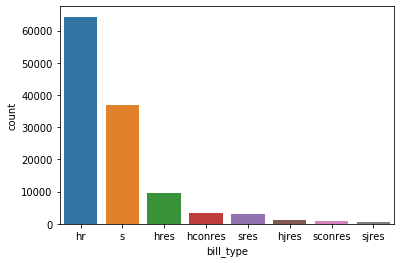

In [17]:
sns.countplot(bills.bill_type, order = bills.bill_type.value_counts().index);

In [18]:
#should I only do hr and sr?? They are by far the most common

# Clean up primary subject

In [37]:
def clean_subject(x):
    try:
        x = x.sentence()
        return x
    except AttributeError:
        return x

In [39]:
bills.primary_subject = bills.primary_subject.apply(clean_subject)

/opt/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:5208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [40]:
# If bill primary subject is less than 1000 or 2000 instances, change to other
bills.primary_subject.value_counts().head()

Health                                     10963
Taxation                                   10129
Foreign trade and international finance     7784
Commemorations                              4796
International affairs                       4764
Name: primary_subject, dtype: int64

In [41]:
top_subjects = bills['primary_subject'].value_counts().index[:26]

In [42]:
top_subjects

Index(['Health', 'Taxation', 'Foreign trade and international finance',
       'Commemorations', 'International affairs',
       'Armed forces and national security', 'Congress',
       'Public lands and natural resources',
       'Government operations and politics', 'Education',
       'Crime and law enforcement', 'Armed Forces and National Security',
       'Energy', 'Transportation and public works', 'Commerce',
       'Government Operations and Politics', 'Immigration',
       'International Affairs', 'Public Lands and Natural Resources',
       'Crime and Law Enforcement', 'Finance and financial sector',
       'Labor and employment', 'Environmental protection',
       'Agriculture and food', 'Law', 'Finance and Financial Sector'],
      dtype='object')

In [43]:
# all subjects not in top 25 changed to other
bills.loc[~bills['primary_subject'].isin(top_subjects), "primary_subject"] = "Other"

/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


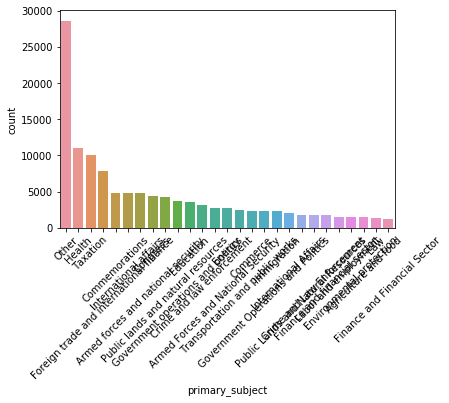

In [44]:
plt.xticks(rotation = 45)
sns.countplot(bills.primary_subject, order = bills.primary_subject.value_counts().index);

# Clean up committee

In [45]:
bills['committees'].value_counts()

House Ways and Means                                                                                                                                                10603
Senate Finance                                                                                                                                                       8759
House Judiciary                                                                                                                                                      5117
Senate Judiciary                                                                                                                                                     3812
House Energy and Commerce                                                                                                                                            3494
                                                                                                                                                      

In [46]:
bills['committees'] = bills['committees'].apply(lambda x: x.replace("House", "").replace("Senate", "").replace("Committee", "").strip())

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [47]:
bills['committees'] = bills['committees'].apply(lambda x:x.split(";"))

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [48]:
bills['committees'] = bills['committees'].apply(sorted)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [49]:
def clean_committee(x):
    if len(x) == 1:
        return x[0]
    else:
        return "Multiple"

In [50]:
bills['clean_committees'] = bills['committees'].apply(clean_committee)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [51]:
#significantly fewer
bills['clean_committees'].value_counts()

Multiple                                      19247
Judiciary                                     13340
Ways and Means                                13221
Finance                                       10780
Energy and Commerce                            5927
Health, Education, Labor, and Pensions         4096
Energy and Natural Resources                   3412
Armed Services                                 3342
Transportation and Infrastructure              3055
Education and the Workforce                    2790
Natural Resources                              2646
Financial Services                             2532
Commerce, Science, and Transportation          2481
Rules                                          2397
Foreign Affairs                                2219
Education and Labor                            2175
Foreign Relations                              2124
Environment and Public Works                   2018
Resources                                      1926
Banking, Hou

# Make Final Status column

## Convert passage, vote, enacted columns into binaries

In [52]:
#dropped vetoed bills because they're so rare -- only 6 in the whole dataset
bills = bills[bills['vetoed'].isna()]

In [53]:
bills['house_passage'].fillna(0, inplace = True)

In [54]:
def clean_passage(x):
    if x == 0:
        return 0
    else:
        return 1

In [55]:
bills['house_passage'] = bills['house_passage'].apply(clean_passage)
bills['house_passage'].value_counts()

0    111837
1      8224
Name: house_passage, dtype: int64

In [56]:
bills['senate_passage'].fillna(0, inplace = True)

In [57]:
bills['senate_passage'] = bills['senate_passage'].apply(clean_passage)
bills['senate_passage'].value_counts()

0    116843
1      3218
Name: senate_passage, dtype: int64

In [58]:
bills['last_vote'].fillna(0, inplace = True)
bills['last_vote'] = bills['last_vote'].apply(clean_passage)
bills['last_vote'].value_counts()

0    113762
1      6299
Name: last_vote, dtype: int64

In [59]:
bills['enacted'].fillna(0, inplace = True)
bills['enacted'] = bills['enacted'].apply(clean_passage)
bills['enacted'].value_counts()

0    119200
1       861
Name: enacted, dtype: int64

In [60]:
def final_status(house, senate, vote, enacted):
    if enacted  == 1:
        return "Law!"
    elif house == 1:
        return "Passed one chamber"
    elif senate == 1:
        return "Passed one chamber"
    if vote == 1:
        return "Referred to full chamber"
    else:
        return 0

In [61]:
bills["final_status"] = bills.apply(lambda x: final_status(x.house_passage, x.senate_passage, x.last_vote, x.enacted), axis = 1)

In [62]:
bills["final_status"].value_counts()

0                           107236
Passed one chamber            9641
Referred to full chamber      2323
Law!                           861
Name: final_status, dtype: int64

In [63]:
#delete vetoed column because it's too small
bills.drop(columns = "vetoed", inplace = True)

### Categories:

1) Referred to committee

2) Action in committee (hearings or markup)

3) Vote happened/made it to full body

4) Passed one chamber (house passage or senate passage)

5) Law/enacted


In [64]:
bills['latest_major_action'].value_counts()

Read twice and referred to the Committee on Finance.                                                                              9040
Referred to the House Committee on Ways and Means.                                                                                6921
Referred to the Subcommittee on Health.                                                                                           5181
Motion to reconsider laid on the table Agreed to without objection.                                                               3401
Read twice and referred to the Committee on Health, Education, Labor, and Pensions.                                               3234
                                                                                                                                  ... 
Became Public Law No: 110-47.                                                                                                        1
Became Public Law No: 113-59.                          

In [65]:
def get_final_status(action):
    action = action.lower()
    if ("Hearings held").lower() in action:
        return "Hearings held"
    
    elif ("Read twice and referred to Committe").lower() in action:
        return "Referred to committee"
    
    elif ("filed written report").lower() in action:
        return "Written report filed by congressperson"
    
    elif("Became public law").lower() in action:
        return "Became public law!"
    
    elif ("Held at the desk").lower() in action:
        return "Held at the desk"
    
    elif("Submitted in the Senate, considered, and agreed to without amendment and with a preamble by Unanimous Consent").lower() in action:
        return "Senate agreed to unanimously"
    
    elif ("Placed on the Union Calendar").lower() in action:
        return "Placed on the Union Calendar"
    
    elif ("Motion to reconsider laid on the table Agreed to without objection").lower() in action:
        return "Dead on the floor"
    
    elif ("Received in the Senate").lower() in action:
        return "Received in the Senate"
    
    elif ("Senate Legislative Calendar").lower() in action:
        return "Placed on Senate Calendar"
    
    elif ("Placed on the House Calendar").lower() in action:
        return "Placed on House Calendar"
    
    elif ("Yeas and nays").lower() in action:
        return "Some sort of vote held?"
    
    elif ("Message on Senate action sent to the House").lower() in action:
        return "Message on Senate action sent to the House"
    
    elif ("Motion to proceed to consideration of measure withdrawn in Senate").lower() in action:
        return "Died on the floor of the Senate"
   
    elif ("Motion to proceed to consideration of measure made in Senate").lower() in action:
        return "Considered in Senate"
    
    elif ("Ordered to be Reported by Voice Vote").lower() in action:
        return "Ordered to be Reported by Voice Vote"
    
    elif ("Indefinitely postponed by Senate by Unanimous Consent").lower() in action:
        return "Indefinitely postponed by Senate by Unanimous Consent."
    
    elif ("Cloture on the joint resolution not invoked in Senate").lower() in action:
        return "Cloture on the joint resolution not invoked in Senate"
    
    elif ("Ordered to be Reported by Voice Vote").lower() in action:
        return "Ordered to be Reported by Voice Vote"
    
    elif ("Referred to House Rules").lower() in action:
        return "Referred to House Rules"
    
    elif ("Referred to House").lower() in action:
        return "Died in committee"
    
    elif ("Hearings").lower() in action:
        return "Hearings held"
    
    elif ("Mark-up Session Held").lower() in action:
        return "Committee held mark-up session"
    
    elif ("Mark-up").lower() in action:
        return "Committee held mark-up session"
    
    elif ("Ordered to be Reported by Voice Vote").lower() in action:
        return "Ordered to be Reported by Voice Vote"
    
    elif ("Forwarded by Subcommittee to Full Committee").lower() in action:
        return "Forwarded by Subcommittee to Full Committee"
    
    elif ("Ordered to be reported with an amendment").lower() in action:
        return "Ordered to be reported to the full body"
    
    elif ("Ordered held at desk").lower() in action:
        return "Ordered held at desk"
    
    elif ("unfinished business").lower() in action:
        return "Unfinished business"

    elif ("Committee").lower() in action:
        return "Died in committee"
    
    elif ("committee").lower() in action:
        return "Died in committee"
    
    elif ("passed House").lower() in action:
        return "passed the House"
        
    elif ("Read twice and referred to Subcommittee").lower() in action:
        return "Referred to subcommittee"
    
    elif ("Referred to the House Committee").lower() in action:
        return "Referred to committee"
    
    elif ("Referred to the Subcommittee").lower() in action:
        return "Referred to subcommittee"
    
    elif ("Referred to the Committee").lower() in action:
        return "Referred to committee"
    
    elif ("Sponsor introductory remarks on measure").lower() in action:
        return "Sponsor introduction is as far as it got"
    
    elif ("Presented to President").lower() in action:
        return "Presented to President"
    
    elif ("Ordered to be Reported").lower() in action:
        return "Ordered to be reported to the full body"
    
    elif ("Resolution agreed to in Senate").lower() in action:
        return "Resolution agreed to in Senate"
    
    elif ("Cloture on the motion to proceed not invoked").lower() in action:
        return "Cloture on the motion to proceed not invoked"
    
    elif ("Cloture on the motion to proceed to the measure not invoked").lower() in action:
        return "Cloture on the motion to proceed not invoked"
    
    elif ("laid on the table").lower() in action:
        return "Laid on the table"
    
    elif ("Submitted in the Senate, considered, and agreed to").lower() in action:
        return "Submitted in the Senate, considered, and passed"
 
    elif ("Motion to proceed to consideration of measure rejected in Senate").lower() in action:
        return "Motion to proceed to consideration of measure rejected in Senate"
    
    elif ("Submitted in the Senate, considered, and passed").lower() in action:
        return "Submitted in the Senate, considered, and passed"
    
    elif ("Conference held").lower() in action:
        return "Conference held."
    
    elif ("Failed of passage in Senate over veto").lower() in action:
        return "Vetoed"
    
    elif ("Record Vote").lower() in action:
        return "Vote recorded"
    
    elif ("Star Print").lower() in action:
        return "Star Print ordered"
    
#     elif ("Veto").lower() in action:
#         return "Vetoed"
    
    else:
        return "?"

In [66]:
def final(final_status):
    if final_status == "Referred to committee" or final_status == "Referred to subcommittee":
        return "Referred to committee/subcommittee"
    
    elif final_status == "Hearings held" or final_status == "Committee held mark-up session":
        return "Action in committee" #hearing or markup
    
    elif final_status == "Placed on Senate Calendar" or final_status == "Placed on the Union Calendar" or final_status == "Written report filed by congressperson" or final_status == "Ordered to be reported to the full body" or final_status == "Some sort of vote held?":
        return "Referred to full chamber"
    
    elif final_status == "Became public law!":
        return "Law!"
    
    else:
        return "Referred to committee/subcommittee"

In [67]:
bills['final'] = bills['latest_major_action'].apply(get_final_status)
bills['final']

1         Placed on Senate Calendar
2         Placed on Senate Calendar
3                 Died in committee
4                 Died in committee
5                 Died in committee
                    ...            
151999                            ?
152000            Died in committee
152001            Dead on the floor
152002            Dead on the floor
152003            Died in committee
Name: final, Length: 120061, dtype: object

In [68]:
bills['final2'] = bills['final'].apply(final)
bills['final2']

1                   Referred to full chamber
2                   Referred to full chamber
3         Referred to committee/subcommittee
4         Referred to committee/subcommittee
5         Referred to committee/subcommittee
                         ...                
151999    Referred to committee/subcommittee
152000    Referred to committee/subcommittee
152001    Referred to committee/subcommittee
152002    Referred to committee/subcommittee
152003    Referred to committee/subcommittee
Name: final2, Length: 120061, dtype: object

In [69]:
bills['final2'].value_counts(normalize = True)

Referred to committee/subcommittee    0.892163
Referred to full chamber              0.042445
Law!                                  0.034799
Action in committee                   0.030593
Name: final2, dtype: float64

## Combine the two final status columns

In [70]:
def combine_finals(final_1, final_2):
    if final_2 == "Law!":
        return "Law!"
    
    if final_1 != 0:
        return final_1
    
    else:
        return final_2

In [71]:
#final status with 5 categories
bills['final_status_5'] = bills.apply(lambda x: combine_finals(x['final_status'], x['final2']), axis = 1)

In [72]:
bills['final_status_5'].value_counts(normalize = True)

Referred to committee/subcommittee    0.824897
Passed one chamber                    0.057163
Referred to full chamber              0.053823
Law!                                  0.034916
Action in committee                   0.029202
Name: final_status_5, dtype: float64

## Make final status with three categories

Three categories:

1) Referred to committee
2) Out of committee but not law
3) Law

In [73]:
def three_categories(x):
    if x == "Law!":
        return "Law"
    elif x == "Referred to committee/subcommittee":
        return x
    else:
        return "Progress made"

In [74]:
bills['final_status_3'] = bills['final_status_5'].apply(three_categories)
bills['final_status_3'].value_counts(normalize = True)

Referred to committee/subcommittee    0.824897
Progress made                         0.140187
Law                                   0.034916
Name: final_status_3, dtype: float64

## Make final status with Law vs not Law

In [75]:
def if_law(x):
    if x == "Law!":
        return "Law"
    else:
        return "Failed"

In [76]:
bills['law'] = bills['final_status_5'].apply(if_law)
bills['law'].value_counts()

Failed    115869
Law         4192
Name: law, dtype: int64

## Make final status in committe vs made it out of committee

In [77]:
# Two categories died in committee or made it out of committee
def two_categories(x):
    if x == "Referred to committee/subcommittee":
        return "Referred to committee"
    else:
        return "Action taken on bill"

In [78]:
bills['final_status_coms'] = bills['final_status_5'].apply(two_categories)
bills['final_status_coms'].value_counts(normalize = True)

Referred to committee    0.824897
Action taken on bill     0.175103
Name: final_status_coms, dtype: float64

# Read in region data in and create feature

In [79]:
regions = pd.read_csv("./Data/us census bureau regions and divisions.csv")

In [80]:
regions.columns = regions.columns.str.lower()

In [81]:
bills = bills.merge(regions, left_on = "sponsor_state", right_on = "state code")

In [82]:
bills.drop(columns = ["state code", "state"], inplace = True)

In [83]:
bills.head()

,bill_id,bill_type,title,sponsor_title,sponsor_id,sponsor_name,sponsor_state,sponsor_party,introduced_date,last_vote,...,clean_committees,final_status,final,final2,final_status_5,final_status_3,law,final_status_coms,region,division
0,s1-115,s,An original bill to provide for reconciliation...,Sen.,E000285,Michael B. Enzi,WY,R,2017-11-28,0,...,Budget,0,Placed on Senate Calendar,Referred to full chamber,Referred to full chamber,Progress made,Failed,Action taken on bill,West,Mountain
1,s1760-107,s,A bill to amend title XVIII of the Social Secu...,Sen.,T000162,Craig Thomas,WY,R,2001-12-04,0,...,Finance,0,Sponsor introduction is as far as it got,Referred to committee/subcommittee,Referred to committee/subcommittee,Referred to committee/subcommittee,Failed,Referred to committee,West,Mountain
2,sconres3-115,sconres,A concurrent resolution setting forth the cong...,Sen.,E000285,Michael B. Enzi,WY,R,2017-01-03,1,...,Budget,Passed one chamber,Dead on the floor,Referred to committee/subcommittee,Passed one chamber,Progress made,Failed,Action taken on bill,West,Mountain
3,hr4717-109,hr,To designate the National Museum of Wildlife A...,Rep.,C000962,Barbara L. Cubin,WY,R,2006-02-08,0,...,Resources,0,?,Referred to committee/subcommittee,Referred to committee/subcommittee,Referred to committee/subcommittee,Failed,Referred to committee,West,Mountain
4,s1691-114,s,A bill to expedite and prioritize forest manag...,Sen.,B001261,John Barrasso,WY,R,2015-06-25,0,...,Energy and Natural Resources,0,Hearings held,Action in committee,Action in committee,Progress made,Failed,Action taken on bill,West,Mountain


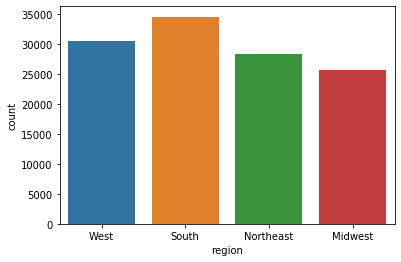

In [84]:
sns.countplot(bills.region);

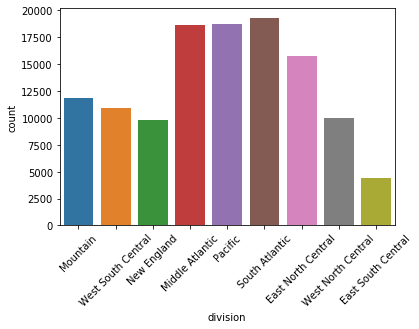

In [85]:
plt.xticks(rotation = 45)
sns.countplot(bills.division);

# Check out committee data

In [86]:
coms = pd.read_csv("./Data/committees_clean.csv")

In [87]:
coms.head()

,Congress,Committee Code,ID #,Name,Maj/Min,Rank Within Party,Party Code,Senior Party Member,Committee Seniority,Committee Period of Service,Committee Name,sponsor_match,clean_name
0,103,305.0,14307.0,"Leahy, Patrick J.",1.0,1.0,100.0,11.0,19.0,2.0,"Agriculture, Nutrition, and Forestry",Patrick J. Leahy 103,Patrick J. Leahy
1,103,305.0,10791.0,"Pryor, David",1.0,2.0,100.0,0.0,15.0,2.0,"Agriculture, Nutrition, and Forestry",David Pryor 103,David Pryor
2,103,305.0,14700.0,"Boren, David L.",1.0,3.0,100.0,0.0,15.0,2.0,"Agriculture, Nutrition, and Forestry",David L. Boren 103,David L. Boren
3,103,305.0,14705.0,"Heflin, Howell",1.0,4.0,100.0,0.0,13.0,2.0,"Agriculture, Nutrition, and Forestry",Howell Heflin 103,Howell Heflin
4,103,305.0,14230.0,"Harkin, Tom",1.0,5.0,100.0,0.0,8.0,2.0,"Agriculture, Nutrition, and Forestry",Tom Harkin 103,Tom Harkin


In [88]:
# drop congresses 103 and 104
coms = coms[coms['Congress'] != 103]
coms = coms[coms['Congress'] != 104]

In [89]:
coms['Congress'].value_counts() #why are these different? All years should be the same?

110    1420
108    1401
111    1398
107    1383
113    1331
109    1330
114    1299
112    1292
106    1276
105    1274
115    1260
Name: Congress, dtype: int64

In [90]:
#how many unique names are there per congress
pd.pivot_table(coms, columns = "Congress", values = "clean_name", aggfunc=lambda x: len(x.unique()))
#there should be 535 per congress??
#535 voting members, plus 6 ish non voting members?

Congress,105,106,107,108,109,110,111,112,113,114,115
clean_name,549,542,545,542,542,552,548,549,553,548,545


# Link bill data to sponsor committee data

## We need to make sure the name columns can match

In [91]:
coms_names = list(set(coms['clean_name'].str.strip()))
bills_names = list(set(bills['sponsor_name']))

In [92]:
coms_names

['Lindsey O. Graham',
 'Evan Jenkins',
 'Sheila Jackson Lee',
 'Ron Packard',
 'Tony Cardenas',
 'Nydia M. Velazquez',
 'Patrick J. Toomey',
 'Scott Peters',
 'Norman Sisisky',
 'Rick Crawford',
 'Albert R. Wynn',
 'Lloyd K. Smucker',
 'Gerald C. (Jerry) Weller',
 'Michele Bachmann',
 'Floyd D. Spence',
 'Stephanie Murphy',
 'Debbie Stabenow',
 'Lamar Alexander',
 'Stephen F. Lynch',
 'Tom Feeney',
 'Karen Handel',
 'Karen Bass',
 'John Faso',
 'Carolyn B. Maloney',
 'Martha Roby',
 'Michael E. McMahon',
 'Ron DeSantis',
 'Louis Stokes',
 'Mike Bishop',
 'Lynn A. Westmoreland',
 'Thomas R. Suozzi',
 'Ryan Zinke',
 'Roy Blunt',
 'John Conyers',
 'Bill Cassidy',
 'Keith J. Rothfus',
 'Dale E. Kildee',
 'Patrick T. McHenry',
 'Karen L. Thurman',
 'Elizabeth Hanford Dole',
 'Mark Walker',
 'Addison G. (Joe) Wilson',
 'Harry E. Mitchell',
 'Thaddeus G. McCotter',
 'Carol Moseley-Braun',
 'Bob Barr',
 'Henry E. Brown',
 'Lee H. Hamilton',
 'Jason Smith',
 'Ike Skelton',
 'Ronald V. Dellums',

In [93]:
print(len(list(set(coms['clean_name']))))
len(list(set(bills['sponsor_name'])))

1288


1245

In [94]:
#there are 366 that do not match
len([x for x in bills_names if x not in coms_names])

366

In [95]:
unmatched = [x for x in bills_names if x not in coms_names]

In [96]:
unmatched = pd.DataFrame(unmatched)

In [97]:
unmatched.dropna(inplace = True)

In [98]:
unmatched = unmatched.apply(lambda x: x.str.split(" "))

In [99]:
unmatched['last'] = unmatched[0].apply(lambda x: x[-1])

Patterns for those that do not match:

1) They have middle initials

2) They have a nickname in parentheses

3) Jim to James and vice versa, mike to michael, tom to thomas

In [100]:
#how many of these have the same last name?

In [101]:
from fuzzywuzzy import fuzz, process

/opt/anaconda3/lib/python3.7/site-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [102]:
import tqdm

In [103]:
# coms_names = list(set(coms['clean_name'].str.strip()))
# bills_names = list(set(bills['sponsor_name']))[1:]

# fuzzy = {}

# for c in coms_names:
#     for b in tqdm(bills_names):
#         #print(fuzz.ratio(c, b))
#         fuzzy[c, b] = (fuzz.ratio(c, b))

In [104]:
#fuzzy_match = pd.DataFrame.from_records([fuzzy])

#fuzzy_match = fuzzy_match.T

#fuzzy_match = fuzzy_match.reset_index()

# fuzzy_match['names'] =  fuzzy_match['index'].apply(lambda x:list(x)) 

# fuzzy_match['name_1'] = fuzzy_match['names'].apply(lambda x:x[0])

# fuzzy_match['name_2'] = fuzzy_match['names'].apply(lambda x:x[1])

# fuzzy_match.rename(columns = {0:"match_score"}, inplace = True)

# fuzzy_match

In [105]:
coms_names = coms['clean_name'].values
bills_names = set(bills['sponsor_name'].values)
uniq_coms_names = [i.strip() for i in set(coms_names) if i is not None]
correspondences = {}
for n in uniq_coms_names:
    match_name = process.extractOne(n, bills_names, score_cutoff=70)
    if match_name is None:
        correspondences[n] = match_name
    else:
        correspondences[n] = match_name[0]

In [106]:
# manual additions to correspondences
# coms are key, bills are value
correspondences['Elizabeth L. (Liz) Cheney'] = 'Liz Cheney'
# Denise Majette - Georgia ???
# Gregorio Sablan - northern Mariana Islands
# Anibal Acevedo-Vila - Puerto Rico
# Stacey Plaskett - US Virgin Islands
# Amata Radewagen - Samoa
# Jenniffer González - Puerto Rico
# Madeleine Z. . Bordallo - Guam
correspondences['William J. Pascrell'] = 'Bill Pascrell Jr.'
correspondences['Charles Ellis (Chuck) Schumer'] = 'Charles E. Schumer'
correspondences['Thomas Allen Coburn'] = 'Tom Coburn'
correspondences['Thomas A. Coburn'] = 'Tom Coburn'
correspondences['Tom DeLay'] = 'Thomas Dale DeLay'
correspondences['A.B. Chandler'] = 'Ben Chandler'
correspondences['Earl Benjamin (Ben) Nelson'] = 'Ben Nelson'
correspondences['William D. Delahunt'] = 'Bill DelaHunt'
correspondences['William L. Enyart'] = 'Bill Enyart'
correspondences['James V. (Jimmy) Panetta'] = 'Jimmy Panetta'
correspondences['Richard J. Santorum'] = 'Rick Santorum'
#delete: "John J. H. ``Joe'' Schwarz": 'Nick J. Rahall II'
#delete:  'Clarence William (Bill) Nelson': 'Bill Huizenga',
#delete:  'James M. (Mike) Johnson': 'Mike Simpson',
#????:  'Amata Radewagen': None,






In [107]:
correspondences

{'John Cooksey': 'John Cooksey',
 'Randy (Duke) Cunningham': "Randy 'Duke' Cunningham",
 'Mike Lee': 'Mike Lee',
 'Doug Lamborn': 'Doug Lamborn',
 'Mary Bono': 'Mary Bono Mack',
 'French Hill': 'French Hill',
 'Mike Bost': 'Mike Bost',
 'Martin Heinrich': 'Martin Heinrich',
 'Allen Boyd': 'Allen Boyd',
 'Michael Bilirakis': 'Michael Bilirakis',
 'Stephen Fincher': 'Stephen Fincher',
 'Silvestre Reyes': 'Silvestre Reyes',
 'Nancy L. Johnson': 'Nancy Lee Johnson',
 'William O. Lipinski': 'William O. Lipinski',
 'Darrell Issa': 'Darrell Issa',
 'Chuck Fleischmann': 'Chuck Fleischmann',
 'Gerald B.H. Solomon': 'Gerald B.H. Solomon',
 'George Victor Voinovich': 'George V. Voinovich',
 'Chris Gibson': 'Chris Gibson',
 'Henry B. Bonilla': 'Henry Bonilla',
 'Christopher H. Smith': 'Christopher H. Smith',
 'Richard J. Durbin': 'Richard J. Durbin',
 'Gil Gutknecht': 'Gilbert W. Gutknecht',
 'Carl Levin': 'Carl Levin',
 'Maria Cantwell': 'Maria Cantwell',
 'George Miller': 'George Miller',
 'Dan 

In [108]:
def corrmatch(x):
    return correspondences[x.strip()]

In [109]:
#apply the fuzzy matching
coms['other_name'] = coms['clean_name'].apply(corrmatch)

In [110]:
coms[coms['other_name'].isna()]

,Congress,Committee Code,ID #,Name,Maj/Min,Rank Within Party,Party Code,Senior Party Member,Committee Seniority,Committee Period of Service,Committee Name,sponsor_match,clean_name,other_name
9087,107,102.0,70601.0,"Acevedo-Vila, Anibal",2.0,21.0,999.0,0.0,1.0,2.0,Agriculture,Anibal Acevedo-Vila 107,Anibal Acevedo-Vila,None
9644,107,164.0,70601.0,"Acevedo-Vila, Anibal",2.0,20.0,999.0,0.0,1.0,2.0,Resources,Anibal Acevedo-Vila 107,Anibal Acevedo-Vila,None
9842,107,184.0,70601.0,"Acevedo-Vila, Anibal",7.0,2.0,999.0,0.0,1.0,2.0,Small Business,Anibal Acevedo-Vila 107,Anibal Acevedo-Vila,None
10034,108,102.0,70601.0,"Acevedo-Vila, Anibal",2.0,14.0,999.0,0.0,2.0,2.0,Agriculture,Anibal Acevedo-Vila 108,Anibal Acevedo-Vila,None
10173,108,106.0,70701.0,"Bordallo, Madeleine Z. .",2.0,27.0,100.0,0.0,1.0,2.0,National Security,Madeleine Z. . Bordallo 108,Madeleine Z. . Bordallo,None
10293,108,115.0,20318.0,"Majette, Denise",2.0,19.0,100.0,0.0,1.0,2.0,Budget,Denise Majette 108,Denise Majette,None
10342,108,124.0,20318.0,"Majette, Denise",2.0,20.0,100.0,0.0,1.0,2.0,Education and the Workforce,Denise Majette 108,Denise Majette,None
10598,108,164.0,70601.0,"Acevedo-Vila, Anibal",2.0,18.0,100.0,0.0,2.0,2.0,Resources,Anibal Acevedo-Vila 108,Anibal Acevedo-Vila,None
10602,108,164.0,70701.0,"Bordallo, Madeleine Z. .",2.0,22.0,100.0,0.0,1.0,2.0,Resources,Madeleine Z. . Bordallo 108,Madeleine Z. . Bordallo,None
10783,108,184.0,70601.0,"Acevedo-Vila, Anibal",2.0,13.0,100.0,0.0,2.0,2.0,Small Business,Anibal Acevedo-Vila 108,Anibal Acevedo-Vila,None


In [111]:
coms

,Congress,Committee Code,ID #,Name,Maj/Min,Rank Within Party,Party Code,Senior Party Member,Committee Seniority,Committee Period of Service,Committee Name,sponsor_match,clean_name,other_name
798,105,305.0,14506.0,"Lugar, Richard G.",1.0,1.0,200.0,11.0,21.0,2.0,"Agriculture, Nutrition, and Forestry",Richard G. Lugar 105,Richard G. Lugar,Richard G. Lugar
799,105,305.0,14105.0,"Helms, Jesse",1.0,2.0,200.0,0.0,25.0,2.0,"Agriculture, Nutrition, and Forestry",Jesse Helms 105,Jesse Helms,Jesse Helms
800,105,305.0,14009.0,"Cochran, Thad",1.0,3.0,200.0,0.0,19.0,2.0,"Agriculture, Nutrition, and Forestry",Thad Cochran 105,Thad Cochran,Thad Cochran
801,105,305.0,14921.0,"McConnell, Mitch",1.0,4.0,200.0,0.0,12.0,2.0,"Agriculture, Nutrition, and Forestry",Mitch McConnell 105,Mitch McConnell,Mitch McConnell
802,105,305.0,49301.0,"Coverdell, Paul",1.0,5.0,200.0,0.0,5.0,2.0,"Agriculture, Nutrition, and Forestry",Paul Coverdell 105,Paul Coverdell,Paul Coverdell
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17289,115,196.0,20310.0,"Sanchez, Linda",2.0,13.0,100.0,0.0,3.0,2.0,Ways and Means,Linda Sanchez 115,Linda Sanchez,Linda T. Sánchez
17290,115,196.0,20519.0,"Higgins, Brian",2.0,14.0,100.0,0.0,1.0,2.0,Ways and Means,Brian Higgins 115,Brian Higgins,Brian Higgins
17291,115,196.0,21102.0,"Sewell, Terri A.",2.0,15.0,100.0,0.0,1.0,2.0,Ways and Means,Terri A. Sewell 115,Terri A. Sewell,Terri Sewell
17292,115,196.0,31101.0,"DelBene, Suzan",2.0,16.0,100.0,0.0,1.0,2.0,Ways and Means,Suzan DelBene 115,Suzan DelBene,Suzan K. DelBene


In [112]:
coms['new_sponsor_match'] = coms['other_name'].map(str) + ' ' + coms['Congress'].map(str)

In [113]:
bills['new_sponsor_match'] = bills['sponsor_name'].map(str) + ' ' + bills['congress']

In [114]:
set(coms['clean_name'][coms['other_name'].isna()])

{' Amata Radewagen',
 ' Anibal Acevedo-Vila',
 ' Denise Majette',
 ' Gregorio Sablan',
 ' Jenniffer González',
 ' Madeleine Z. . Bordallo',
 ' Stacey Plaskett'}

In [115]:
#add matched name column to the end. Merge matched name back to the coms and bills dataframes. Then join coms and bills on the new, matching column

## First get overall seniority per congress for each sponsor

In [116]:
mini_coms = coms[["new_sponsor_match", "Maj/Min", "Rank Within Party", "Senior Party Member"]]

In [117]:
mini_coms

,new_sponsor_match,Maj/Min,Rank Within Party,Senior Party Member
798,Richard G. Lugar 105,1.0,1.0,11.0
799,Jesse Helms 105,1.0,2.0,0.0
800,Thad Cochran 105,1.0,3.0,0.0
801,Mitch McConnell 105,1.0,4.0,0.0
802,Paul Coverdell 105,1.0,5.0,0.0
...,...,...,...,...
17289,Linda T. Sánchez 115,2.0,13.0,0.0
17290,Brian Higgins 115,2.0,14.0,0.0
17291,Terri Sewell 115,2.0,15.0,0.0
17292,Suzan K. DelBene 115,2.0,16.0,0.0


In [118]:
mini_coms.drop_duplicates(inplace = True)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [119]:
mini_coms[mini_coms['new_sponsor_match'].duplicated()]

,new_sponsor_match,Maj/Min,Rank Within Party,Senior Party Member
817,Thad Cochran 105,1.0,2.0,0.0
822,Mitch McConnell 105,1.0,7.0,0.0
828,Larry E. Craig 105,1.0,13.0,0.0
834,Patrick J. Leahy 105,2.0,4.0,0.0
837,Tom Harkin 105,2.0,7.0,0.0
...,...,...,...,...
17289,Linda T. Sánchez 115,2.0,13.0,0.0
17290,Brian Higgins 115,2.0,14.0,0.0
17291,Terri Sewell 115,2.0,15.0,0.0
17292,Suzan K. DelBene 115,2.0,16.0,0.0


In [120]:
mini_coms = mini_coms.groupby("new_sponsor_match").mean()

In [121]:
final = pd.merge(bills, mini_coms, how = 'left', on = "new_sponsor_match")

In [122]:
final

,bill_id,bill_type,title,sponsor_title,sponsor_id,sponsor_name,sponsor_state,sponsor_party,introduced_date,last_vote,...,final_status_5,final_status_3,law,final_status_coms,region,division,new_sponsor_match,Maj/Min,Rank Within Party,Senior Party Member
0,s1-115,s,An original bill to provide for reconciliation...,Sen.,E000285,Michael B. Enzi,WY,R,2017-11-28,0,...,Referred to full chamber,Progress made,Failed,Action taken on bill,West,Mountain,Michael B. Enzi 115,1.000000,4.400000,2.200000
1,s1760-107,s,A bill to amend title XVIII of the Social Secu...,Sen.,T000162,Craig Thomas,WY,R,2001-12-04,0,...,Referred to committee/subcommittee,Referred to committee/subcommittee,Failed,Referred to committee,West,Mountain,Craig Thomas 107,3.000000,4.400000,0.000000
2,sconres3-115,sconres,A concurrent resolution setting forth the cong...,Sen.,E000285,Michael B. Enzi,WY,R,2017-01-03,1,...,Passed one chamber,Progress made,Failed,Action taken on bill,West,Mountain,Michael B. Enzi 115,1.000000,4.400000,2.200000
3,hr4717-109,hr,To designate the National Museum of Wildlife A...,Rep.,C000962,Barbara L. Cubin,WY,R,2006-02-08,0,...,Referred to committee/subcommittee,Referred to committee/subcommittee,Failed,Referred to committee,West,Mountain,Barbara L. Cubin 109,1.000000,9.000000,0.000000
4,s1691-114,s,A bill to expedite and prioritize forest manag...,Sen.,B001261,John Barrasso,WY,R,2015-06-25,0,...,Action in committee,Progress made,Failed,Action taken on bill,West,Mountain,John Barrasso 114,1.000000,4.000000,2.750000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119355,hres415-106,hres,Expressing the sense of the House of Represent...,Rep.,M000797,Patsy T. Mink,HI,D,2000-02-02,1,...,Referred to full chamber,Progress made,Failed,Action taken on bill,West,Pacific,Patsy T. Mink 106,2.000000,7.500000,0.000000
119356,hr2287-113,hr,To amend the Elementary and Secondary Educatio...,Rep.,G000571,Tulsi Gabbard,HI,D,2013-06-06,0,...,Referred to committee/subcommittee,Referred to committee/subcommittee,Failed,Referred to committee,West,Pacific,Tulsi Gabbard 113,3.666667,11.333333,0.000000
119357,s550-110,s,A bill to preserve existing judgeships on the ...,Sen.,A000069,Daniel K. Akaka,HI,D,2007-02-12,0,...,Law!,Law,Law,Action taken on bill,West,Pacific,Daniel K. Akaka 110,1.000000,4.000000,1.833333
119358,hres68-111,hres,Supports the establishment of an NCAA Division...,Rep.,A000014,Neil Abercrombie,HI,D,2009-01-15,0,...,Referred to committee/subcommittee,Referred to committee/subcommittee,Failed,Referred to committee,West,Pacific,Neil Abercrombie 111,1.000000,4.500000,0.000000


In [123]:
len(set(final[final['Rank Within Party'].isna()]['sponsor_name']))

109

In [124]:
# the 118 names that we do not have matched/do not have result in almost 9000 bills without rank data

In [125]:
#at some point do we just drop them?

## If sponsor is in committee that bill is in, link data

In [126]:
#check out 

In [127]:
bills['new_sponsor_match'].value_counts()

Bob Casey 112                 218
Robert Menendez 112           195
Hillary Rodham Clinton 110    163
Richard J. Santorum 109       146
Charles E. Schumer 111        141
                             ... 
Carte P. Goodwin 111            1
Mike Bishop 114                 1
Nancy Pelosi 114                1
Jim Bridenstine 115             1
J. Dennis Hastert 106           1
Name: new_sponsor_match, Length: 5955, dtype: int64

In [128]:
len(set(bills['sponsor_name']))

1245

In [129]:
coms.drop(columns = ['Congress', "ID #", "Committee Code", "Name", "Party Code"], inplace = True)

In [130]:
coms.rename(columns = {"Maj/Min":"sponsor_maj/min", "Rank Within Party": "sponsor_party_rank", "Senior Party Member": "sponsor_senior_party_member", "Committee Seniority":"sponsor_committee_seniority", "Committee Period of Service":"sponsor_com_period_of_service", "Committee Name":"sponsor_committee_name"}, inplace = True)

In [131]:
set(bills['congress'])

{'105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115'}

In [132]:
coms_assignments = {}
for idx, row in coms[['new_sponsor_match', 'sponsor_committee_name']].iterrows():
    print (row['new_sponsor_match'])
    print (row['sponsor_committee_name'])
    print ()
    try:
        coms_assignments[row['new_sponsor_match']].append(row['sponsor_committee_name'])
    except KeyError:
        coms_assignments[row['new_sponsor_match']] = [row['sponsor_committee_name']]

Richard G. Lugar 105
Agriculture, Nutrition, and Forestry

Jesse Helms 105
Agriculture, Nutrition, and Forestry

Thad Cochran 105
Agriculture, Nutrition, and Forestry

Mitch McConnell 105
Agriculture, Nutrition, and Forestry

Paul Coverdell 105
Agriculture, Nutrition, and Forestry

Eric Cantor 105
Agriculture, Nutrition, and Forestry

Pat Roberts 105
Agriculture, Nutrition, and Forestry

Charles E. Grassley 105
Agriculture, Nutrition, and Forestry

Phil Gramm 105
Agriculture, Nutrition, and Forestry

Larry E. Craig 105
Agriculture, Nutrition, and Forestry

Tom Harkin 105
Agriculture, Nutrition, and Forestry

Patrick J. Leahy 105
Agriculture, Nutrition, and Forestry

Kent Conrad 105
Agriculture, Nutrition, and Forestry

Thomas A. Daschle 105
Agriculture, Nutrition, and Forestry

Max Baucus 105
Agriculture, Nutrition, and Forestry

J. Robert Kerrey 105
Agriculture, Nutrition, and Forestry

Mary L. Landrieu 105
Agriculture, Nutrition, and Forestry

Tim Johnson 105
Agriculture, Nutrition, 

Harry Reid 106
Appropriations

Herb Kohl 106
Appropriations

Patty Murray 106
Appropriations

Byron L. Dorgan 106
Appropriations

Dianne Feinstein 106
Appropriations

Richard J. Durbin 106
Appropriations

John W. Warner 106
Armed Services

Strom Thurmond 106
Armed Services

John McCain 106
Armed Services

Robert F. Smith 106
Armed Services

James M. Inhofe 106
Armed Services

Eric Cantor 106
Armed Services

Olympia J. Snowe 106
Armed Services

Pat Roberts 106
Armed Services

Wayne A. Allard 106
Armed Services

Tim Hutchinson 106
Armed Services

Jeff Sessions 106
Armed Services

Carl Levin 106
Armed Services

Edward M. Kennedy 106
Armed Services

Jeff Bingaman 106
Armed Services

Robert C. Byrd 106
Armed Services

Charles S. Robb 106
Armed Services

Joseph I. Lieberman 106
Armed Services

Max Cleland 106
Armed Services

Mary L. Landrieu 106
Armed Services

Jack Reed 106
Armed Services

Phil Gramm 106
Banking, Housing, and Urban Affairs

Richard C. Shelby 106
Banking, Housing, and Urban 

Bill Cassidy 107
Armed Services

Ben Nelson 107
Armed Services

Jean Carnahan 107
Armed Services

Mark Dayton 107
Armed Services

John W. Warner 107
Armed Services

Strom Thurmond 107
Armed Services

John McCain 107
Armed Services

Robert F. Smith 107
Armed Services

James M. Inhofe 107
Armed Services

Eric Cantor 107
Armed Services

Pat Roberts 107
Armed Services

Wayne A. Allard 107
Armed Services

Tim Hutchinson 107
Armed Services

Jeff Sessions 107
Armed Services

Susan Collins 107
Armed Services

David A. Brat 107
Armed Services

Jeff Bingaman 107
Armed Services

Paul S. Sarbanes 107
Banking, Housing, and Urban Affairs

Christopher J. Dodd 107
Banking, Housing, and Urban Affairs

Tim Johnson 107
Banking, Housing, and Urban Affairs

Jack Reed 107
Banking, Housing, and Urban Affairs

Charles E. Schumer 107
Banking, Housing, and Urban Affairs

Evan Bayh 107
Banking, Housing, and Urban Affairs

Zell Bryan Miller 107
Banking, Housing, and Urban Affairs

Thomas R. Carper 107
Banking, Ho

Ann Wagner 108
Budget

Jon Stevens Corzine 108
Budget

John McCain 108
Commerce, Science, and Transportation

Ted F. Stevens 108
Commerce, Science, and Transportation

Conrad Burns 108
Commerce, Science, and Transportation

Trent Lott 108
Commerce, Science, and Transportation

Kay Bailey Hutchison 108
Commerce, Science, and Transportation

Olympia J. Snowe 108
Commerce, Science, and Transportation

Dale E. Kildee 108
Commerce, Science, and Transportation

Gordon Harold Smith 108
Commerce, Science, and Transportation

Peter G. Fitzgerald 108
Commerce, Science, and Transportation

John Ensign 108
Commerce, Science, and Transportation

George V. Voinovich 108
Commerce, Science, and Transportation

John E. Sununu 108
Commerce, Science, and Transportation

Ernest F. Hollings 108
Commerce, Science, and Transportation

Daniel K. Inouye 108
Commerce, Science, and Transportation

John D. Rockefeller IV 108
Commerce, Science, and Transportation

John Kerry 108
Commerce, Science, and Transportati

Daniel K. Inouye 109
Commerce, Science, and Transportation

John D. Rockefeller IV 109
Commerce, Science, and Transportation

John Kerry 109
Commerce, Science, and Transportation

Byron L. Dorgan 109
Commerce, Science, and Transportation

Barbara Boxer 109
Commerce, Science, and Transportation

Bill Cassidy 109
Commerce, Science, and Transportation

Maria Cantwell 109
Commerce, Science, and Transportation

Frank R. Lautenberg 109
Commerce, Science, and Transportation

Ben Nelson 109
Commerce, Science, and Transportation

Mark Pryor 109
Commerce, Science, and Transportation

Pete V. Domenici 109
Energy and Natural Resources

Larry E. Craig 109
Energy and Natural Resources

Craig Thomas 109
Energy and Natural Resources

Lamar Alexander 109
Energy and Natural Resources

Lisa Murkowski 109
Energy and Natural Resources

Richard M. Burr 109
Energy and Natural Resources

Major R. Owens 109
Energy and Natural Resources

James M. Talent 109
Energy and Natural Resources

Conrad Burns 109
Energy 

Jim DeMint 110
Energy and Natural Resources

Gordon Harold Smith 110
Energy and Natural Resources

David A. Brat 110
Energy and Natural Resources

Major R. Owens 110
Energy and Natural Resources

Bob Corker 110
Energy and Natural Resources

Jeff Sessions 110
Energy and Natural Resources

John Barrasso 110
Energy and Natural Resources

Barbara Boxer 110
Environment and Public Works

Max Baucus 110
Environment and Public Works

Joseph I. Lieberman 110
Environment and Public Works

Thomas R. Carper 110
Environment and Public Works

Hillary Rodham Clinton 110
Environment and Public Works

Frank R. Lautenberg 110
Environment and Public Works

Benjamin L. Cardin 110
Environment and Public Works

Bernard Sanders 110
Environment and Public Works

Amy Klobuchar 110
Environment and Public Works

Sheldon Whitehouse 110
Environment and Public Works

James M. Inhofe 110
Environment and Public Works

John W. Warner 110
Environment and Public Works

George V. Voinovich 110
Environment and Public Work

Claire McCaskill 111
Commerce, Science, and Transportation

Amy Klobuchar 111
Commerce, Science, and Transportation

Tom Udall 111
Commerce, Science, and Transportation

Mark Warner 111
Commerce, Science, and Transportation

Mark Begich 111
Commerce, Science, and Transportation

Kay Bailey Hutchison 111
Commerce, Science, and Transportation

Olympia J. Snowe 111
Commerce, Science, and Transportation

John Ensign 111
Commerce, Science, and Transportation

Jim DeMint 111
Commerce, Science, and Transportation

John Thune 111
Commerce, Science, and Transportation

Roger Wicker 111
Commerce, Science, and Transportation

Johnny Isakson 111
Commerce, Science, and Transportation

David Vitter 111
Commerce, Science, and Transportation

Dale E. Kildee 111
Commerce, Science, and Transportation

Major R. Owens 111
Commerce, Science, and Transportation

Mike Johanns 111
Commerce, Science, and Transportation

George S. LeMieux 111
Commerce, Science, and Transportation

Jeff Bingaman 111
Energy and N

Rob Portman 112
Energy and Natural Resources

John Hoeven 112
Energy and Natural Resources

Bob Corker 112
Energy and Natural Resources

Dean Heller 112
Energy and Natural Resources

Barbara Boxer 112
Environment and Public Works

Max Baucus 112
Environment and Public Works

Thomas R. Carper 112
Environment and Public Works

Frank R. Lautenberg 112
Environment and Public Works

Benjamin L. Cardin 112
Environment and Public Works

Bernard Sanders 112
Environment and Public Works

Sheldon Whitehouse 112
Environment and Public Works

Tom Udall 112
Environment and Public Works

Jeff Merkley 112
Environment and Public Works

Kirsten E. Gillibrand 112
Environment and Public Works

James M. Inhofe 112
Environment and Public Works

David Vitter 112
Environment and Public Works

John Barrasso 112
Environment and Public Works

Jeff Sessions 112
Environment and Public Works

Michael D. Crapo 112
Environment and Public Works

Lamar Alexander 112
Environment and Public Works

Mike Johanns 112
Envir

Environment and Public Works

Thomas R. Carper 113
Environment and Public Works

Frank R. Lautenberg 113
Environment and Public Works

Benjamin L. Cardin 113
Environment and Public Works

Bernard Sanders 113
Environment and Public Works

Sheldon Whitehouse 113
Environment and Public Works

Tom Udall 113
Environment and Public Works

Jeff Merkley 113
Environment and Public Works

Kirsten E. Gillibrand 113
Environment and Public Works

Mazie K. Hirono 113
Environment and Public Works

Cory Booker 113
Environment and Public Works

Edward J. Markey 113
Environment and Public Works

David Vitter 113
Environment and Public Works

James M. Inhofe 113
Environment and Public Works

John Barrasso 113
Environment and Public Works

Jeff Sessions 113
Environment and Public Works

Michael D. Crapo 113
Environment and Public Works

Roger Wicker 113
Environment and Public Works

John Boozman 113
Environment and Public Works

Deb Fischer 113
Environment and Public Works

Max Baucus 113
Finance

John D.

Bob Casey 114
Finance

Mark Warner 114
Finance

Orrin G. Hatch 114
Finance

Charles E. Grassley 114
Finance

Michael D. Crapo 114
Finance

Pat Roberts 114
Finance

Michael B. Enzi 114
Finance

John Cornyn 114
Finance

John Thune 114
Finance

Richard M. Burr 114
Finance

Johnny Isakson 114
Finance

Rob Portman 114
Finance

Patrick J. Toomey 114
Finance

Daniel Coats 114
Finance

Dean Heller 114
Finance

Tim Scott 114
Finance

Robert Menendez 114
Foreign Relations

Barbara Boxer 114
Foreign Relations

Benjamin L. Cardin 114
Foreign Relations

Jeanne Shaheen 114
Foreign Relations

Christopher A. Coons 114
Foreign Relations

Tom Udall 114
Foreign Relations

Christopher S. Murphy 114
Foreign Relations

Tim Kaine 114
Foreign Relations

Edward J. Markey 114
Foreign Relations

Bob Corker 114
Foreign Relations

F. James Sensenbrenner 114
Foreign Relations

Marco Rubio 114
Foreign Relations

Ron Johnson 114
Foreign Relations

Jeff Flake 114
Foreign Relations

Cory Gardner 114
Foreign Relations



Roger Wicker 115
Environment and Public Works

Deb Fischer 115
Environment and Public Works

Jeff Sessions 115
Environment and Public Works

Jerry Moran 115
Environment and Public Works

Mike Rounds 115
Environment and Public Works

Joni Ernst 115
Environment and Public Works

Dan Sullivan 115
Environment and Public Works

Richard C. Shelby 115
Environment and Public Works

Ron Wyden 115
Finance

Ann Wagner 115
Finance

Maria Cantwell 115
Finance

Bill Cassidy 115
Finance

Robert Menendez 115
Finance

Thomas R. Carper 115
Finance

Benjamin L. Cardin 115
Finance

Sherrod Brown 115
Finance

Michael Bennet 115
Finance

Bob Casey 115
Finance

Mark Warner 115
Finance

Claire McCaskill 115
Finance

Orrin G. Hatch 115
Finance

Charles E. Grassley 115
Finance

Michael D. Crapo 115
Finance

Pat Roberts 115
Finance

Michael B. Enzi 115
Finance

John Cornyn 115
Finance

John Thune 115
Finance

Richard M. Burr 115
Finance

Johnny Isakson 115
Finance

Rob Portman 115
Finance

Patrick J. Toomey 115


Rick Hill 105
BANKING AND FINANCIAL SERVICES

Pete Sessions 105
BANKING AND FINANCIAL SERVICES

Steven C. LaTourette 105
BANKING AND FINANCIAL SERVICES

Henry B. Gonzalez 105
BANKING AND FINANCIAL SERVICES

John J. LaFalce 105
BANKING AND FINANCIAL SERVICES

Bruce F. Vento 105
BANKING AND FINANCIAL SERVICES

Charles E. Schumer 105
BANKING AND FINANCIAL SERVICES

Barney Frank 105
BANKING AND FINANCIAL SERVICES

Paul E. Kanjorski 105
BANKING AND FINANCIAL SERVICES

Joseph P. Kennedy II 105
BANKING AND FINANCIAL SERVICES

Floyd H. Flake 105
BANKING AND FINANCIAL SERVICES

Maxine Waters 105
BANKING AND FINANCIAL SERVICES

Carolyn B. Maloney 105
BANKING AND FINANCIAL SERVICES

Luis V. Gutiérrez 105
BANKING AND FINANCIAL SERVICES

Lucille Roybal-Allard 105
BANKING AND FINANCIAL SERVICES

Thomas M. Barrett 105
BANKING AND FINANCIAL SERVICES

Nydia M. Velázquez 105
BANKING AND FINANCIAL SERVICES

Melvin Watt 105
BANKING AND FINANCIAL SERVICES

Maurice D. Hinchey 105
BANKING AND FINANCIAL SERVI

Elijah E. Cummings 105
Transportation and Infrastructure

Max A. Sandlin 105
Transportation and Infrastructure

Ellen O. Tauscher 105
Transportation and Infrastructure

Bill Pascrell Jr. 105
Transportation and Infrastructure

Jay W. Johnson 105
Transportation and Infrastructure

Leonard L. Boswell 105
Transportation and Infrastructure

Jim McGovern 105
Transportation and Infrastructure

Jon D. Fox 105
Transportation and Infrastructure

Thomas M. Davis 105
Transportation and Infrastructure

Frank A. LoBiondo 105
Transportation and Infrastructure

J.C. Watts 105
Transportation and Infrastructure

Jerry Moran 105
Transportation and Infrastructure

Earl Blumenauer 105
Transportation and Infrastructure

Tim Holden 105
Transportation and Infrastructure

Nicholas V. Lampson 105
Transportation and Infrastructure

Marion Berry 105
Transportation and Infrastructure

Vito J. Fossella 105
Transportation and Infrastructure

John Baldacci 105
Transportation and Infrastructure

Gerald B.H. Solomon 10

Bob Barr 106
BANKING AND FINANCIAL SERVICES

Sue W. Kelly 106
BANKING AND FINANCIAL SERVICES

Ron Paul 106
BANKING AND FINANCIAL SERVICES

David J. Weldon 106
BANKING AND FINANCIAL SERVICES

Jim R. Ryun 106
BANKING AND FINANCIAL SERVICES

Merrill Cook 106
BANKING AND FINANCIAL SERVICES

Bob Riley 106
BANKING AND FINANCIAL SERVICES

Rick Hill 106
BANKING AND FINANCIAL SERVICES

Donald Manzullo 106
BANKING AND FINANCIAL SERVICES

Walter B. Jones 106
BANKING AND FINANCIAL SERVICES

Paul D. Ryan 106
BANKING AND FINANCIAL SERVICES

Doug Ose 106
BANKING AND FINANCIAL SERVICES

John E. Sweeney 106
BANKING AND FINANCIAL SERVICES

Judy Biggert 106
BANKING AND FINANCIAL SERVICES

Lee Terry 106
BANKING AND FINANCIAL SERVICES

Mark A. Green 106
BANKING AND FINANCIAL SERVICES

Patrick J. Toomey 106
BANKING AND FINANCIAL SERVICES

John J. LaFalce 106
BANKING AND FINANCIAL SERVICES

Bruce F. Vento 106
BANKING AND FINANCIAL SERVICES

Barney Frank 106
BANKING AND FINANCIAL SERVICES

Paul E. Kanjorski 1

INTERNATIONAL RELATIONS

John Cooksey 106
INTERNATIONAL RELATIONS

Thomas G. Tancredo 106
INTERNATIONAL RELATIONS

Sam Gejdenson 106
INTERNATIONAL RELATIONS

Tom Lantos 106
INTERNATIONAL RELATIONS

Howard L. Berman 106
INTERNATIONAL RELATIONS

Gary L. Ackerman 106
INTERNATIONAL RELATIONS

Floyd H. Flake 106
INTERNATIONAL RELATIONS

Matthew G. Martinez 106
INTERNATIONAL RELATIONS

Donald M. Payne 106
INTERNATIONAL RELATIONS

Robert Menendez 106
INTERNATIONAL RELATIONS

Sherrod Brown 106
INTERNATIONAL RELATIONS

Cynthia McKinney 106
INTERNATIONAL RELATIONS

Alcee L. Hastings 106
INTERNATIONAL RELATIONS

Pat Danner 106
INTERNATIONAL RELATIONS

Earl F. Hilliard 106
INTERNATIONAL RELATIONS

Brad Sherman 106
INTERNATIONAL RELATIONS

Robert Wexler 106
INTERNATIONAL RELATIONS

Steven R. Rothman 106
INTERNATIONAL RELATIONS

Jim Bridenstine 106
INTERNATIONAL RELATIONS

Earl Pomeroy 106
INTERNATIONAL RELATIONS

Bill DelaHunt 106
INTERNATIONAL RELATIONS

Gregory W. Meeks 106
INTERNATIONAL RELATION

Spencer Bachus 106
Veterans Affairs

Cliff Stearns 106
Veterans Affairs

Jerry Moran 106
Veterans Affairs

John D. Hayworth 106
Veterans Affairs

Helen Chenoweth-Hage 106
Veterans Affairs

Ray H. LaHood 106
Veterans Affairs

James V. Hansen 106
Veterans Affairs

Howard P. McKeon 106
Veterans Affairs

James A. Gibbons 106
Veterans Affairs

Mike Simpson 106
Veterans Affairs

Lane A. Evans 106
Veterans Affairs

Bob Filner 106
Veterans Affairs

Luis V. Gutiérrez 106
Veterans Affairs

Corrine Brown 106
Veterans Affairs

Mike Doyle 106
Veterans Affairs

Collin C. Peterson 106
Veterans Affairs

Julia M. Carson 106
Veterans Affairs

Silvestre Reyes 106
Veterans Affairs

Vic Snyder 106
Veterans Affairs

Ciro D. Rodriguez 106
Veterans Affairs

Ronnie Shows 106
Veterans Affairs

Shelley Berkley 106
Veterans Affairs

Baron P. Hill 106
Veterans Affairs

Tom Udall 106
Veterans Affairs

Richard Hugh Baker 106
Veterans Affairs

Bill Archer 106
Ways and Means

Philip M. Crane 106
Ways and Means

Willia

Hilda L. Solis 107
Education and the Workforce

Robert W. Goodlatte 107
Education and the Workforce

Anna G. Eshoo 107
Education and the Workforce

Susan A. Davis 107
Education and the Workforce

John W. Olver 107
Energy and Commerce

Michael Bilirakis 107
Energy and Commerce

Joe L. Barton 107
Energy and Commerce

Fred Upton 107
Energy and Commerce

Cliff Stearns 107
Energy and Commerce

Paul E. Gillmor 107
Energy and Commerce

James C. Greenwood 107
Energy and Commerce

Christopher Cox 107
Energy and Commerce

Nathan Deal 107
Energy and Commerce

Steve Largent 107
Energy and Commerce

Richard M. Burr 107
Energy and Commerce

Edward Whitfield 107
Energy and Commerce

Greg Ganske 107
Energy and Commerce

Charles W. Norwood 107
Energy and Commerce

Barbara L. Cubin 107
Energy and Commerce

John Shimkus 107
Energy and Commerce

Heather A. Wilson 107
Energy and Commerce

John Shadegg 107
Energy and Commerce

Charles W. Pickering 107
Energy and Commerce

Vito J. Fossella 107
Energy and Com

Small Business

Mike Pence 107
Small Business

Mike Lee 107
Small Business

Darrell Issa 107
Small Business

Sam Graves 107
Small Business

Edward L. Schrock 107
Small Business

Felix J. Grucci Jr. 107
Small Business

Todd Akin 107
Small Business

Nydia M. Velázquez 107
Small Business

Juanita Millender-McDonald 107
Small Business

Danny K. Davis 107
Small Business

Carolyn McCarthy 107
Small Business

Bill Pascrell Jr. 107
Small Business

Rubén Hinojosa 107
Small Business

Ann Marie Buerkle 107
Small Business

Robert A. Brady 107
Small Business

Tom Udall 107
Small Business

Dennis Moore 107
Small Business

Stephanie Tubbs Jones 107
Small Business

Charles Djou 107
Small Business

David D. Phelps 107
Small Business

Grace F. Napolitano 107
Small Business

Brian Baird 107
Small Business

Shelley Berkley 107
Small Business

Mark Udall 107
Small Business

Brad Carson 107
Small Business

Mike Ross 107
Small Business

Shelley Moore Capito 107
Small Business

Bill Shuster 107
Small Business

James P. Moran 108
Budget

Darlene Hooley 108
Budget

Tammy Baldwin 108
Budget

Dennis Moore 108
Budget

John Lewis 108
Budget

Richard E. Neal 108
Budget

Rosa DeLauro 108
Budget

Chet Edwards 108
Budget

Robert C. Scott 108
Budget

Harold E. Ford Jr. 108
Budget

Lois Capps 108
Budget

Mike Thompson 108
Budget

Brian Baird 108
Budget

Jim Cooper 108
Budget

Kendrick B. Meek 108
Budget

Rahm Emanuel 108
Budget

Artur Davis 108
Budget

None 108
Budget

Ron Kind 108
Budget

John A. Boehner 108
Education and the Workforce

Tom Petri 108
Education and the Workforce

Cass Ballenger 108
Education and the Workforce

Peter Hoekstra 108
Education and the Workforce

Howard P. McKeon 108
Education and the Workforce

Michael N. Castle 108
Education and the Workforce

Sam Johnson 108
Education and the Workforce

James C. Greenwood 108
Education and the Workforce

Mark Souder 108
Education and the Workforce

Charles W. Norwood 108
Education and the Workforce

Fred Upton 108
Education and the Workfor

Jim McGovern 108
Rules

Alcee L. Hastings 108
Rules

Adam H. Putnam 108
Rules

Sherwood L. Boehlert 108
Science and Technology

Lamar Smith 108
Science and Technology

Christopher H. Shays 108
Science and Technology

W. Curtis Weldon 108
Science and Technology

Dana Rohrabacher 108
Science and Technology

Joe L. Barton 108
Science and Technology

Ken Calvert 108
Science and Technology

Nick Smith 108
Science and Technology

Roscoe G. Bartlett 108
Science and Technology

Vernon J. Ehlers 108
Science and Technology

Gilbert W. Gutknecht 108
Science and Technology

George R. Nethercutt 108
Science and Technology

Frank D. Lucas 108
Science and Technology

Judy Biggert 108
Science and Technology

Wayne T. Gilchrest 108
Science and Technology

Todd Akin 108
Science and Technology

Timothy V. Johnson 108
Science and Technology

Melissa A. Hart 108
Science and Technology

John Sullivan 108
Science and Technology

J. Randy Forbes 108
Science and Technology

Phil Gingrey 108
Science and Technol

Kendrick B. Meek 109
Armed Services

None 109
Armed Services

Ryan Zinke 109
Armed Services

Mark Udall 109
Armed Services

George Holding 109
Armed Services

Cynthia McKinney 109
Armed Services

Dan Boren 109
Armed Services

Brian P. Bilbray 109
Armed Services

Michael G. Oxley 109
Financial Services

James A. Leach 109
Financial Services

Richard Hugh Baker 109
Financial Services

Deborah D. Pryce 109
Financial Services

Spencer Bachus 109
Financial Services

Michael N. Castle 109
Financial Services

Peter T. King 109
Financial Services

Ed Perlmutter 109
Financial Services

Frank D. Lucas 109
Financial Services

Robert William Ney 109
Financial Services

Sue W. Kelly 109
Financial Services

Ron Paul 109
Financial Services

Paul E. Gillmor 109
Financial Services

Jim R. Ryun 109
Financial Services

Steven C. LaTourette 109
Financial Services

Donald Manzullo 109
Financial Services

Walter B. Jones 109
Financial Services

Judy Biggert 109
Financial Services

Christopher H. Shays 109
F

Sam Graves 109
Transportation and Infrastructure

Mark R. Kennedy 109
Transportation and Infrastructure

Bill Shuster 109
Transportation and Infrastructure

John Boozman 109
Transportation and Infrastructure

Steve Pearce 109
Transportation and Infrastructure

Jim Gerlach 109
Transportation and Infrastructure

Mario Diaz-Balart 109
Transportation and Infrastructure

C.A. Dutch Ruppersberger 109
Transportation and Infrastructure

Thomas William Osborne 109
Transportation and Infrastructure

Kenny Marchant 109
Transportation and Infrastructure

Michael E. Sodrel 109
Transportation and Infrastructure

Charlie Dent 109
Transportation and Infrastructure

Ted Poe 109
Transportation and Infrastructure

David Wu 109
Transportation and Infrastructure

Connie Mack 109
Transportation and Infrastructure

John Faso 109
Transportation and Infrastructure

Michael G. Fitzpatrick 109
Transportation and Infrastructure

Lynn Westmoreland 109
Transportation and Infrastructure

Charles Boustany Jr. 109
Tra

Robert B. Aderholt 110
Appropriations

Jo Ann Emerson 110
Appropriations

Kay Granger 110
Appropriations

John E. Peterson 110
Appropriations

Virgil H. Goode 110
Appropriations

John T. Doolittle 110
Appropriations

Ray H. LaHood 110
Appropriations

David J. Weldon 110
Appropriations

Mike Simpson 110
Appropriations

John Culberson 110
Appropriations

Mark Adam Foley 110
Appropriations

Ander Crenshaw 110
Appropriations

Denny Rehberg 110
Appropriations

John Carter 110
Appropriations

Rodney Alexander 110
Appropriations

Ken Calvert 110
Appropriations

Jo Bonner 110
APPROPRIATIONS

Ike Skelton 110
Armed Services

John M. Spratt Jr. 110
Armed Services

Solomon P. Ortiz 110
Armed Services

Gene Taylor 110
Armed Services

Neil Abercrombie 110
Armed Services

Martin T. Meehan 110
Armed Services

Silvestre Reyes 110
Armed Services

Vic Snyder 110
Armed Services

Adam Smith 110
Armed Services

Loretta Sánchez 110
Armed Services

Mike McIntyre 110
Armed Services

Ellen O. Tauscher 110
Armed


Paul W. Hodes 110
Oversight and Government Reform

Christopher S. Murphy 110
Oversight and Government Reform

John Sarbanes 110
Oversight and Government Reform

Peter Welch 110
Oversight and Government Reform

Thomas M. Davis 110
Oversight and Government Reform

Dan Burton 110
Oversight and Government Reform

Christopher H. Shays 110
Oversight and Government Reform

John M. McHugh 110
Oversight and Government Reform

John L. Mica 110
Oversight and Government Reform

Mark Souder 110
Oversight and Government Reform

Todd R. Platts 110
Oversight and Government Reform

Christopher B. Cannon 110
Oversight and Government Reform

John J. Duncan Jr. 110
Oversight and Government Reform

Michael R. Turner 110
Oversight and Government Reform

Darrell Issa 110
Oversight and Government Reform

Kenny Marchant 110
Oversight and Government Reform

Lynn Westmoreland 110
Oversight and Government Reform

Patrick T. McHenry 110
Oversight and Government Reform

Virginia Foxx 110
Oversight and Government R

Loretta Sánchez 111
Armed Services

Mike McIntyre 111
Armed Services

Ellen O. Tauscher 111
Armed Services

Robert A. Brady 111
Armed Services

Robert E. Andrews 111
Armed Services

Susan A. Davis 111
Armed Services

F. James Sensenbrenner 111
Armed Services

Rick Larsen 111
Armed Services

Jim Cooper 111
Armed Services

Jim Marshall 111
Armed Services

None 111
Armed Services

Dan Boren 111
Armed Services

Brad Ellsworth 111
Armed Services

Patrick J. Murphy 111
Armed Services

Tim Johnson 111
Armed Services

Carol Shea-Porter 111
Armed Services

Joe Courtney 111
Armed Services

Dave Loebsack 111
Armed Services

Kirsten E. Gillibrand 111
Armed Services

Joe Sestak 111
Armed Services

Gabrielle Giffords 111
Armed Services

Charles S. Robb 111
Armed Services

Glenn Nye 111
ARMED SERVICES

Chellie Pingree 111
ARMED SERVICES

Larry Kissell 111
ARMED SERVICES

Martin Heinrich 111
ARMED SERVICES

Frank Kratovil Jr. 111
ARMED SERVICES

Eric Massa 111
ARMED SERVICES

Bobby Bright 111
ARMED SE

Robert Wexler 111
Judiciary

Steve Cohen 111
Judiciary

Tim Johnson 111
Judiciary

Jim R. Ryun 111
JUDICIARY

Luis V. Gutiérrez 111
Judiciary

Brad Sherman 111
Judiciary

Tammy Baldwin 111
JUDICIARY

Charles Djou 111
JUDICIARY

Anthony Weiner 111
Judiciary

Adam B. Schiff 111
Judiciary

Linda T. Sánchez 111
Judiciary

Debbie Wasserman Schultz 111
Judiciary

Dan Maffei 111
JUDICIARY

Lamar Smith 111
Judiciary

F. James Sensenbrenner 111
Judiciary

Howard Coble 111
Judiciary

Elton Gallegly 111
Judiciary

Robert W. Goodlatte 111
Judiciary

Dan Lungren 111
Judiciary

Darrell Issa 111
Judiciary

J. Randy Forbes 111
Judiciary

Steve King 111
Judiciary

Trent Franks 111
Judiciary

Louie Gohmert 111
Judiciary

Jim Jordan 111
Judiciary

Ted Poe 111
JUDICIARY

Jason Chaffetz 111
JUDICIARY

Tom Rooney 111
JUDICIARY

Gregg Harper 111
JUDICIARY

Mike Quigley 111
JUDICIARY

Ted Deutch 111
JUDICIARY

Jared Polis 111
JUDICIARY

Judy Chu 111
JUDICIARY

Joe Sestak 111
Natural Resources

Dale E. Kildee 

Agriculture

Kurt Schrader 112
Agriculture

Larry Kissell 112
Agriculture

Bill Owens 112
Agriculture

Chellie Pingree 112
Agriculture

Joe Courtney 112
Agriculture

Peter Welch 112
Agriculture

Marcia L. Fudge 112
Agriculture

None 112
Agriculture

Terri Sewell 112
Agriculture

Jim McGovern 112
Agriculture

Kristi Noem 112
Agriculture

John Garamendi 112
Agriculture

Harold Rogers 112
Appropriations

C. W. Bill Young 112
Appropriations

Jerry Lewis 112
Appropriations

Frank R. Wolf 112
Appropriations

Jack Kingston 112
Appropriations

Rodney Frelinghuysen 112
Appropriations

Tom Latham 112
Appropriations

Robert B. Aderholt 112
Appropriations

Jo Ann Emerson 112
Appropriations

Kay Granger 112
Appropriations

Mike Simpson 112
Appropriations

John Culberson 112
Appropriations

Ander Crenshaw 112
Appropriations

Denny Rehberg 112
Appropriations

John Carter 112
Appropriations

Rodney Alexander 112
Appropriations

Ken Calvert 112
Appropriations

Jo Bonner 112
Appropriations

Steven C. La

Robert J. Wittman 112
Natural Resources

Paul Broun 112
Natural Resources

John Fleming 112
Natural Resources

Mike Coffman 112
Natural Resources

Tom McClintock 112
Natural Resources

Glenn Thompson 112
Natural Resources

Jeffrey Denham 112
Natural Resources

Dan Benishek 112
Natural Resources

David Rivera 112
Natural Resources

Jeffrey Duncan 112
Natural Resources

Scott Tipton 112
Natural Resources

Paul Gosar 112
Natural Resources

Raul Ruiz 112
Natural Resources

Kristi Noem 112
Natural Resources

Steve Southerland 112
Natural Resources

Bill Flores 112
Natural Resources

Andy Harris 112
Natural Resources

Jeff Landry 112
Natural Resources

Chuck Fleischmann 112
Natural Resources

Jon Runyan 112
Natural Resources

Bill Johnson 112
Natural Resources

Edward J. Markey 112
Natural Resources

Dale E. Kildee 112
Natural Resources

Peter A. DeFazio 112
Natural Resources

Floyd H. Flake 112
Natural Resources

Frank Pallone 112
Natural Resources

Grace F. Napolitano 112
Natural Resources

Appropriations

Peter J. Visclosky 113
Appropriations

Debbie Wasserman Schultz 113
Appropriations

Frank R. Wolf 113
Appropriations

Steve Womack 113
Appropriations

Kevin Yoder 113
Appropriations

C. W. Bill Young 113
Appropriations

Robert E. Andrews 113
Armed Services

Ron Barber 113
Armed Services

Rob Bishop 113
Armed Services

None 113
Armed Services

Robert A. Brady 113
Armed Services

Jim Bridenstine 113
Armed Services

Mo Brooks 113
Armed Services

Bradley Byrne 113
Armed Services

André Carson 113
Armed Services

Joaquín Castro 113
Armed Services

Mike Coffman 113
Armed Services

K. Michael Conaway 113
Armed Services

Paul Cook 113
Armed Services

Jim Cooper 113
Armed Services

Joe Courtney 113
Armed Services

Susan A. Davis 113
Armed Services

Tammy Duckworth 113
Armed Services

Bill Enyart 113
Armed Services

John Fleming 113
Armed Services

J. Randy Forbes 113
Armed Services

Trent Franks 113
Armed Services

Tulsi Gabbard 113
Armed Services

Pete Gallego 113
Armed Service

Steve King 113
Judiciary

Raul Ruiz 113
Judiciary

Zoe Lofgren 113
Judiciary

Tom Marino 113
Judiciary

Jerrold Nadler 113
Judiciary

Jim R. Ryun 113
Judiciary

Ted Poe 113
Judiciary

Mike Quigley 113
Judiciary

Cedric Richmond 113
Judiciary

Keith Rothfus 113
Judiciary

Robert C. Scott 113
Judiciary

F. James Sensenbrenner 113
Judiciary

Jason Smith 113
Judiciary

Lamar Smith 113
Judiciary

Melvin Watt 113
Judiciary

Rodney Alexander 113
Library (Joint)

Robert A. Brady 113
Library (Joint)

Gregg Harper 113
Library (Joint)

Zoe Lofgren 113
Library (Joint)

Candice S. Miller 113
Library (Joint)

Eric Cantor 113
Majority Leader

Kevin McCarthy 113
Majority Whip

Nancy Pelosi 113
Minority Leader

Steny H. Hoyer 113
Minority Whip

Mark Amodei 113
Natural Resources

Dan Benishek 113
Natural Resources

Rob Bishop 113
Natural Resources

None 113
Natural Resources

Paul Broun 113
Natural Resources

Bradley Byrne 113
Natural Resources

Tony Cárdenas 113
Natural Resources

Matt Cartwright 113
N

Jackie Walorski 114
Armed Services

Bradley Byrne 114
Armed Services

Sam Graves 114
Armed Services

Ryan Zinke 114
Armed Services

Elise Stefanik 114
Armed Services

Martha McSally 114
Armed Services

Steve Knight 114
Armed Services

Tom MacArthur 114
Armed Services

Adam Smith 114
Armed Services

Loretta Sánchez 114
Armed Services

Robert A. Brady 114
Armed Services

Susan A. Davis 114
Armed Services

F. James Sensenbrenner 114
Armed Services

Rick Larsen 114
Armed Services

Jim Cooper 114
Armed Services

None 114
Armed Services

Joe Courtney 114
Armed Services

Charles S. Robb 114
Armed Services

John Garamendi 114
Armed Services

Tim Johnson 114
Armed Services

Karen Handel 114
Armed Services

Joaquín Castro 114
Armed Services

Tammy Duckworth 114
Armed Services

Scott Peters 114
Armed Services

Marc Veasey 114
Armed Services

Tulsi Gabbard 114
Armed Services

Tim Walz 114
Armed Services

Beto O'Rourke 114
Armed Services

Donald W. Norcross 114
Armed Services

Ruben Gallego 114
Arm

Alex Mooney 114
Natural Resources

Cresent Hardy 114
Natural Resources

Raúl M. Grijalva 114
Natural Resources

Grace F. Napolitano 114
Natural Resources

None 114
Natural Resources

Jim Costa 114
Natural Resources

None 114
Natural Resources

Charles S. Robb 114
Natural Resources

Jim R. Ryun 114
Natural Resources

Jared Huffman 114
Natural Resources

Raul Ruiz 114
Natural Resources

Alan Lowenthal 114
Natural Resources

Matt Cartwright 114
Natural Resources

Donald Beyer 114
Natural Resources

Norma Torres 114
Natural Resources

Debbie Dingell 114
Natural Resources

Mark Takai 114
Natural Resources

Ruben Gallego 114
Natural Resources

Lois Capps 114
Natural Resources

Jared Polis 114
Natural Resources

Darin M. LaHood 114
Natural Resources

William Lacy Clay 114
Natural Resources

Jason Chaffetz 114
Oversight and Government Reform

Darrell Issa 114
Oversight and Government Reform

John L. Mica 114
Oversight and Government Reform

Michael R. Turner 114
Oversight and Government Reform

Armed Services

Scott Peters 115
Armed Services

Pete Aguilar 115
Armed Services

Joaquín Castro 115
Armed Services

Tom O'Halleran 115
Armed Services

Thomas Suozzi 115
Armed Services

Tim Walz 115
Armed Services

Jimmy Panetta 115
Armed Services

Diane Black 115
Budget

Tom Price 115
Budget

Mario Diaz-Balart 115
Budget

Tom Cole 115
Budget

Tom McClintock 115
Budget

Todd Rokita 115
Budget

Rob Woodall 115
Budget

Mark Sanford 115
Budget

Steve Womack 115
Budget

Dave Trott 115
Budget

Glenn Grothman 115
Budget

Gary Palmer 115
Budget

Bruce Westerman 115
Budget

Jim Renacci 115
Budget

Bill Johnson 115
Budget

Jason Lewis 115
Budget

John Faso 115
Budget

John Faso 115
Budget

Lloyd Smucker 115
Budget

Matt Gaetz 115
Budget

Jodey Arrington 115
Budget

A. Drew Ferguson 115
Budget

Jason Smith 115
Budget

John Yarmuth 115
Budget

Barbara Lee 115
Budget

Michelle Lujan Grisham 115
Budget

Seth Moulton 115
Budget

Hakeem Jeffries 115
Budget

Brian Higgins 115
Budget

Suzan K. DelBene 

Darrell Issa 115
Oversight and Government Reform

Jim Jordan 115
Oversight and Government Reform

Mark Sanford 115
Oversight and Government Reform

Justin Amash 115
Oversight and Government Reform

Paul Gosar 115
Oversight and Government Reform

Scott DesJarlais 115
Oversight and Government Reform

Trey Gowdy 115
Oversight and Government Reform

Blake Farenthold 115
Oversight and Government Reform

Virginia Foxx 115
Oversight and Government Reform

Thomas Massie 115
Oversight and Government Reform

Mark Meadows 115
Oversight and Government Reform

Ron DeSantis 115
Oversight and Government Reform

Dennis Ross 115
Oversight and Government Reform

Mark Walker 115
Oversight and Government Reform

Rod Blum 115
Oversight and Government Reform

Jody Hice 115
Oversight and Government Reform

Steve Russell 115
Oversight and Government Reform

Glenn Grothman 115
Oversight and Government Reform

Will Hurd 115
Oversight and Government Reform

Gary Palmer 115
Oversight and Government Reform

James 

In [133]:
coms_assignments

{'Richard G. Lugar 105': ['Agriculture, Nutrition, and Forestry',
  'Foreign Relations',
  'Intelligence (Select Committee)'],
 'Jesse Helms 105': ['Agriculture, Nutrition, and Forestry',
  'Foreign Relations',
  'Rules and Administration'],
 'Thad Cochran 105': ['Agriculture, Nutrition, and Forestry',
  'Appropriations',
  'Governmental Affairs',
  'Rules and Administration',
  'Library (Joint)',
  'Printing (Joint)'],
 'Mitch McConnell 105': ['Agriculture, Nutrition, and Forestry',
  'Appropriations',
  'Labor and Human Resources',
  'Rules and Administration',
  'Printing (Joint)'],
 'Paul Coverdell 105': ['Agriculture, Nutrition, and Forestry',
  'Foreign Relations',
  'Small Business'],
 'Eric Cantor 105': ['Agriculture, Nutrition, and Forestry',
  'Armed Services',
  'Rules and Administration',
  'Aging (Special Committee)'],
 'Pat Roberts 105': ['Agriculture, Nutrition, and Forestry',
  'Armed Services',
  'Intelligence (Select Committee)',
  'Ethics (Select Committee)'],
 'Char

In [134]:
def trans_name(x):
    return x.lower().replace(' (select committee)', '').replace(' (special committee)', '').replace(' (joint)', '').replace(' (joint committee)', '')

l = coms_assignments.keys()
for k in l:
    coms_assignments[k] = [trans_name(i) for i in coms_assignments[k]]

In [135]:
coms_assignments

{'Richard G. Lugar 105': ['agriculture, nutrition, and forestry',
  'foreign relations',
  'intelligence'],
 'Jesse Helms 105': ['agriculture, nutrition, and forestry',
  'foreign relations',
  'rules and administration'],
 'Thad Cochran 105': ['agriculture, nutrition, and forestry',
  'appropriations',
  'governmental affairs',
  'rules and administration',
  'library',
  'printing'],
 'Mitch McConnell 105': ['agriculture, nutrition, and forestry',
  'appropriations',
  'labor and human resources',
  'rules and administration',
  'printing'],
 'Paul Coverdell 105': ['agriculture, nutrition, and forestry',
  'foreign relations',
  'small business'],
 'Eric Cantor 105': ['agriculture, nutrition, and forestry',
  'armed services',
  'rules and administration',
  'aging'],
 'Pat Roberts 105': ['agriculture, nutrition, and forestry',
  'armed services',
  'intelligence',
  'ethics'],
 'Charles E. Grassley 105': ['agriculture, nutrition, and forestry',
  'budget',
  'finance',
  'judiciary'

In [136]:
bills['committees']

0                                                  [Budget]
1                                                 [Finance]
2                                                  [Budget]
3                                               [Resources]
4                            [Energy and Natural Resources]
                                ...                        
119355                                          [Resources]
119356                        [Education and the Workforce]
119357    [  Oversight and Government Reform, Homeland S...
119358                   [  Education and Labor, Judiciary]
119359                                 [Financial Services]
Name: committees, Length: 119360, dtype: object

In [137]:
def match_coms(name, committee):
    if name not in coms_assignments.keys():
        return -1
    
    if "," in committee:
        committee = committee.split(",")
        for c in committee:
            c = c.str.replace(' (select committee)', '').replace('Senate ', '').replace('House ', '').replace(' Committee', '').lower().strip()
            if c in coms_assignments[name]:
                return 1
    else:
        committee = committee[0].replace(' (select committee)', '').replace('Senate ', '').replace('House ', '').replace(' Committee', '').lower().strip()
        if committee in coms_assignments[name]:
            return 1
        
    print (repr(name))
    print (repr(committee))
    print (coms_assignments[name])
    print ()
    return 0

In [138]:
final["coms_match"] = bills.apply(lambda x: match_coms(x['new_sponsor_match'], x['committees']), axis = 1)
# TODO fix 'multiple' problem
# TODO 'education and the workforce' vs. 'education and the workplace'

'Michael B. Enzi 105'
'resources'
['banking, housing, and urban affairs', 'labor and human resources', 'small business', 'aging']

'Cynthia M. Lummis 113'
'commerce, science, and transportation'
['natural resources', 'oversight and government reform', 'science, space, and technology']

'Michael B. Enzi 112'
'judiciary'
['budget', 'health, education, labor, and pensions', 'small business and entrepreneurship']

'Craig Thomas 108'
'resources'
['energy and natural resources', 'environment and public works', 'finance', 'ethics', 'indian affairs']

'Michael B. Enzi 111'
'judiciary'
['budget', 'finance', 'health, education, labor, and pensions', 'small business and entrepreneurship']

'Cynthia M. Lummis 111'
'judiciary'
['agriculture', 'budget', 'natural resources']

'Michael B. Enzi 110'
'judiciary'
['banking, housing, and urban affairs', 'budget', 'health, education, labor, and pensions', 'small business and entrepreneurship']

'Michael B. Enzi 108'
'resources'
['banking, housing, and urba

'Joel Hefley 108'
'energy and commerce'
['national security', 'resources', 'standards of official conduct']

'Ben Nighthorse Campbell 105'
'labor and human resources'
['appropriations', 'energy and natural resources', "veterans' affairs", 'indian affairs']

'Mark Udall 110'
'judiciary'
['armed services', 'natural resources', 'science and technology']

'Cory Gardner 115'
'rules and administration'
['budget', 'commerce, science, and transportation', 'energy and natural resources', 'foreign relations']

'Cory Gardner 114'
'homeland security and governmental affairs'
['commerce, science, and transportation', 'energy and natural resources', 'foreign relations', 'small business and entrepreneurship']

'Scott Tipton 114'
'natural resources'
['financial services']

'Doug Lamborn 112'
'intelligence (permanent select)'
['armed services', 'natural resources', 'veterans affairs']

'Ben Nighthorse Campbell 106'
'health, education,  labor, and pensions'
['appropriations', 'energy and natural resourc

['appropriations', 'energy and natural resources', "veterans' affairs", 'indian affairs']

'Betsy Markey 111'
'affairs'
['agriculture', 'transportation and infrastructure']

'Ben Nighthorse Campbell 108'
'resources'
['appropriations', 'energy and natural resources', "veterans' affairs", 'indian affairs']

'Ed Perlmutter 111'
'energy and commerce'
['financial services', 'financial services', 'foreign affairs', 'rules']

'Ken Salazar 109'
'finance'
['agriculture, nutrition, and forestry', 'energy and natural resources', "veterans' affairs", 'aging', 'ethics']

'Ken Salazar 109'
'commerce, science, and transportation'
['agriculture, nutrition, and forestry', 'energy and natural resources', "veterans' affairs", 'aging', 'ethics']

'Ken Salazar 109'
'finance'
['agriculture, nutrition, and forestry', 'energy and natural resources', "veterans' affairs", 'aging', 'ethics']

'Ken Salazar 109'
'environment and public works'
['agriculture, nutrition, and forestry', 'energy and natural resources',

'Wayne A. Allard 110'
'judiciary'
['appropriations', 'banking, housing, and urban affairs', 'budget', 'health, education, labor, and pensions']

'David E. Skaggs 105'
'energy and natural resources'
['appropriations', 'intelligence (select)']

'Scott McInnis 105'
'affairs'
['rules']

'Diana DeGette 105'
'judiciary'
['commerce']

'Marilyn N. Musgrave 110'
'education and labor'
['agriculture', 'small business']

'Bob Schaffer 105'
'oversight'
['agriculture', 'education and the workforce', 'resources']

'Thomas G. Tancredo 109'
'energy and commerce'
['international relations', 'resources']

'Joel Hefley 106'
'commerce'
['national security', 'resources', 'small business', 'standards of official conduct']

'Ben Nighthorse Campbell 108'
'judiciary'
['appropriations', 'energy and natural resources', "veterans' affairs", 'indian affairs']

'Mike Coffman 115'
'affairs'
['armed services', 'veterans affairs']

'Mark Udall 108'
'science'
['agriculture', 'resources', 'science and technology']

'Mark

'education and the workforce'
['appropriations', 'energy and natural resources', "veterans' affairs", 'indian affairs']

'Bob Beauprez 109'
'resources'
['ways and means']

'Wayne A. Allard 109'
'affairs'
['appropriations', 'banking, housing, and urban affairs', 'budget']

'Thomas G. Tancredo 110'
'education and labor'
['foreign affairs', 'natural resources']

'Wayne A. Allard 106'
'energy and natural resources'
['armed services', 'banking, housing, and urban affairs', 'intelligence']

'John Salazar 111'
'energy and commerce'
['appropriations', 'energy independence and global warming (select)']

'Joel Hefley 109'
'ways and means'
['armed services']

'Joel Hefley 109'
'ways and means'
['armed services']

'Mark Udall 107'
'budget'
['resources', 'science', 'small business']

'Wayne A. Allard 107'
'energy and natural resources'
['agriculture, nutrition, and forestry', 'armed services', 'banking, housing, and urban affairs', 'budget']

'Doug Lamborn 112'
'foreign affairs'
['armed services', 


'Kenny Marchant 115'
'finance'
['ethics', 'ways and means']

"Beto O'Rourke 115"
'affairs'
['armed services', 'veterans affairs']

'Pete Sessions 115'
'judiciary'
['rules']

'Al Green 111'
'banking, housing, and urban affairs'
['financial services', 'homeland security']

'Ted Poe 113'
'energy and commerce'
['foreign affairs', 'judiciary']

'Al Green 113'
'judiciary'
['financial services']

'Ted Cruz 114'
'foreign relations'
['armed services', 'commerce, science, and transportation', 'judiciary', 'rules and administration', 'economic']

'Lloyd Doggett 115'
'education and labor'
['ways and means']

'Ted Poe 115'
'ways and means'
['foreign affairs', 'judiciary']

'Marc Veasey 115'
'education and labor'
['armed services', 'science, space, and technology']

'Roger Williams 115'
'ways and means'
['financial services']

'Sheila Jackson Lee 113'
'intelligence (permanent)'
['homeland security', 'judiciary']

'Jeb Hensarling 110'
'armed services'
['financial services', 'budget']

'Henry Cuellar

'Kevin Brady 115'
'foreign affairs'
['ways and means']

'John Carter 111'
'transportation and infrastructure'
['appropriations']

'John Carter 111'
'oversight and government reform'
['appropriations']

'Sheila Jackson Lee 107'
'government reform'
['judiciary', 'science']

'Sheila Jackson Lee 107'
'administration'
['judiciary', 'science']

'Pete Olson 112'
'administration'
['energy and commerce']

'Pete Olson 112'
'administration'
['energy and commerce']

'Pete Sessions 107'
'transportation and infrastructure'
['rules']

'Gene Green 114'
'education and labor'
['energy and commerce']

'Sheila Jackson Lee 114'
'transportation and infrastructure'
['homeland security', 'judiciary']

'Al Green 114'
'education and labor'
['financial services']

'Ron Paul 110'
'energy and commerce'
['financial services', 'foreign affairs', 'economic']

'Ron Paul 110'
'ways and means'
['financial services', 'foreign affairs', 'economic']

'Ron Paul 110'
'ways and means'
['financial services', 'foreign affairs',

'Joe L. Barton 114'
'ways and means'
['energy and commerce']

'Michael McCaul 109'
'homeland security and governmental affairs'
['international relations', 'science', 'homeland security']

'Jeb Hensarling 110'
'oversight and government reform'
['financial services', 'budget']

'Sheila Jackson Lee 110'
'armed services'
['foreign affairs', 'judiciary', 'homeland security']

'Ron Paul 108'
'ways and means'
['financial services', 'international relations', 'economic']

'Ron Paul 108'
'ways and means'
['financial services', 'international relations', 'economic']

'Gene Green 108'
'transportation and infrastructure'
['energy and commerce', 'standards of official conduct']

'Martin Frost 108'
'transportation and infrastructure'
['rules']

'Ted Poe 111'
'homeland security'
['foreign relations', 'judiciary', 'foreign affairs', 'judiciary']

'Ted Poe 111'
'ways and means'
['foreign relations', 'judiciary', 'foreign affairs', 'judiciary']

'Ted Poe 111'
'ways and means'
['foreign relations', 'jud

'Pete Sessions 110'
'energy and commerce'
['rules']

'Lloyd Doggett 105'
'commerce'
['budget', 'resources', 'science']

'John Carter 110'
'energy and commerce'
['appropriations']

'Ted Poe 110'
'judiciary'
['foreign affairs', 'transportation and infrastructure']

'Silvestre Reyes 110'
'science and technology'
['armed services', 'intelligence (select)']

'Nicholas V. Lampson 110'
'armed services'
['agriculture', 'transportation and infrastructure', 'science and technology']

'William M. Thornberry 105'
'international relations'
['national security', 'resources', 'economic']

'Pete Sessions 105'
'oversight'
['banking and financial services', 'government reform and oversight', 'science']

'Ron Paul 105'
'science'
['banking and financial services', 'education and the workforce']

'Ted Poe 110'
'oversight and government reform'
['foreign affairs', 'transportation and infrastructure']

'John Culberson 110'
'transportation and infrastructure'
['appropriations']

'Ron Paul 105'
'government ref

'administration'
['financial services']

'Sheila Jackson Lee 114'
'education and labor'
['homeland security', 'judiciary']

'Sheila Jackson Lee 114'
'affairs'
['homeland security', 'judiciary']

'Sheila Jackson Lee 114'
'agriculture'
['homeland security', 'judiciary']

'Francisco Canseco 112'
'homeland security'
['financial services']

'Sheila Jackson Lee 112'
'ways and means'
['judiciary', 'homeland security']

'Pete Sessions 112'
'oversight and government reform'
['rules']

'Pete Sessions 112'
'ways and means'
['rules']

'Silvestre Reyes 109'
'government reform'
['armed services', 'veterans affairs', 'intelligence (select)']

'Rubén Hinojosa 109'
'government reform'
['financial services', 'education and the workforce']

'Sheila Jackson Lee 109'
'international relations'
['judiciary', 'science', 'homeland security']

'Kay Bailey Hutchison 110'
'small business and entrepreneurship'
['appropriations', 'commerce, science, and transportation', 'rules and administration', "veterans' affair

'Al Green 115'
'affairs'
['financial services']

'Ralph M. Hall 108'
'science'
['energy and commerce', 'energy and commerce', 'science and technology', 'science and technology']

'Kay Granger 108'
'armed services'
['appropriations', 'select committee on homeland security']

'Thomas Dale DeLay 108'
'ways and means'
['majority leader']

'Ted Cruz 113'
'foreign affairs'
['armed services', 'commerce, science, and transportation', 'judiciary', 'rules and administration', 'aging']

'Henry Cuellar 115'
'financial services'
['appropriations']

'Michael C. Burgess 115'
'health, education, labor, and pensions'
['energy and commerce', 'rules']

'Michael C. Burgess 111'
'financial services'
['energy and commerce', 'economic']

'Louie Gohmert 111'
'armed services'
['judiciary', 'natural resources', 'small business']

'Louie Gohmert 111'
'armed services'
['judiciary', 'natural resources', 'small business']

'Kay Granger 106'
'education and the workforce'
['appropriations']

'John Cornyn 112'
'foreig

['financial services', 'budget']

'Ron Paul 105'
'resources'
['banking and financial services', 'education and the workforce']

'Thomas Dale DeLay 107'
'governmental affairs'
['appropriations', 'select committee on homeland security', 'majority whip']

'Larry Combest 107'
'international relations'
['agriculture', 'small business']

'Eddie Bernice Johnson 107'
'international relations'
['transportation and infrastructure', 'science']

'Michael C. Burgess 112'
'ways and means'
['energy and commerce', 'economic']

'Michael C. Burgess 112'
'ways and means'
['energy and commerce', 'economic']

'William M. Thornberry 110'
'ways and means'
['armed services', 'intelligence (select)']

'Phil Gramm 105'
'transportation and infrastructure'
['agriculture, nutrition, and forestry', 'banking, housing, and urban affairs', 'budget', 'finance']

'Ted Poe 110'
'judiciary'
['foreign affairs', 'transportation and infrastructure']

'Louie Gohmert 110'
'science and technology'
['judiciary', 'natural resourc


'Max A. Sandlin 105'
'international relations'
['banking and financial services', 'transportation and infrastructure']

'Ron Paul 105'
'ways and means'
['banking and financial services', 'education and the workforce']

'K. Michael Conaway 110'
'homeland security and governmental affairs'
['agriculture', 'armed services', 'budget']

'Kay Bailey Hutchison 106'
'finance'
['appropriations', 'commerce, science, and transportation', 'environment and public works', 'rules and administration', 'aging']

'Kay Bailey Hutchison 106'
'health, education,  labor, and pensions'
['appropriations', 'commerce, science, and transportation', 'environment and public works', 'rules and administration', 'aging']

'K. Michael Conaway 110'
'ways and means'
['agriculture', 'armed services', 'budget']

'Kay Granger 110'
'financial services'
['appropriations']

'Charles W. Stenholm 105'
'ways and means'
['agriculture']

'Silvestre Reyes 110'
'education and labor'
['armed services', 'intelligence (select)']

'Joh

'health, education,  labor, and pensions'
['appropriations', 'commerce, science, and transportation', 'environment and public works', 'rules and administration', 'aging']

'Joaquín Castro 114'
'ways and means'
['armed services', 'foreign affairs', 'intelligence (select)']

'Randy Neugebauer 114'
'ways and means'
['agriculture', 'financial services', 'science, space, and technology']

'William M. Thornberry 114'
'oversight and reform'
['armed services']

'Eddie Bernice Johnson 114'
'administration'
['science, space, and technology', 'transportation and infrastructure']

'Bill Flores 114'
'agriculture'
['energy and commerce']

'Marc Veasey 114'
'administration'
['armed services', 'science, space, and technology']

'John Carter 112'
'ways and means'
['appropriations']

'Richard K. Armey 107'
'financial services'
['select committee on homeland security', 'majority leader']

'Ralph M. Hall 107'
'education and the workforce'
['energy and commerce', 'science']

'Sheila Jackson Lee 109'
'gover

['armed services', 'governmental affairs', 'health, education, labor, and pensions', 'aging']

'Olympia J. Snowe 110'
'armed services'
['commerce, science, and transportation', 'finance', 'small business and entrepreneurship', 'intelligence']

'Susan Collins 110'
'finance'
['armed services', 'homeland security and governmental affairs', 'aging']

'Olympia J. Snowe 110'
'armed services'
['commerce, science, and transportation', 'finance', 'small business and entrepreneurship', 'intelligence']

'Thomas H. Allen 105'
'judiciary'
['national security', 'government reform and oversight']

'Thomas H. Allen 106'
'banking and financial services'
['national security', 'government reform and oversight']

'Thomas H. Allen 108'
'ways and means'
['energy and commerce']

'Michael H. Michaud 112'
'small business'
['transportation and infrastructure', 'veterans affairs']

'Thomas H. Allen 110'
'ways and means'
['budget', 'energy and commerce']

'Thomas H. Allen 110'
'ways and means'
['budget', 'energy 

'Susan Collins 114'
'armed services'
['appropriations', 'health, education, labor, and pensions', 'aging', 'intelligence']

'Susan Collins 108'
'finance'
['armed services', 'governmental affairs', 'aging', 'economic']

'Bruce Poliquin 114'
'agriculture'
['financial services']

'Bruce Poliquin 114'
'oversight and reform'
['financial services']

'Olympia J. Snowe 105'
'governmental affairs'
['armed services', 'budget', 'commerce, science, and transportation', 'small business']

'Susan Collins 109'
'finance'
['armed services', 'homeland security and governmental affairs', 'aging']

'Chellie Pingree 112'
'energy and commerce'
['agriculture', 'armed services']

'Michael H. Michaud 113'
'affairs'
['transportation and infrastructure', 'veterans affairs']

'Michael H. Michaud 109'
'affairs'
['transportation and infrastructure', 'small business', 'veterans affairs']

'Olympia J. Snowe 105'
'finance'
['armed services', 'budget', 'commerce, science, and transportation', 'small business']

'Olympi

['appropriations', 'health, education, labor, and pensions', 'aging', 'intelligence']

'John Baldacci 107'
'ways and means'
['agriculture', 'transportation and infrastructure']

'Olympia J. Snowe 111'
'health, education, labor, and pensions'
['commerce, science, and transportation', 'finance', 'small business and entrepreneurship', 'intelligence']

'Susan Collins 115'
'finance'
['appropriations', 'health, education, labor, and pensions', 'aging', 'intelligence']

'Susan Collins 107'
'finance'
['armed services', 'governmental affairs', 'health, education, labor, and pensions', 'aging']

'Olympia J. Snowe 107'
'governmental affairs'
['budget', 'commerce, science, and transportation', 'finance', 'small business']

'Olympia J. Snowe 107'
'small business and entrepreneurship'
['budget', 'commerce, science, and transportation', 'finance', 'small business']

'Susan Collins 113'
'financial services'
['appropriations', 'aging', 'intelligence']

'Olympia J. Snowe 105'
'governmental affairs'
['ar

'James M. Jeffords 105'
'environment and public works'
['finance', 'labor and human resources', "veterans' affairs", 'aging']

'Bernard Sanders 109'
'energy and commerce'
['financial services', 'government reform and oversight']

'Patrick J. Leahy 115'
'foreign relations'
['agriculture, nutrition, and forestry', 'appropriations', 'judiciary', 'rules and administration']

'Peter Welch 115'
'agriculture'
['energy and commerce', 'oversight and government reform']

'Patrick J. Leahy 105'
'environment and public works'
['agriculture, nutrition, and forestry', 'appropriations', 'judiciary']

'James M. Jeffords 106'
'health, education,  labor, and pensions'
['finance', 'labor and human resources', "veterans' affairs", 'aging']

'Bernard Sanders 106'
'commerce'
['banking and financial services', 'government reform and oversight']

'Peter Welch 111'
'transportation and infrastructure'
['energy and commerce', 'oversight and government reform', 'rules', 'standards of official conduct']

'James M.

'energy and commerce'
['appropriations']

'Thomas M. Reynolds 108'
'administration'
['house oversight', 'rules']

'Louise M. Slaughter 108'
'financial services'
['rules', 'select committee on homeland security']

'Jerrold Nadler 108'
'education and the workforce'
['judiciary', 'transportation and infrastructure']

'John M. McHugh 108'
'government reform'
['national security', 'international relations', 'government reform and oversight']

'James T. Walsh 108'
'ways and means'
['appropriations']

'James T. Walsh 108'
'education and the workforce'
['appropriations']

'Kirsten E. Gillibrand 114'
'energy and natural resources'
['agriculture, nutrition, and forestry', 'armed services', 'environment and public works', 'aging']

'Gary L. Ackerman 106'
'agriculture'
['banking and financial services', 'banking and financial services', 'international relations']

'José E. Serrano 113'
'energy and commerce'
['appropriations']

'José E. Serrano 113'
'energy and commerce'
['appropriations']

'José E


'Charles B. Rangel 107'
'transportation and infrastructure'
['ways and means', 'taxation']

'Charles B. Rangel 107'
'international relations'
['ways and means', 'taxation']

'Charles B. Rangel 107'
'government reform'
['ways and means', 'taxation']

'Charles B. Rangel 107'
'financial services'
['ways and means', 'taxation']

'Carolyn B. Maloney 107'
'international relations'
['national security', 'financial services', 'financial services', 'government reform and oversight', 'economic']

'Nita M. Lowey 107'
'transportation and infrastructure'
['appropriations']

'Brian Higgins 112'
'transportation and infrastructure'
['foreign affairs', 'homeland security']

'Charles B. Rangel 112'
'affairs'
['ways and means', 'taxation']

'Louise M. Slaughter 112'
'armed services'
['rules']

'Bill Owens 112'
'intelligence (permanent select)'
['agriculture', 'armed services', 'small business']

'Nita M. Lowey 112'
'energy and commerce'
['appropriations']

'Hillary Rodham Clinton 108'
'finance'
['armed 

'commerce, science, and transportation'
['banking, housing, and urban affairs', 'finance', 'judiciary', 'rules and administration', 'library', 'printing']

'José E. Serrano 107'
'education and the workforce'
['appropriations']

'Joseph Crowley 112'
'agriculture'
['ways and means']

'Nydia M. Velázquez 107'
'energy and commerce'
['financial services', 'small business']

'Charles B. Rangel 107'
'government reform'
['ways and means', 'taxation']

'Charles E. Schumer 109'
'commerce, science, and transportation'
['banking, housing, and urban affairs', 'finance', 'judiciary', 'rules and administration', 'library']

'Gary L. Ackerman 107'
'agriculture'
['financial services', 'international relations']

'Maurice D. Hinchey 107'
'education and the workforce'
['appropriations']

'Jack Quinn 107'
'financial services'
['transportation and infrastructure', 'veterans affairs']

'Maurice D. Hinchey 107'
'financial services'
['appropriations']

'John J. LaFalce 107'
'energy and commerce'
['financial s

['appropriations']

'John E. Sweeney 107'
'international relations'
['appropriations']

'John E. Sweeney 107'
'government reform'
['appropriations']

'John E. Sweeney 107'
'government reform'
['appropriations']

'John E. Sweeney 107'
'energy and commerce'
['appropriations']

'John E. Sweeney 107'
'education and the workforce'
['appropriations']

'Louise M. Slaughter 107'
'transportation and infrastructure'
['rules']

'Louise M. Slaughter 107'
'ways and means'
['rules']

'Charles E. Schumer 114'
'commerce, science, and transportation'
['banking, housing, and urban affairs', 'finance', 'judiciary', 'rules and administration', 'library', 'printing']

'Nita M. Lowey 110'
'education and labor'
['appropriations', 'homeland security']

'Nita M. Lowey 110'
'ways and means'
['appropriations', 'homeland security']

'Nita M. Lowey 110'
'energy and commerce'
['appropriations', 'homeland security']

'Nita M. Lowey 110'
'education and labor'
['appropriations', 'homeland security']

'Susan Molinari 1

'Charles B. Rangel 110'
'agriculture'
['ways and means', 'taxation']

'John J. LaFalce 105'
'judiciary'
['banking and financial services', 'small business']

'Eliot L. Engel 114'
'ways and means'
['energy and commerce', 'foreign affairs']

'Carolyn McCarthy 109'
'energy and commerce'
['financial services', 'education and the workforce']

'Peter T. King 114'
'homeland security and governmental affairs'
['financial services', 'homeland security', 'intelligence (select)']

'Nita M. Lowey 112'
'foreign affairs'
['appropriations']

'Sue W. Kelly 107'
'ways and means'
['financial services', 'transportation and infrastructure', 'small business']

'Charles E. Schumer 110'
'commerce, science, and transportation'
['banking, housing, and urban affairs', 'finance', 'judiciary', 'rules and administration', 'library', 'economic']

'Charles E. Schumer 110'
'commerce, science, and transportation'
['banking, housing, and urban affairs', 'finance', 'judiciary', 'rules and administration', 'library', 'ec

['financial services', 'intelligence (select)', 'homeland security']

'Eliot L. Engel 112'
'judiciary'
['energy and commerce', 'foreign affairs']

'Bill Owens 112'
'appropriations'
['agriculture', 'armed services', 'small business']

'Edolphus Towns 107'
'ways and means'
['energy and commerce', 'government reform and oversight']

'Nita M. Lowey 109'
'health, education, labor, and pensions'
['appropriations', 'homeland security']

'Louise M. Slaughter 109'
'armed services'
['rules']

'Nita M. Lowey 109'
'ways and means'
['appropriations', 'homeland security']

'Carolyn B. Maloney 109'
'international relations'
['financial services', 'government reform and oversight', 'economic']

'Maurice D. Hinchey 109'
'international relations'
['appropriations', 'economic']

'Gregory W. Meeks 112'
'energy and commerce'
['financial services', 'foreign affairs']

'Timothy H. Bishop 112'
'energy and commerce'
['education and the workplace', 'transportation and infrastructure']

'Carolyn B. Maloney 112'



'Eliot L. Engel 106'
'international relations'
['commerce']

'Eliot L. Engel 106'
'education and the workforce'
['commerce']

'Louise M. Slaughter 108'
'armed services'
['rules', 'select committee on homeland security']

'Sherwood L. Boehlert 108'
'commerce, science, and transportation'
['transportation and infrastructure', 'science and technology', 'intelligence (select)', 'select committee on homeland security']

'Charles E. Schumer 109'
'homeland security and governmental affairs'
['banking, housing, and urban affairs', 'finance', 'judiciary', 'rules and administration', 'library']

'Charles E. Schumer 114'
'health, education, labor, and pensions'
['banking, housing, and urban affairs', 'finance', 'judiciary', 'rules and administration', 'library', 'printing']

'Lee Zeldin 115'
'affairs'
['financial services', 'foreign affairs']

'Nita M. Lowey 111'
'energy and commerce'
['appropriations']

'Nita M. Lowey 111'
'education and labor'
['appropriations']

'Grace Meng 113'
'oversight an

'Maurice D. Hinchey 108'
'resources'
['appropriations']

'Charles E. Schumer 111'
'commerce, science, and transportation'
['banking, housing, and urban affairs', 'finance', 'judiciary', 'rules and administration', 'library', 'printing', 'economic']

'Charles E. Schumer 110'
'energy and natural resources'
['banking, housing, and urban affairs', 'finance', 'judiciary', 'rules and administration', 'library', 'economic']

'Hillary Rodham Clinton 110'
'finance'
['armed services', 'environment and public works', 'health, education, labor, and pensions', 'aging']

'Vito J. Fossella 106'
'affairs'
['commerce']

'Thomas Suozzi 115'
'affairs'
['armed services', 'foreign affairs']

'Louise M. Slaughter 115'
'ways and means'
['rules']

'Carolyn B. Maloney 108'
'judiciary'
['financial services', 'government reform and oversight', 'economic']

'Charles E. Schumer 110'
'foreign affairs'
['banking, housing, and urban affairs', 'finance', 'judiciary', 'rules and administration', 'library', 'economic']



'Kirsten E. Gillibrand 115'
'judiciary'
['agriculture, nutrition, and forestry', 'armed services', 'environment and public works', 'aging']

'Nydia M. Velázquez 114'
'judiciary'
['financial services', 'small business']

'José E. Serrano 112'
'judiciary'
['appropriations']

'Kirsten E. Gillibrand 111'
'judiciary'
['agriculture, nutrition, and forestry', 'environment and public works', 'foreign relations', 'aging', 'agriculture', 'armed services']

'Jerrold Nadler 106'
'commerce'
['judiciary', 'transportation and infrastructure']

'Grace Meng 113'
'affairs'
['foreign affairs', 'small business']

'Joseph Crowley 113'
'agriculture'
['ways and means']

'Edolphus Towns 111'
'energy and commerce'
['oversight and government reform']

"Alfonse M. D'Amato 105"
'foreign relations'
['banking, housing, and urban affairs', 'finance']

'Nydia M. Velázquez 115'
'ways and means'
['financial services', 'small business']

'Carolyn B. Maloney 111'
'foreign affairs'
['financial services', 'oversight and g

'international relations'
['financial services']

'Charles E. Schumer 114'
'commerce, science, and transportation'
['banking, housing, and urban affairs', 'finance', 'judiciary', 'rules and administration', 'library', 'printing']

'Hillary Rodham Clinton 107'
'judiciary'
['budget', 'environment and public works', 'health, education, labor, and pensions']

'Hillary Rodham Clinton 107'
'rules and administration'
['budget', 'environment and public works', 'health, education, labor, and pensions']

'Louise M. Slaughter 109'
'resources'
['rules']

'Nita M. Lowey 109'
'ways and means'
['appropriations', 'homeland security']

'Anthony Weiner 110'
'homeland security'
['energy and commerce', 'judiciary']

'Carolyn B. Maloney 110'
'foreign affairs'
['financial services', 'oversight and government reform', 'economic']

'Charles B. Rangel 109'
'government reform'
['ways and means', 'taxation']

'Charles B. Rangel 109'
'government reform'
['ways and means', 'taxation']

'Charles B. Rangel 109'
'gov

['financial services', 'international relations', 'select committee on homeland security']

'Eliot L. Engel 108'
'government reform'
['energy and commerce', 'international relations']

'Carolyn McCarthy 108'
'ways and means'
['financial services', 'education and the workforce']

'Carolyn B. Maloney 108'
'energy and commerce'
['financial services', 'government reform and oversight', 'economic']

'Carolyn B. Maloney 108'
'armed services'
['financial services', 'government reform and oversight', 'economic']

'Nita M. Lowey 108'
'ways and means'
['appropriations', 'select committee on homeland security']

'Nita M. Lowey 108'
'transportation and infrastructure'
['appropriations', 'select committee on homeland security']

'Nita M. Lowey 108'
'transportation and infrastructure'
['appropriations', 'select committee on homeland security']

'Nita M. Lowey 108'
'energy and commerce'
['appropriations', 'select committee on homeland security']

'Daniel Patrick Moynihan 105'
'governmental affairs'
[

'ways and means'
['education and the workforce', 'government reform and oversight']

'Nita M. Lowey 113'
'foreign affairs'
['appropriations']

'Eliot L. Engel 113'
'oversight and government reform'
['energy and commerce', 'foreign affairs']

'Benjamin A. Gilman 107'
'administration'
['international relations', 'government reform and oversight']

'Peter T. King 107'
'armed services'
['financial services', 'international relations']

'Carolyn B. Maloney 107'
'energy and commerce'
['national security', 'financial services', 'financial services', 'government reform and oversight', 'economic']

'Sean Patrick Maloney 115'
'armed services'
['agriculture', 'transportation and infrastructure']

'Daniel M. Donovan 115'
'judiciary'
['foreign affairs', 'homeland security']

'Peter T. King 115'
'judiciary'
['financial services', 'homeland security', 'intelligence (select)']

'Kirsten E. Gillibrand 111'
'energy and natural resources'
['agriculture, nutrition, and forestry', 'environment and public w


'Anthony Weiner 108'
'financial services'
['judiciary', 'transportation and infrastructure', 'science and technology']

'Carolyn B. Maloney 108'
'international relations'
['financial services', 'government reform and oversight', 'economic']

'Sherwood L. Boehlert 108'
'science'
['transportation and infrastructure', 'science and technology', 'intelligence (select)', 'select committee on homeland security']

'Sean Patrick Maloney 114'
'energy and commerce'
['agriculture', 'transportation and infrastructure']

'Michael Arcuri 110'
'energy and commerce'
['transportation and infrastructure', 'rules']

'Charles E. Schumer 107'
'finance'
['banking, housing, and urban affairs', 'energy and natural resources', 'judiciary', 'rules and administration', 'library']

'Rick Lazio 105'
'government reform and oversight'
['banking and financial services', 'commerce']

'Nita M. Lowey 105'
'commerce'
['appropriations']

'Eliot L. Engel 110'
'financial services'
['energy and commerce', 'foreign affairs']


'homeland security'
['financial services', 'energy and commerce']

'Nita M. Lowey 110'
'education and labor'
['appropriations', 'homeland security']

'Hakeem Jeffries 114'
'energy and commerce'
['education and the workforce', 'judiciary']

'Hillary Rodham Clinton 110'
'commerce, science, and transportation'
['armed services', 'environment and public works', 'health, education, labor, and pensions', 'aging']

'Hillary Rodham Clinton 110'
'finance'
['armed services', 'environment and public works', 'health, education, labor, and pensions', 'aging']

'Chris Collins 115'
'education and labor'
['energy and commerce']

'Carolyn B. Maloney 113'
'energy and commerce'
['economic', 'financial services', 'oversight and government reform']

'Kirsten E. Gillibrand 113'
'health, education, labor, and pensions'
['agriculture, nutrition, and forestry', 'armed services', 'environment and public works', 'aging']

'Charles B. Rangel 106'
'international relations'
['ways and means', 'taxation']

'Charles 

['financial services', 'intelligence (select)', 'homeland security']

'Nita M. Lowey 114'
'natural resources'
['appropriations']

'Steve Israel 111'
'ways and means'
['appropriations']

'John Hall 111'
'education and labor'
['transportation and infrastructure', 'veterans affairs', 'energy independence and global warming (select)']

'Yvette D. Clarke 111'
'judiciary'
['education and labor', 'small business', 'homeland security']

'Kirsten E. Gillibrand 112'
'energy and natural resources'
['agriculture, nutrition, and forestry', 'armed services', 'environment and public works', 'aging']

'Grace Meng 115'
'commerce, science, and transportation'
['appropriations']

'Carolyn B. Maloney 108'
'government reform'
['financial services', 'government reform and oversight', 'economic']

'Adriano Espaillat 115'
'oversight and reform'
['education and the workforce', 'foreign affairs', 'small business']

'Michael Arcuri 111'
'education and labor'
['transportation and infrastructure', 'rules']

'Edolp

'armed services'
['rules']

'John F. Tierney 106'
'commerce'
['education and the workforce', 'government reform and oversight']

'John Kerry 111'
'affairs'
['commerce, science, and transportation', 'finance', 'foreign relations', 'small business and entrepreneurship']

'John Kerry 105'
'finance'
['banking, housing, and urban affairs', 'commerce, science, and transportation', 'foreign relations', 'small business', 'intelligence']

'John Kerry 105'
'labor and human resources'
['banking, housing, and urban affairs', 'commerce, science, and transportation', 'foreign relations', 'small business', 'intelligence']

'Stephen F. Lynch 113'
'judiciary'
['financial services', 'oversight and government reform']

'Stephen F. Lynch 113'
'judiciary'
['financial services', 'oversight and government reform']

'Barney Frank 106'
'education and the workforce'
['banking and financial services', 'judiciary']

'Martin T. Meehan 108'
'government reform'
['national security', 'judiciary']

'Martin T. Meehan 1

['commerce, science, and transportation', 'finance', 'foreign relations', 'small business and entrepreneurship']

'Edward J. Markey 109'
'education and the workforce'
['energy and commerce', 'resources', 'homeland security']

'John Kerry 108'
'armed services'
['commerce, science, and transportation', 'finance', 'foreign relations', 'small business and entrepreneurship']

'John Kerry 112'
'foreign affairs'
['commerce, science, and transportation', 'finance', 'foreign relations', 'small business and entrepreneurship']

'Edward J. Markey 109'
'transportation and infrastructure'
['energy and commerce', 'resources', 'homeland security']

'Richard E. Neal 115'
'appropriations'
['ways and means']

'John F. Tierney 107'
'financial services'
['education and the workforce', 'government reform and oversight']

'John F. Tierney 107'
'agriculture'
['education and the workforce', 'government reform and oversight']

'Richard E. Neal 112'
'education and the workforce'
['ways and means']

'Richard E. N

['energy and commerce', 'resources', 'select committee on homeland security']

'Edward J. Markey 111'
'ways and means'
['energy and commerce', 'natural resources', 'energy independence and global warming (select)']

'Bill Keating 115'
'natural resources'
['foreign affairs', 'homeland security']

'Michael E. Capuano 113'
'agriculture'
['ethics', 'financial services', 'transportation and infrastructure']

'Michael E. Capuano 113'
'agriculture'
['ethics', 'financial services', 'transportation and infrastructure']

'Edward J. Markey 114'
'finance'
['commerce, science, and transportation', 'environment and public works', 'foreign relations', 'small business and entrepreneurship']

'Martin T. Meehan 105'
'ways and means'
['national security', 'judiciary']

'Barney Frank 110'
'judiciary'
['financial services']

'Elizabeth Warren 115'
'finance'
['armed services', 'banking, housing, and urban affairs', 'health, education, labor, and pensions', 'aging']

'Edward J. Markey 113'
'homeland security

['armed services', 'judiciary', 'health, education, labor, and pensions', 'economic']

'Barney Frank 111'
'judiciary'
['financial services']

'Jim McGovern 106'
'international relations'
['transportation and infrastructure']

'Jim McGovern 113'
'transportation and infrastructure'
['agriculture', 'rules']

'Edward M. Kennedy 106'
'health, education,  labor, and pensions'
['armed services', 'judiciary', 'labor and human resources', 'economic']

'John W. Olver 105'
'science'
['appropriations', 'commerce', 'resources']

'Joseph P. Kennedy II 105'
'ways and means'
['banking and financial services', 'veterans affairs']

'Edward J. Markey 110'
'foreign affairs'
['energy and commerce', 'natural resources', 'homeland security', 'energy independence and global warming (select)']

'Stephen F. Lynch 110'
'homeland security and governmental affairs'
['financial services', 'oversight and government reform']

'Barney Frank 110'
'banking, housing, and urban affairs'
['financial services']

'John Kerry

'Adam Smith 110'
'education and labor'
['armed services', 'foreign affairs']

'Adam Smith 112'
'veterans&#39'
['armed services']

'Rick Larsen 112'
'natural resources'
['armed services', 'transportation and infrastructure']

'Dan Newhouse 115'
'agriculture'
['appropriations', 'rules']

'Cathy McMorris Rodgers 115'
'agriculture'
['energy and commerce']

'Rick Larsen 115'
'natural resources'
['armed services', 'transportation and infrastructure']

'George R. Nethercutt 108'
'resources'
['appropriations', 'science and technology']

'Patty Murray 114'
'foreign relations'
['appropriations', 'budget', 'health, education, labor, and pensions', "veterans' affairs"]

'Suzan K. DelBene 115'
'agriculture'
['budget', 'ways and means']

'Jay Inslee 108'
'energy and commerce'
['financial services', 'resources']

'Patty Murray 110'
'environment and public works'
['appropriations', 'budget', 'health, education, labor, and pensions', 'rules and administration', "veterans' affairs", 'printing']

'Maria 

['appropriations', 'budget', 'health, education, labor, and pensions', 'rules and administration', "veterans' affairs"]

'Suzan K. DelBene 114'
'education and labor'
['agriculture', 'judiciary']

'Patty Murray 111'
'energy and natural resources'
['appropriations', 'budget', 'health, education, labor, and pensions', 'rules and administration', "veterans' affairs", 'printing']

'Adam Smith 111'
'natural resources'
['armed services', 'foreign affairs', 'intelligence (select)']

'Maria Cantwell 108'
'resources'
['commerce, science, and transportation', 'energy and natural resources', 'small business and entrepreneurship', 'indian affairs']

'Patty Murray 112'
'veterans&#39'
['appropriations', 'budget', 'health, education, labor, and pensions', 'rules and administration', "veterans' affairs", 'printing']

'Adam Smith 112'
'agriculture'
['armed services']

'Cathy McMorris Rodgers 112'
'ways and means'
['energy and commerce']

'Norman D. Dicks 107'
'education and the workforce'
['appropriatio

'Norman D. Dicks 111'
'natural resources'
['appropriations']

'Rick Larsen 108'
'small business'
['agriculture', 'national security', 'transportation and infrastructure']

'Jay Inslee 108'
'energy and commerce'
['financial services', 'resources']

'Adam Smith 111'
'education and labor'
['armed services', 'foreign affairs', 'intelligence (select)']

'Rick Larsen 115'
'affairs'
['armed services', 'transportation and infrastructure']

'Derek Kilmer 115'
'armed services'
['appropriations']

'Denny Heck 114'
'natural resources'
['financial services']

'George R. Nethercutt 107'
'energy and commerce'
['appropriations', 'science']

'Rick White 105'
'commerce, science, and transportation'
['commerce']

'Jim McDermott 114'
'ways and means'
['budget']

'Suzan K. DelBene 114'
'education and labor'
['agriculture', 'judiciary']

'Jay Inslee 112'
'armed services'
['energy and commerce']

'Patty Murray 107'
'finance'
['appropriations', 'budget', 'health, education, labor, and pensions', "veterans' af

'Shelley Moore Capito 108'
'education and the workforce'
['financial services', 'transportation and infrastructure', 'small business']

'Joe Manchin III 115'
'rules and administration'
['appropriations', 'energy and natural resources', "veterans' affairs", 'intelligence']

'Joe Manchin III 115'
'health, education, labor, and pensions'
['appropriations', 'energy and natural resources', "veterans' affairs", 'intelligence']

'David McKinley 113'
'transportation and infrastructure'
['energy and commerce']

'Shelley Moore Capito 114'
'finance'
['appropriations', 'energy and natural resources', 'environment and public works', 'rules and administration', 'library', 'printing']

'John D. Rockefeller IV 112'
'homeland security and governmental affairs'
['commerce, science, and transportation', 'finance', "veterans' affairs", 'intelligence', 'taxation']

'Joe Manchin III 115'
'affairs'
['appropriations', 'energy and natural resources', "veterans' affairs", 'intelligence']

'Robert E. Wise Jr. 10

'John D. Rockefeller IV 110'
'rules and administration'
['commerce, science, and transportation', 'finance', "veterans' affairs", 'intelligence']

'Alex Mooney 115'
'ways and means'
['financial services']

'John D. Rockefeller IV 110'
'health, education, labor, and pensions'
['commerce, science, and transportation', 'finance', "veterans' affairs", 'intelligence']

'David McKinley 115'
'natural resources'
['energy and commerce']

'Alan B. Mollohan 106'
'ways and means'
['appropriations']

'John D. Rockefeller IV 108'
'energy and natural resources'
['commerce, science, and transportation', 'finance', 'foreign relations', "veterans' affairs", 'intelligence']

'John D. Rockefeller IV 107'
'health, education, labor, and pensions'
['commerce, science, and transportation', 'finance', 'foreign relations', "veterans' affairs", 'intelligence']

'John D. Rockefeller IV 107'
'health, education, labor, and pensions'
['commerce, science, and transportation', 'finance', 'foreign relations', "veterans

['armed services', 'veterans affairs']

'Rahm Emanuel 109'
'energy and commerce'
['ways and means']

'Richard J. Durbin 113'
'health, education, labor, and pensions'
['appropriations', 'foreign relations', 'judiciary', 'rules and administration', 'library', 'majority whip']

'Glenn Poshard 105'
'judiciary'
['transportation and infrastructure', 'small business']

'Henry John Hyde 105'
'oversight'
['armed services', 'governmental affairs', 'aging', 'intelligence', 'agriculture', 'international relations', 'judiciary', 'resources']

'Richard J. Durbin 109'
'health, education, labor, and pensions'
['appropriations', 'judiciary', 'rules and administration', 'minority whip']

'Jerry F. Costello 110'
'homeland security and governmental affairs'
['transportation and infrastructure', 'science and technology']

'Richard J. Durbin 105'
'armed services'
['budget', 'governmental affairs', 'judiciary']

'Donald Manzullo 112'
'natural resources'
['financial services', 'foreign affairs']

'John Shimku

'finance'
['appropriations', 'foreign relations', 'judiciary', 'rules and administration', 'library', 'majority whip']

'John Shimkus 114'
'commerce, science, and transportation'
['energy and commerce']

'Barack Obama 109'
'finance'
['environment and public works', 'foreign relations', "veterans' affairs"]

'Barack Obama 109'
'finance'
['environment and public works', 'foreign relations', "veterans' affairs"]

'Barack Obama 109'
'finance'
['environment and public works', 'foreign relations', "veterans' affairs"]

'Lane A. Evans 109'
'international relations'
['armed services', 'veterans affairs']

'Aaron Schock 112'
'natural resources'
['house administration', 'ways and means', 'printing']

'Timothy V. Johnson 112'
'natural resources'
['agriculture', 'transportation and infrastructure']

'Lane A. Evans 105'
'veterans&#39'
['national security', 'veterans affairs']

'Lane A. Evans 105'
'affairs'
['national security', 'veterans affairs']

'John Shimkus 110'
'foreign affairs'
['energy and 

'energy and natural resources'
['appropriations', 'budget', 'governmental affairs', 'ethics']

'Richard J. Durbin 114'
'affairs'
['appropriations', 'judiciary', 'rules and administration', 'minority whip']

'Peter G. Fitzgerald 107'
'banking, housing, and urban affairs'
['agriculture, nutrition, and forestry', 'commerce, science, and transportation', 'governmental affairs', 'small business', 'aging']

'Mike Quigley 111'
'foreign affairs'
['oversight and government reform', 'judiciary']

'Aaron Schock 111'
'appropriations'
['oversight and government reform', 'transportation and infrastructure', 'small business']

'Mike Quigley 111'
'administration'
['oversight and government reform', 'judiciary']

'Barack Obama 109'
'rules and administration'
['environment and public works', 'foreign relations', "veterans' affairs"]

'Brad Schneider 115'
'administration'
['foreign affairs', 'judiciary', 'small business']

'Danny K. Davis 109'
'energy and commerce'
['education and the workforce', 'govern


'Robin Kelly 115'
'oversight and reform'
['foreign affairs', 'oversight and government reform']

'Brad Schneider 115'
'energy and commerce'
['foreign affairs', 'judiciary', 'small business']

'Daniel Lipinski 113'
'armed services'
['science, space, and technology', 'transportation and infrastructure']

'Bobby L. Rush 113'
'education and the workforce'
['energy and commerce']

'Lane A. Evans 106'
'affairs'
['national security', 'veterans affairs']

'Lane A. Evans 108'
'affairs'
['national security', 'veterans affairs']

'Peter G. Fitzgerald 106'
'armed services'
['agriculture, nutrition and forestry', 'energy and natural resources', 'small business']

'Aaron Schock 113'
'budget'
['house administration', 'ways and means']

'Carol Moseley-Braun 105'
'energy and natural resources'
['banking, housing, and urban affairs', 'finance', 'aging']

'Henry John Hyde 108'
'armed services'
['energy and commerce', 'international relations', 'judiciary']

'Ray H. LaHood 108'
'financial services'
['app

['financial services']

'Robert Dold 112'
'ways and means'
['financial services']

'Robert Dold 112'
'ways and means'
['financial services']

'Robert Dold 112'
'ways and means'
['financial services']

'Robert Dold 112'
'ways and means'
['financial services']

'Robert Dold 112'
'ways and means'
['financial services']

'Robert Dold 112'
'ways and means'
['financial services']

'Robert Dold 112'
'ways and means'
['financial services']

'Robert Dold 112'
'ways and means'
['financial services']

'Robert Dold 112'
'ways and means'
['financial services']

'Robert Dold 112'
'ways and means'
['financial services']

'Timothy V. Johnson 107'
'energy and commerce'
['agriculture', 'transportation and infrastructure', 'science']

'Richard J. Durbin 113'
'health, education, labor, and pensions'
['appropriations', 'foreign relations', 'judiciary', 'rules and administration', 'library', 'majority whip']

'Cheri Bustos 114'
'oversight and reform'
['agriculture', 'transportation and infrastructure']

'Bi

'John Shimkus 108'
'health, education, labor, and pensions'
['energy and commerce']

'Robin Kelly 115'
'agriculture'
['foreign affairs', 'oversight and government reform']

'Robin Kelly 113'
'ways and means'
['oversight and government reform', 'science, space, and technology']

'Robin Kelly 113'
'ways and means'
['oversight and government reform', 'science, space, and technology']

'Luis V. Gutiérrez 106'
'judiciary'
['banking and financial services', 'veterans affairs']

'Roland W. Burris 111'
'health, education, labor, and pensions'
['armed services', 'homeland security and governmental affairs', "veterans' affairs"]

'John Shimkus 105'
'transportation and infrastructure'
['commerce']

'Bobby L. Rush 110'
'ways and means'
['energy and commerce']

'Timothy V. Johnson 110'
'education and labor'
['agriculture', 'transportation and infrastructure']

'John Shimkus 105'
'international relations'
['commerce']

'Richard J. Durbin 110'
'foreign relations'
['appropriations', 'judiciary', 'rule

['ways and means', 'taxation']

'Darin M. LaHood 114'
'rules'
['natural resources', 'science, space, and technology']

'Bobby L. Rush 112'
'foreign affairs'
['energy and commerce']

'Timothy V. Johnson 107'
'affairs'
['agriculture', 'transportation and infrastructure', 'science']

'Mike Quigley 111'
'armed services'
['oversight and government reform', 'judiciary']

'Cheri Bustos 113'
'rules'
['agriculture', 'transportation and infrastructure']

'Darin M. LaHood 115'
'ways and means'
['economic', 'natural resources', 'science, space, and technology']

'Barack Obama 109'
'health, education, labor, and pensions'
['environment and public works', 'foreign relations', "veterans' affairs"]

'Richard J. Durbin 109'
'agriculture, nutrition, and forestry'
['appropriations', 'judiciary', 'rules and administration', 'minority whip']

'Barack Obama 109'
'homeland security and governmental affairs'
['environment and public works', 'foreign relations', "veterans' affairs"]

'Richard J. Durbin 114'
'h

'Mike Simpson 109'
'energy and natural resources'
['appropriations', 'budget']

'Mike Simpson 106'
'energy and natural resources'
['agriculture', 'resources', 'transportation and infrastructure', 'veterans affairs']

'Michael D. Crapo 108'
'health, education, labor, and pensions'
['agriculture, nutrition, and forestry', 'banking, housing, and urban affairs', 'budget', 'environment and public works', 'small business and entrepreneurship']

'Michael D. Crapo 108'
'health, education, labor, and pensions'
['agriculture, nutrition, and forestry', 'banking, housing, and urban affairs', 'budget', 'environment and public works', 'small business and entrepreneurship']

'Larry E. Craig 106'
'finance'
['agriculture, nutrition and forestry', 'appropriations', 'energy and natural resources', "veterans' affairs", 'aging']

'Mike Simpson 111'
'transportation and infrastructure'
['appropriations', 'budget']

'Michael D. Crapo 111'
'judiciary'
['banking, housing, and urban affairs', 'budget', 'environm

'judiciary'
['agriculture', 'armed services']

'Stephanie Herseth Sandlin 111'
'ways and means'
['agriculture', 'natural resources', 'veterans affairs', 'energy independence and global warming (select)']

'Kristi Noem 115'
'energy and commerce'
['ways and means']

'John Thune 115'
'homeland security and governmental affairs'
['agriculture, nutrition, and forestry', 'commerce, science, and transportation', 'finance']

'Mike Rounds 115'
'affairs'
['armed services', 'banking, housing, and urban affairs', 'environment and public works', "veterans' affairs"]

'Tim Johnson 108'
'finance'
['appropriations', 'banking, housing, and urban affairs', 'budget', 'energy and natural resources', 'indian affairs']

'John Thune 111'
'environment and public works'
['agriculture, nutrition, and forestry', 'armed services', 'commerce, science, and transportation', 'small business and entrepreneurship']

'Kristi Noem 114'
'agriculture'
['ways and means']

'Stephanie Herseth Sandlin 109'
'energy and commerce


'Johnny Isakson 108'
'ways and means'
['education and the workforce', 'transportation and infrastructure']

'Johnny Isakson 108'
'ways and means'
['education and the workforce', 'transportation and infrastructure']

'Charles W. Norwood 110'
'judiciary'
['energy and commerce']

'Tom Price 109'
'resources'
['financial services', 'education and the workforce']

'John Barrow 112'
'rules'
['energy and commerce', 'veterans affairs']

'Johnny Isakson 115'
'judiciary'
['finance', 'foreign relations', 'health, education, labor, and pensions', "veterans' affairs", 'ethics']

'Cynthia McKinney 109'
'international relations'
['armed services', 'budget']

'John Lewis 112'
'administration'
['ways and means']

'Rob Woodall 112'
'financial services'
['budget', 'rules']

'Johnny Isakson 114'
'energy and natural resources'
['finance', 'foreign relations', 'health, education, labor, and pensions', "veterans' affairs", 'ethics']

'Lynn Westmoreland 114'
'agriculture'
['events surrounding the 2012 terrori

'judiciary'
['appropriations']

'Phil Gingrey 113'
'judiciary'
['energy and commerce', 'house administration']

'John Barrow 113'
'administration'
['energy and commerce']

'Doug Collins 115'
'energy and commerce'
['judiciary', 'rules']

'Bob Barr 106'
'affairs'
['banking and financial services', 'government reform and oversight', 'judiciary']

'Bob Barr 106'
'education and the workforce'
['banking and financial services', 'government reform and oversight', 'judiciary']

'Saxby Chambliss 108'
'energy and natural resources'
['agriculture, nutrition, and forestry', 'armed services', 'judiciary', 'rules and administration', 'intelligence', 'printing']

'Paul Broun 111'
'judiciary'
['natural resources', 'science and technology', 'homeland security']

'Tom Price 111'
'ways and means'
['financial services', 'education and labor']

'Paul Broun 112'
'administration'
['natural resources', 'science, space, and technology', 'homeland security']

'John Lewis 110'
'energy and commerce'
['ways and me

['budget', 'education and the workplace', 'ways and means']

'Phil Gingrey 111'
'ways and means'
['energy and commerce']

'Nathan Deal 111'
'natural resources'
['energy and commerce']

'John Lewis 111'
'energy and commerce'
['ways and means']

'Tom Price 111'
'ways and means'
['financial services', 'education and labor']

'Max Cleland 106'
'affairs'
['armed services', 'commerce, science, and transportation', 'governmental affairs', 'small business']

'Jim Marshall 111'
'rules'
['agriculture', 'armed services']

'Johnny Isakson 114'
'rules and administration'
['finance', 'foreign relations', 'health, education, labor, and pensions', "veterans' affairs", 'ethics']

'Paul Coverdell 105'
'judiciary'
['agriculture, nutrition, and forestry', 'foreign relations', 'small business']

'Jim Marshall 111'
'financial services'
['agriculture', 'armed services']

'Saxby Chambliss 108'
'energy and natural resources'
['agriculture, nutrition, and forestry', 'armed services', 'judiciary', 'rules and adm

'John Lewis 111'
'transportation and infrastructure'
['ways and means']

'Paul Broun 111'
'affairs'
['natural resources', 'science and technology', 'homeland security']

'Paul Broun 111'
'armed services'
['natural resources', 'science and technology', 'homeland security']

'Saxby Chambliss 109'
'finance'
['agriculture, nutrition, and forestry', 'armed services', 'rules and administration', 'intelligence', 'printing']

'Saxby Chambliss 109'
'finance'
['agriculture, nutrition, and forestry', 'armed services', 'rules and administration', 'intelligence', 'printing']

'Saxby Chambliss 109'
'finance'
['agriculture, nutrition, and forestry', 'armed services', 'rules and administration', 'intelligence', 'printing']

'Saxby Chambliss 109'
'finance'
['agriculture, nutrition, and forestry', 'armed services', 'rules and administration', 'intelligence', 'printing']

'Saxby Chambliss 109'
'finance'
['agriculture, nutrition, and forestry', 'armed services', 'rules and administration', 'intelligence',

['foreign affairs', 'oversight and government reform']

'Joe Courtney 112'
'ways and means'
['agriculture', 'armed services', 'ethics']

'Joseph I. Lieberman 105'
'foreign relations'
['armed services', 'environment and public works', 'governmental affairs', 'small business']

'Joseph I. Lieberman 111'
'judiciary'
['armed services', 'homeland security and governmental affairs', 'small business and entrepreneurship']

'Rosa DeLauro 105'
'education and the workforce'
['appropriations']

'Christopher S. Murphy 110'
'energy and commerce'
['financial services', 'oversight and government reform', 'intelligence (select)']

'Christopher H. Shays 108'
'education and the workforce'
['financial services', 'budget', 'government reform and oversight', 'science and technology', 'select committee on homeland security']

'Rosa DeLauro 113'
'energy and commerce'
['appropriations']

'Christopher J. Dodd 111'
'judiciary'
['banking, housing, and urban affairs', 'foreign relations', 'health, education, labo

'Joseph I. Lieberman 111'
'judiciary'
['armed services', 'homeland security and governmental affairs', 'small business and entrepreneurship']

'Richard Blumenthal 115'
'affairs'
['armed services', 'commerce, science, and transportation', 'judiciary', "veterans' affairs", 'aging']

'Joseph I. Lieberman 108'
'resources'
['armed services', 'environment and public works', 'governmental affairs', 'small business and entrepreneurship']

'Richard Blumenthal 113'
'affairs'
['armed services', 'commerce, science, and transportation', 'judiciary', "veterans' affairs", 'aging']

'Richard Blumenthal 112'
'agriculture'
['armed services', 'judiciary', 'health, education, labor, and pensions', 'aging']

'Christopher J. Dodd 111'
'homeland security and governmental affairs'
['banking, housing, and urban affairs', 'foreign relations', 'health, education, labor, and pensions', 'rules and administration', 'library']

'Richard Blumenthal 113'
'finance'
['armed services', 'commerce, science, and transportat

'education and labor'
['armed services', 'education and the workforce']

'Joseph I. Lieberman 112'
'energy and natural resources'
['armed services', 'homeland security and governmental affairs', 'small business and entrepreneurship']

'Joseph I. Lieberman 108'
'foreign relations'
['armed services', 'environment and public works', 'governmental affairs', 'small business and entrepreneurship']

'John B. Larson 115'
'energy and natural resources'
['ways and means']

'Richard Blumenthal 113'
'health, education, labor, and pensions'
['armed services', 'commerce, science, and transportation', 'judiciary', "veterans' affairs", 'aging']

'Richard Blumenthal 113'
'environment and public works'
['armed services', 'commerce, science, and transportation', 'judiciary', "veterans' affairs", 'aging']

'Nancy Lee Johnson 107'
'energy and commerce'
['ways and means']

'Rosa DeLauro 109'
'energy and commerce'
['appropriations', 'budget']

'Robert Ruhl Simmons 107'
'judiciary'
['national security', 'tran


'Earl Pomeroy 105'
'resources'
['agriculture', 'budget']

'Byron L. Dorgan 110'
'finance'
['appropriations', 'commerce, science, and transportation', 'energy and natural resources', 'indian affairs']

'Byron L. Dorgan 110'
'banking, housing, and urban affairs'
['appropriations', 'commerce, science, and transportation', 'energy and natural resources', 'indian affairs']

'Earl Pomeroy 105'
'resources'
['agriculture', 'budget']

'Byron L. Dorgan 109'
'finance'
['appropriations', 'commerce, science, and transportation', 'energy and natural resources', 'indian affairs']

'Kent Conrad 108'
'affairs'
['agriculture, nutrition, and forestry', 'budget', 'finance', 'indian affairs']

'Byron L. Dorgan 107'
'governmental affairs'
['appropriations', 'commerce, science, and transportation', 'energy and natural resources', 'indian affairs']

'Kent Conrad 112'
'judiciary'
['agriculture, nutrition, and forestry', 'budget', 'finance', 'intelligence', 'indian affairs', 'taxation']

'Earl Pomeroy 106'
'ju

'ways and means'
['energy and commerce']

'Barbara Lee 114'
'oversight and reform'
['appropriations', 'budget']

'Mark Takano 114'
'affairs'
['education and the workforce', 'science, space, and technology', 'veterans affairs']

'Lucille Roybal-Allard 109'
'energy and commerce'
['appropriations', 'standards of official conduct']

'Dianne Feinstein 111'
'banking, housing, and urban affairs'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'Dianne Feinstein 112'
'homeland security'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'Darrell Issa 109'
'energy and commerce'
['international relations', 'government reform and oversight', 'judiciary']

'John T. Doolittle 109'
'homeland security and governmental affairs'
['appropriations', 'house administration', 'printing']

'Gary G. Miller 112'
'ways and means'
['financial services', 'transportation and infrastructure']

'Lynn Woolsey 112'
'natural resources'
['education and the workplace'

['appropriations']

'Sam Farr 106'
'resources'
['appropriations']

'Gary G. Miller 111'
'education and labor'
['financial services', 'transportation and infrastructure']

'Barbara Lee 111'
'agriculture'
['appropriations', 'foreign affairs']

'Barbara Boxer 108'
'governmental affairs'
['commerce, science, and transportation', 'environment and public works', 'foreign relations']

'Dianne Feinstein 111'
'energy and natural resources'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'Dianne Feinstein 111'
'environment and public works'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'Sam Farr 108'
'international relations'
['appropriations']

'Darrell Issa 108'
'transportation and infrastructure'
['energy and commerce']

'Darrell Issa 108'
'judiciary'
['energy and commerce']

'Sam Farr 105'
'oversight'
['agriculture', 'resources']

'Tom Lantos 105'
'judiciary'
['international relations', 'government reform and oversight']

'Pete Star

'Jerry McNerney 112'
'affairs'
['science, space, and technology', 'veterans affairs']

'Joe Baca 107'
'judiciary'
['agriculture', 'science']

'George Miller 107'
'energy and commerce'
['education and the workforce', 'resources']

'Loretta Sánchez 109'
'ways and means'
['armed services', 'homeland security', 'economic']

'Loretta Sánchez 109'
'ways and means'
['armed services', 'homeland security', 'economic']

'Zoe Lofgren 109'
'ways and means'
['house administration', 'judiciary', 'science', 'homeland security', 'library']

'John T. Doolittle 109'
'homeland security'
['appropriations', 'house administration', 'printing']

'David Dreier 109'
'judiciary'
['rules']

'Mary Bono Mack 109'
'resources'
['energy and commerce']

'William M. Thomas 109'
'judiciary'
['ways and means', 'taxation']

'Joe Baca 109'
'resources'
['agriculture', 'financial services']

'Dianne Feinstein 110'
'affairs'
['appropriations', 'judiciary', 'rules and administration', 'intelligence', 'library', 'printing']

'D

'transportation and infrastructure'
['armed services', 'homeland security', 'economic']

'Adam B. Schiff 112'
'judiciary'
['appropriations', 'intelligence (select)']

'Bob Filner 107'
'international relations'
['transportation and infrastructure', 'veterans affairs']

'Mike Thompson 107'
'resources'
['agriculture', 'national security']

'John Campbell 110'
'natural resources'
['financial services', 'budget']

'Mary Bono Mack 110'
'homeland security and governmental affairs'
['energy and commerce']

'Joe Baca 110'
'armed services'
['agriculture', 'financial services', 'natural resources']

'Wally Herger 105'
'agriculture'
['budget', 'ways and means']

'Walter Capps 105'
'ways and means'
['international relations', 'science']

'Ken Calvert 105'
'judiciary'
['resources', 'science']

'Bob Filner 110'
'affairs'
['transportation and infrastructure', 'veterans affairs']

'Zoe Lofgren 110'
'administration'
['house administration', 'judiciary', 'homeland security', 'library']

'Pete Stark 105'


'environment and public works'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'George Miller 109'
'government reform'
['education and the workforce', 'resources']

'Barbara Lee 109'
'judiciary'
['financial services', 'international relations']

'Lois Capps 111'
'ways and means'
['energy and commerce', 'natural resources']

'Barbara Lee 113'
'foreign affairs'
['appropriations', 'budget']

'George Miller 106'
'commerce'
['education and the workforce', 'resources']

'Howard P. McKeon 106'
'armed services'
['national security', 'education and the workforce', 'veterans affairs']

'Duncan L. Hunter 106'
'armed services'
['national security']

"Randy 'Duke' Cunningham 106"
'judiciary'
['appropriations']

'Lynn Woolsey 106'
'international relations'
['education and the workforce', 'science']

'Michael M. Honda 111'
'ways and means'
['appropriations']

'Bob Filner 111'
'ways and means'
['transportation and infrastructure', 'veterans affairs']

'Adam B. Schiff 111'



'Dianne Feinstein 112'
'intelligence (select)'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'Loretta Sánchez 110'
'ways and means'
['armed services', 'homeland security', 'economic']

'George P. Radanovich 110'
'energy and natural resources'
['energy and commerce']

'Maxine Waters 114'
'judiciary'
['financial services']

'Mike Thompson 114'
'natural resources'
['ways and means']

'Tom Campbell 105'
'ways and means'
['banking and financial services', 'international relations']

'Maxine Waters 105'
'commerce'
['banking and financial services', 'judiciary']

'Pete Stark 105'
'education and the workforce'
['ways and means', 'taxation', 'economic']

'Lucille Roybal-Allard 105'
'commerce'
['banking and financial services', 'budget']

'Barbara Boxer 111'
'finance'
['commerce, science, and transportation', 'environment and public works', 'foreign relations', 'ethics']

'Barbara Boxer 111'
'finance'
['commerce, science, and transportation', 'environment and publ

'commerce, science, and transportation'
['budget', 'environment and public works', 'foreign relations']

'Barbara Boxer 106'
'health, education,  labor, and pensions'
['budget', 'environment and public works', 'foreign relations']

'Brad Sherman 106'
'commerce'
['banking and financial services', 'international relations']

'Gary G. Miller 106'
'commerce'
['budget', 'transportation and infrastructure', 'science']

'Zoe Lofgren 106'
'commerce'
['judiciary', 'science', 'standards of official conduct']

'Ken Calvert 106'
'armed services'
['agriculture', 'resources', 'science']

'Jeffrey Denham 113'
'natural resources'
['agriculture', 'transportation and infrastructure', 'veterans affairs']

'Howard P. McKeon 111'
'affairs'
['armed services', 'education and labor', 'education and labor']

'Lucille Roybal-Allard 111'
'energy and commerce'
['appropriations']

'Diane Watson 111'
'education and labor'
['foreign affairs', 'oversight and government reform']

'Michael M. Honda 114'
'foreign affair

['transportation and infrastructure', 'small business']

'Barbara Lee 112'
'ways and means'
['appropriations']

'Joe Baca 112'
'education and the workforce'
['agriculture', 'financial services']

'Joe Baca 109'
'affairs'
['agriculture', 'financial services']

'Bob Filner 109'
'government reform'
['transportation and infrastructure', 'veterans affairs']

'Brad Sherman 109'
'government reform'
['financial services', 'international relations', 'science']

'Susan A. Davis 110'
'administration'
['armed services', 'education and labor', 'house administration', 'printing']

'Lois Capps 110'
'energy and natural resources'
['budget', 'energy and commerce', 'natural resources']

'Michael M. Honda 109'
'education and the workforce'
['transportation and infrastructure', 'science']

'Howard P. McKeon 109'
'resources'
['armed services', 'education and the workforce']

'Barbara Lee 114'
'foreign affairs'
['appropriations', 'budget']

'Barbara Lee 114'
'foreign affairs'
['appropriations', 'budget']

'

'Juan Vargas 114'
'energy and commerce'
['financial services', 'house administration', 'printing']

'Barbara Lee 114'
'education and labor'
['appropriations', 'budget']

'Calvin M. Dooley 107'
'financial services'
['agriculture', 'resources']

'Elton Gallegly 112'
'education and the workforce'
['foreign affairs', 'judiciary']

'Elton Gallegly 112'
'natural resources'
['foreign affairs', 'judiciary']

'Elton Gallegly 112'
'administration'
['foreign affairs', 'judiciary']

'Dana Rohrabacher 112'
'ways and means'
['foreign affairs', 'science, space, and technology']

'Howard P. McKeon 112'
'natural resources'
['armed services', 'education and the workplace']

'Dan Lungren 109'
'administration'
['budget', 'judiciary', 'homeland security']

'Dianne Feinstein 113'
'affairs'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'Barbara Boxer 112'
'judiciary'
['commerce, science, and transportation', 'environment and public works', 'foreign relations', 'ethics']

'Barba

['transportation and infrastructure', 'veterans affairs']

'Darrell Issa 111'
'homeland security'
['oversight and government reform', 'judiciary']

'Xavier Becerra 111'
'education and labor'
['budget', 'ways and means']

'Mike Thompson 115'
'judiciary'
['ways and means']

'Tony Cárdenas 115'
'education and labor'
['energy and commerce']

'Norma Torres 115'
'ways and means'
['foreign affairs', 'natural resources']

'Jared Huffman 115'
'appropriations'
['natural resources', 'transportation and infrastructure']

'Tony Cárdenas 115'
'science, space, and technology'
['energy and commerce']

'Barbara Boxer 112'
'rules and administration'
['commerce, science, and transportation', 'environment and public works', 'foreign relations', 'ethics']

'Barbara Lee 113'
'foreign affairs'
['appropriations', 'budget']

'Lois Capps 111'
'health, education, labor, and pensions'
['energy and commerce', 'natural resources']

'Ken Calvert 111'
'ways and means'
['appropriations']

'Joe Baca 111'
'judiciary'
['

'Nanette Barragán 115'
'oversight and reform'
['homeland security', 'natural resources']

'Jared Huffman 115'
'education and labor'
['natural resources', 'transportation and infrastructure']

'Susan A. Davis 113'
'administration'
['armed services', 'education and the workplace']

'Gloria Negrete McLeod 113'
'affairs'
['agriculture', 'veterans affairs']

'Doug LaMalfa 115'
'oversight and reform'
['agriculture', 'natural resources', 'transportation and infrastructure']

'Adam B. Schiff 115'
'foreign affairs'
['intelligence (select)']

'Norma Torres 115'
'small business'
['foreign affairs', 'natural resources']

'Brian P. Bilbray 106'
'ways and means'
['commerce']

'Barbara Lee 113'
'foreign affairs'
['appropriations', 'budget']

'Pete Stark 106'
'commerce'
['ways and means', 'taxation', 'economic']

'Pete Stark 106'
'commerce'
['ways and means', 'taxation', 'economic']

'David Dreier 108'
'financial services'
['rules', 'select committee on homeland security']

'Ken Calvert 108'
'ways and

'natural resources'
['ways and means', 'intelligence (select)']

'Dan Lungren 112'
'foreign affairs'
['house administration', 'judiciary', 'homeland security', 'library', 'printing']

'Dianne Feinstein 115'
'energy and natural resources'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'Loretta Sánchez 107'
'ways and means'
['national security', 'education and the workforce']

'Tony Cárdenas 115'
'judiciary'
['energy and commerce']

'Judy Chu 115'
'education and labor'
['judiciary', 'small business', 'ways and means']

'Ro Khanna 115'
'foreign affairs'
['armed services', 'budget']

'Susan A. Davis 115'
'financial services'
['armed services', 'education and the workforce']

'Susan A. Davis 115'
'education and labor'
['armed services', 'education and the workforce']

'John T. Doolittle 110'
'judiciary'
['appropriations']

'Diane Watson 109'
'energy and commerce'
['international relations', 'government reform and oversight']

'Lynn Woolsey 109'
'administration'


'Dianne Feinstein 111'
'finance'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'Dianne Feinstein 111'
'finance'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'Dianne Feinstein 111'
'finance'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'Dianne Feinstein 111'
'finance'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'Dianne Feinstein 111'
'finance'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'Dianne Feinstein 111'
'finance'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'Ken Calvert 106'
'governmental affairs'
['agriculture', 'resources', 'science']

'Juanita Millender-McDonald 108'
'international relations'
['house oversight', 'transportation and infrastructure', 'small business', 'library']

'Juanita Millender-McDonald 108'
'energy and commerce'
['house oversight', 'transportation and infrastructure',

'energy and commerce'
['ways and means']

'Dianne Feinstein 107'
'health, education, labor, and pensions'
['appropriations', 'energy and natural resources', 'judiciary', 'rules and administration', 'intelligence', 'printing']

'Dianne Feinstein 107'
'health, education, labor, and pensions'
['appropriations', 'energy and natural resources', 'judiciary', 'rules and administration', 'intelligence', 'printing']

'Dianne Feinstein 107'
'finance'
['appropriations', 'energy and natural resources', 'judiciary', 'rules and administration', 'intelligence', 'printing']

'Dianne Feinstein 107'
'finance'
['appropriations', 'energy and natural resources', 'judiciary', 'rules and administration', 'intelligence', 'printing']

'Jerry McNerney 113'
'affairs'
['energy and commerce']

'Janice Hahn 113'
'ways and means'
['homeland security', 'small business', 'transportation and infrastructure']

'Jared Huffman 113'
'financial services'
['budget', 'natural resources']

'Doris Matsui 111'
'judiciary'
['ener

['commerce, science, and transportation', 'environment and public works', 'foreign relations']

'Dianne Feinstein 112'
'energy and natural resources'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'Dianne Feinstein 112'
'health, education, labor, and pensions'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'Dianne Feinstein 112'
'health, education, labor, and pensions'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'Barbara Lee 111'
'armed services'
['appropriations', 'foreign affairs']

'Barbara Boxer 113'
'indian affairs'
['commerce, science, and transportation', 'environment and public works', 'foreign relations', 'ethics']

'Doris Matsui 113'
'oversight and government reform'
['energy and commerce']

'Barbara Lee 113'
'foreign affairs'
['appropriations', 'budget']

'Wally Herger 111'
'financial services'
['ways and means', 'taxation']

'Zoe Lofgren 111'
'ways and means'
['house administration'

'Pete Stark 106'
'commerce'
['ways and means', 'taxation', 'economic']

'Pete Stark 106'
'commerce'
['ways and means', 'taxation', 'economic']

'Gary G. Miller 106'
'judiciary'
['budget', 'transportation and infrastructure', 'science']

'Barbara Lee 113'
'education and the workforce'
['appropriations', 'budget']

'Darrell Issa 113'
'budget'
['judiciary', 'oversight and government reform']

'Susan A. Davis 113'
'judiciary'
['armed services', 'education and the workplace']

'Barbara Lee 113'
'judiciary'
['appropriations', 'budget']

'Barbara Lee 115'
'judiciary'
['appropriations', 'budget']

'Dianne Feinstein 110'
'energy and commerce'
['appropriations', 'judiciary', 'rules and administration', 'intelligence', 'library', 'printing']

'Linda T. Sánchez 115'
'education and labor'
['ethics', 'ways and means']

'Norma Torres 115'
'oversight and reform'
['foreign affairs', 'natural resources']

'Mark Takano 115'
'affairs'
['education and the workforce', 'science, space, and technology', 'vete

['agriculture', 'resources']

'Barbara Lee 109'
'ways and means'
['financial services', 'international relations']

'Linda T. Sánchez 112'
'affairs'
['judiciary', 'ethics', 'veterans affairs']

'George Miller 110'
'judiciary'
['education and labor', 'natural resources']

'Karen Bass 115'
'energy and commerce'
['foreign affairs', 'judiciary']

'John Garamendi 115'
'education and labor'
['armed services', 'transportation and infrastructure']

'Sam Farr 105'
'commerce'
['agriculture', 'resources']

'Dennis Cardoza 109'
'judiciary'
['agriculture', 'international relations', 'resources']

'Dana Rohrabacher 109'
'intelligence (permanent select)'
['international relations', 'science']

'Barbara Lee 110'
'armed services'
['appropriations', 'foreign affairs']

'Duncan L. Hunter 110'
'homeland security'
['armed services']

'Zoe Lofgren 114'
'education and labor'
['house administration', 'judiciary', 'library', 'science, space, and technology', 'library']

'Mark DeSaulnier 114'
'energy and natura

'Lynn Woolsey 105'
'international relations'
['budget', 'education and the workforce']

'Elton Gallegly 105'
'banking and financial services'
['international relations', 'judiciary', 'resources']

'Anna G. Eshoo 110'
'judiciary'
['armed services', 'education and labor', 'energy and commerce', 'foreign affairs', 'intelligence (select)']

'Barbara Boxer 107'
'health, education, labor, and pensions'
['commerce, science, and transportation', 'environment and public works', 'foreign relations']

'Dianne Feinstein 115'
'energy and natural resources'
['appropriations', 'judiciary', 'rules and administration', 'intelligence']

'Henry A. Waxman 109'
'government reform'
['energy and commerce', 'government reform and oversight']

'Zoe Lofgren 109'
'government reform'
['house administration', 'judiciary', 'science', 'homeland security', 'library']

'Gary Condit 107'
'energy and commerce'
['agriculture', 'intelligence (select)']

'Joe Baca 112'
'energy and commerce'
['agriculture', 'financial servi

'Elton Gallegly 112'
'oversight and government reform'
['foreign affairs', 'judiciary']

'Dan Lungren 112'
'administration'
['house administration', 'judiciary', 'homeland security', 'library', 'printing']

'Zoe Lofgren 107'
'transportation and infrastructure'
['judiciary', 'science', 'standards of official conduct']

'Juanita Millender-McDonald 107'
'international relations'
['transportation and infrastructure', 'small business']

'Dennis Cardoza 110'
'financial services'
['agriculture', 'rules']

'Hilda L. Solis 110'
'education and labor'
['energy and commerce', 'natural resources', 'energy independence and global warming (select)']

'Tom Lantos 110'
'agriculture'
['foreign affairs', 'oversight and government reform']

'Pete Stark 105'
'education and the workforce'
['ways and means', 'taxation', 'economic']

'Barbara Boxer 114'
'indian affairs'
['environment and public works', 'foreign relations', 'ethics']

'Dianne Feinstein 106'
'banking, housing, and urban affairs'
['appropriation

['national security', 'budget', 'transportation and infrastructure', 'ways and means']

'Tom Rooney 111'
'environment and public works'
['armed services', 'judiciary']

'Ted Yoho 115'
'affairs'
['agriculture', 'foreign affairs']

'Ron DeSantis 115'
'ways and means'
['foreign affairs', 'judiciary', 'oversight and government reform']

'Marco Rubio 115'
'homeland security and governmental affairs'
['appropriations', 'foreign relations', 'small business and entrepreneurship', 'aging', 'intelligence']

'Alan Grayson 113'
'judiciary'
['foreign affairs', 'science, space, and technology']

'Ginny Brown-Waite 111'
'armed services'
['ways and means']

'Allen Boyd 111'
'transportation and infrastructure'
['appropriations', 'budget']

'Allen Boyd 111'
'natural resources'
['appropriations', 'budget']

'Alcee L. Hastings 111'
'foreign affairs'
['rules', 'intelligence (select)']

'Alcee L. Hastings 111'
'financial services'
['rules', 'intelligence (select)']

'Marco Rubio 114'
'finance'
['commerce, s

'Alan Grayson 114'
'ways and means'
['foreign affairs', 'science, space, and technology']

'Alan Grayson 114'
'ways and means'
['foreign affairs', 'science, space, and technology']

'Alan Grayson 114'
'ways and means'
['foreign affairs', 'science, space, and technology']

'Alan Grayson 114'
'ways and means'
['foreign affairs', 'science, space, and technology']

'Tom Rooney 112'
'transportation and infrastructure'
['agriculture', 'armed services', 'intelligence (select)']

'Michael Bilirakis 107'
'appropriations'
['energy and commerce', 'veterans affairs']

'E. Clay Shaw 109'
'international relations'
['ways and means', 'taxation']

'E. Clay Shaw 109'
'energy and commerce'
['ways and means', 'taxation']

'Tom C. Feeney 109'
'ways and means'
['financial services', 'judiciary', 'science']

'Ron DeSantis 114'
'rules'
['foreign affairs', 'judiciary', 'oversight and government reform']

'Michael Bilirakis 107'
'affairs'
['energy and commerce', 'veterans affairs']

'John L. Mica 112'
'energy 

['agriculture', 'foreign affairs']

'Alcee L. Hastings 109'
'judiciary'
['rules', 'intelligence (select)']

'C. W. Bill Young 110'
'ways and means'
['appropriations']

'Ileana Ros-Lehtinen 107'
'judiciary'
['international relations', 'government reform and oversight']

'Dennis Ross 114'
'administration'
['financial services']

'Mark Adam Foley 107'
'energy and commerce'
['national security', 'budget', 'transportation and infrastructure', 'ways and means']

'C. W. Bill Young 111'
'natural resources'
['appropriations']

'Alan Grayson 111'
'natural resources'
['financial services', 'science and technology']

'Ander Crenshaw 111'
'homeland security and governmental affairs'
['appropriations']

'Cliff Stearns 108'
'judiciary'
['energy and commerce', 'veterans affairs']

'Mario Diaz-Balart 111'
'oversight and government reform'
['budget', 'transportation and infrastructure', 'science and technology']

'Porter J. Goss 106'
'environment and public works'
['rules', 'intelligence (select)']

'Po

'C. W. Bill Young 107'
'energy and commerce'
['appropriations']

'Jeff Miller 114'
'homeland security'
['armed services', 'intelligence (select)', 'veterans affairs']

'Ted Deutch 114'
'ways and means'
['ethics', 'foreign affairs', 'judiciary']

'Ted Yoho 114'
'judiciary'
['agriculture', 'foreign affairs']

'Dennis Ross 112'
'administration'
['education and the workplace', 'oversight and government reform', 'judiciary']

'Bill Posey 112'
'oversight and government reform'
['financial services']

'Corrine Brown 112'
'financial services'
['transportation and infrastructure', 'veterans affairs']

'Frederica Wilson 112'
'judiciary'
['foreign affairs', 'science, space, and technology']

'Ginny Brown-Waite 110'
'homeland security and governmental affairs'
['financial services', 'veterans affairs', 'homeland security']

'Tim Mahoney 110'
'science and technology'
['agriculture', 'financial services']

'Michael Bilirakis 109'
'affairs'
['energy and commerce', 'veterans affairs']

'Peter Deutsch 

'energy and commerce'
['financial services', 'government reform and oversight', 'veterans affairs']

'Kendrick B. Meek 110'
'energy and commerce'
['armed services', 'ways and means']

'Connie Mack 110'
'natural resources'
['budget', 'foreign affairs', 'transportation and infrastructure']

'Jeff Miller 112'
'veterans&#39'
['armed services', 'veterans affairs', 'intelligence (select)']

'Ted Yoho 114'
'affairs'
['agriculture', 'foreign affairs']

'Ileana Ros-Lehtinen 114'
'judiciary'
['foreign affairs', 'intelligence (select)']

'Gus Bilirakis 114'
'ways and means'
['energy and commerce', 'veterans affairs']

'Alcee L. Hastings 109'
'financial services'
['rules', 'intelligence (select)']

'Bill Posey 111'
'energy and commerce'
['financial services']

'Vern Buchanan 115'
'agriculture, nutrition, and forestry'
['ways and means']

'Bob Graham 108'
'judiciary'
['energy and natural resources', 'environment and public works', 'finance', "veterans' affairs"]

'Marco Rubio 113'
'health, educatio

['education and the workforce', 'science, space, and technology']

'Carlos Curbelo 114'
'ways and means'
['education and the workforce', 'small business', 'transportation and infrastructure']

'Tillie K. Fowler 105'
'international relations'
['national security', 'transportation and infrastructure']

'Karen L. Thurman 105'
'commerce'
['ways and means']

'Matt Gaetz 115'
'foreign affairs'
['armed services', 'budget', 'judiciary']

'Alcee L. Hastings 107'
'judiciary'
['international relations', 'rules', 'intelligence (select)']

'Michael Bilirakis 107'
'ways and means'
['energy and commerce', 'veterans affairs']

'Michael Bilirakis 107'
'ways and means'
['energy and commerce', 'veterans affairs']

'Gus Bilirakis 115'
'affairs'
['energy and commerce', 'veterans affairs']

'Cliff Stearns 105'
'rules'
['commerce', 'veterans affairs']

'Cliff Stearns 105'
'international relations'
['commerce', 'veterans affairs']

'Cliff Stearns 105'
'international relations'
['commerce', 'veterans affairs']

'Porter J. Goss 106'
'intelligence (permanent select)'
['rules', 'intelligence (select)']

'E. Clay Shaw 106'
'armed services'
['ways and means']

'Alan Grayson 113'
'judiciary'
['foreign affairs', 'science, space, and technology']

'Alan Grayson 113'
'education and the workforce'
['foreign affairs', 'science, space, and technology']

'Joe Garcia 113'
'transportation and infrastructure'
['judiciary', 'natural resources']

'Alan Grayson 113'
'education and the workforce'
['foreign affairs', 'science, space, and technology']

'Debbie Wasserman Schultz 113'
'education and the workforce'
['appropriations', 'budget']

'Frederica Wilson 113'
'oversight and government reform'
['education and the workplace', 'science, space, and technology']

'Frederica Wilson 113'
'education and the workforce'
['education and the workplace', 'science, space, and technology']

'Vern Buchanan 112'
'education and the workforce'
['ways and means']

'Kathy Castor 112'
'judiciary'
['armed services', 'budget', 'ener

['armed services', 'veterans affairs']

'Debbie Wasserman Schultz 109'
'energy and commerce'
['financial services', 'judiciary']

'Vern Buchanan 112'
'natural resources'
['ways and means']

'Alcee L. Hastings 112'
'foreign affairs'
['rules']

'John L. Mica 107'
'judiciary'
['government reform and oversight', 'house oversight', 'transportation and infrastructure']

'Gus Bilirakis 114'
'ways and means'
['energy and commerce', 'veterans affairs']

'Gus Bilirakis 114'
'ways and means'
['energy and commerce', 'veterans affairs']

'Gus Bilirakis 114'
'armed services'
['energy and commerce', 'veterans affairs']

'Bill Posey 114'
'judiciary'
['financial services', 'science, space, and technology']

'Michael Bilirakis 107'
'judiciary'
['energy and commerce', 'veterans affairs']

'Ginny Brown-Waite 109'
'affairs'
['financial services', 'government reform and oversight', 'veterans affairs']

'Brian Mast 115'
'science, space, and technology'
['foreign affairs', 'transportation and infrastructure']

'Cliff Stearns 112'
'judiciary'
['energy and commerce', 'veterans affairs']

'Dennis Ross 112'
'budget'
['education and the workplace', 'oversight and government reform', 'judiciary']

'Ileana Ros-Lehtinen 110'
'foreign relations'
['foreign affairs']

'Bill Posey 114'
'energy and commerce'
['financial services', 'science, space, and technology']

'Bob Graham 107'
'armed services'
['energy and natural resources', 'environment and public works', 'finance', "veterans' affairs", 'intelligence']

'Bob Graham 107'
'governmental affairs'
['energy and natural resources', 'environment and public works', 'finance', "veterans' affairs", 'intelligence']

'Bob Graham 107'
'intelligence (select)'
['energy and natural resources', 'environment and public works', 'finance', "veterans' affairs", 'intelligence']

'Mark Adam Foley 105'
'judiciary'
['agriculture', 'banking and financial services', 'science']

'E. Clay Shaw 105'
'finance'
['ways and means']

'Carlos Curbelo 114'
'environment and public work

'rules and administration'
['appropriations', 'budget', 'energy and natural resources', 'governmental affairs', 'indian affairs']

'Tom Udall 108'
'small business and entrepreneurship'
['resources', 'small business', 'veterans affairs']

'Jeff Bingaman 107'
'environment and public works'
['armed services', 'energy and natural resources', 'finance', 'health, education, labor, and pensions', 'economic']

'Heather A. Wilson 110'
'armed services'
['energy and commerce', 'intelligence (select)']

'Jeff Bingaman 110'
'banking, housing, and urban affairs'
['energy and natural resources', 'finance', 'health, education, labor, and pensions', 'economic']

'Heather A. Wilson 107'
'education and the workforce'
['national security', 'energy and commerce']

'Pete V. Domenici 105'
'rules and administration'
['appropriations', 'budget', 'energy and natural resources', 'governmental affairs', 'indian affairs']

'Tom Udall 113'
'small business and entrepreneurship'
['environment and public works', 'fore


'Tom Udall 111'
'energy and natural resources'
['commerce, science, and transportation', 'environment and public works', 'rules and administration', 'indian affairs', 'printing']

'Tom Udall 114'
'judiciary'
['appropriations', 'commerce, science, and transportation', 'foreign relations', 'rules and administration', 'indian affairs', 'printing', 'printing']

'Steve Pearce 113'
'affairs'
['financial services']

'Tom Udall 111'
'agriculture, nutrition, and forestry'
['commerce, science, and transportation', 'environment and public works', 'rules and administration', 'indian affairs', 'printing']

'Tom Udall 107'
'ways and means'
['resources', 'small business', 'veterans affairs']

'Martin Heinrich 112'
'indian affairs'
['armed services', 'natural resources']

'Pete V. Domenici 108'
'rules and administration'
['appropriations', 'budget', 'energy and natural resources', 'indian affairs']

'Steve Pearce 114'
'judiciary'
['financial services']

'Tom Udall 110'
'natural resources'
['appropria

'natural resources'
['energy and commerce']

'Tom Udall 108'
'administration'
['resources', 'small business', 'veterans affairs']

'Pete V. Domenici 107'
'health, education, labor, and pensions'
['appropriations', 'budget', 'energy and natural resources', 'governmental affairs', 'indian affairs']

'Tom Udall 106'
'armed services'
['resources', 'small business', 'veterans affairs']

'Ben Ray Luján 113'
'education and the workforce'
['energy and commerce']

'Steve Pearce 113'
'education and the workforce'
['financial services']

'Ben Ray Luján 112'
'veterans&#39'
['natural resources', 'science, space, and technology']

'Pete V. Domenici 109'
'environment and public works'
['appropriations', 'budget', 'energy and natural resources', 'homeland security and governmental affairs', 'indian affairs']

'Ben Ray Luján 113'
'education and the workforce'
['energy and commerce']

'Pete V. Domenici 109'
'environment and public works'
['appropriations', 'budget', 'energy and natural resources', 'home


'Robert E. Andrews 105'
'banking and financial services'
['education and the workforce', 'international relations']

'Rush Holt 110'
'administration'
['education and labor', 'natural resources', 'intelligence (select)']

'Rush Holt 110'
'agriculture'
['education and labor', 'natural resources', 'intelligence (select)']

'Frank R. Lautenberg 111'
'budget'
['appropriations', 'commerce, science, and transportation', 'environment and public works']

'Scott Garrett 110'
'ways and means'
['financial services', 'budget']

'Robert E. Andrews 105'
'transportation and infrastructure'
['education and the workforce', 'international relations']

'Frank R. Lautenberg 113'
'health, education, labor, and pensions'
['appropriations', 'commerce, science, and transportation', 'environment and public works']

'Robert Menendez 113'
'foreign affairs'
['banking, housing, and urban affairs', 'finance', 'foreign relations']

'Frank R. Lautenberg 108'
'finance'
['commerce, science, and transportation', 'govern

'agriculture'
['education and labor', 'natural resources', 'intelligence (select)']

'Albio Sires 111'
'financial services'
['foreign affairs', 'transportation and infrastructure']

'Frank Pallone 111'
'education and labor'
['energy and commerce', 'natural resources']

'Frank Pallone 111'
'homeland security'
['energy and commerce', 'natural resources']

'Rush Holt 111'
'energy and natural resources'
['education and labor', 'natural resources', 'intelligence (select)']

'Scott Garrett 111'
'ways and means'
['financial services', 'budget']

'Robert Menendez 115'
'energy and natural resources'
['banking, housing, and urban affairs', 'finance', 'foreign relations']

'Frank R. Lautenberg 110'
'finance'
['appropriations', 'budget', 'commerce, science, and transportation', 'environment and public works']

'Bill Pascrell Jr. 114'
'judiciary'
['budget', 'ways and means']

'Robert E. Andrews 107'
'budget'
['national security', 'education and the workforce']

'Robert E. Andrews 107'
'judiciary'
[

'Robert Menendez 113'
'judiciary'
['banking, housing, and urban affairs', 'finance', 'foreign relations']

'Tom MacArthur 115'
'ways and means'
['financial services']

'Christopher H. Smith 108'
'veterans&#39'
['international relations', 'veterans affairs']

'H. James Saxton 105'
'commerce, science, and transportation'
['national security', 'resources', 'economic']

'Christopher H. Smith 105'
'commerce'
['international relations', 'veterans affairs']

'Bob Franks 105'
'ways and means'
['budget', 'transportation and infrastructure']

'Rodney Frelinghuysen 107'
'resources'
['appropriations']

'Frank Pallone 107'
'transportation and infrastructure'
['energy and commerce', 'resources']

'Frank R. Lautenberg 110'
'finance'
['appropriations', 'budget', 'commerce, science, and transportation', 'environment and public works']

'Michael Pappas 105'
'commerce'
['national security', 'government reform and oversight', 'small business']

'Michael Pappas 105'
'resources'
['national security', 'gover

'governmental affairs'
['budget', 'transportation and infrastructure']

'Rush Holt 108'
'energy and commerce'
['education and the workforce', 'intelligence (select)']

'Rush Holt 108'
'budget'
['education and the workforce', 'intelligence (select)']

'Rush Holt 108'
'government reform'
['education and the workforce', 'intelligence (select)']

'Rush Holt 108'
'science'
['education and the workforce', 'intelligence (select)']

'Rush Holt 108'
'judiciary'
['education and the workforce', 'intelligence (select)']

'Rush Holt 108'
'judiciary'
['education and the workforce', 'intelligence (select)']

'Robert E. Andrews 106'
'government reform'
['national security', 'education and the workforce']

'Robert E. Andrews 106'
'banking and financial services'
['national security', 'education and the workforce']

'Robert Menendez 114'
'judiciary'
['banking, housing, and urban affairs', 'finance', 'foreign relations']

'Frank Pallone 114'
'transportation and infrastructure'
['energy and commerce']

'S

['financial services', 'budget']

'Christopher H. Smith 109'
'education and the workforce'
['international relations']

'Christopher H. Smith 107'
'financial services'
['international relations', 'veterans affairs']

'Bill Pascrell Jr. 115'
'transportation and infrastructure'
['ways and means']

'Robert Menendez 113'
'judiciary'
['banking, housing, and urban affairs', 'finance', 'foreign relations']

'Scott Garrett 109'
'judiciary'
['financial services', 'budget']

'Christopher H. Smith 115'
'energy and commerce'
['foreign affairs']

'Bill Pascrell Jr. 114'
'energy and commerce'
['budget', 'ways and means']

'Frank A. LoBiondo 112'
'commerce, science, and transportation'
['armed services', 'transportation and infrastructure', 'intelligence (select)']

'Christopher H. Smith 114'
'judiciary'
['foreign affairs']

'Robert E. Andrews 107'
'ways and means'
['national security', 'education and the workforce']

'Rodney Frelinghuysen 110'
'energy and commerce'
['appropriations']

'Rodney Frelin

['education and the workforce', 'intelligence (select)']

'John Adler 111'
'affairs'
['financial services', 'veterans affairs']

'Robert E. Andrews 106'
'banking and financial services'
['national security', 'education and the workforce']

'Cory Booker 114'
'health, education, labor, and pensions'
['commerce, science, and transportation', 'environment and public works', 'homeland security and governmental affairs', 'small business and entrepreneurship']

'Robert Menendez 114'
'affairs'
['banking, housing, and urban affairs', 'finance', 'foreign relations']

'Bob Franks 106'
'education and the workforce'
['budget', 'transportation and infrastructure']

'Christopher H. Smith 115'
'foreign relations'
['foreign affairs']

'Rodney Frelinghuysen 106'
'international relations'
['appropriations']

'Christopher H. Smith 106'
'foreign relations'
['international relations', 'veterans affairs']

'H. James Saxton 106'
'transportation and infrastructure'
['national security', 'resources', 'economic'

'Robert E. Andrews 109'
'ways and means'
['armed services', 'education and the workforce']

'Robert E. Andrews 109'
'judiciary'
['armed services', 'education and the workforce']

'Frank Pallone 114'
'judiciary'
['energy and commerce']

'Rush Holt 107'
'judiciary'
['budget', 'education and the workforce', 'resources']

'Scott Garrett 109'
'affairs'
['financial services', 'budget']

'Christopher H. Smith 114'
'foreign relations'
['foreign affairs']

'Bonnie Watson Coleman 114'
'ways and means'
['homeland security', 'oversight and government reform']

'Steven R. Rothman 112'
'ways and means'
['appropriations']

'Christopher H. Smith 107'
'judiciary'
['international relations', 'veterans affairs']

'Marge Roukema 107'
'judiciary'
['financial services', 'education and the workforce']

'Steven R. Rothman 107'
'financial services'
['appropriations', 'international relations', 'judiciary']

'Jon Stevens Corzine 109'
'health, education, labor, and pensions'
['banking, housing, and urban affairs

'international relations'
['national security', 'government reform and oversight', 'small business']

'Donald M. Payne 112'
'education and the workforce'
['education and the workplace', 'foreign affairs']

'Frank R. Lautenberg 110'
'judiciary'
['appropriations', 'budget', 'commerce, science, and transportation', 'environment and public works']

'Frank R. Lautenberg 113'
'health, education, labor, and pensions'
['appropriations', 'commerce, science, and transportation', 'environment and public works']

'Christopher H. Smith 114'
'ways and means'
['foreign affairs']

'Bob Franks 105'
'ways and means'
['budget', 'transportation and infrastructure']

'Frank R. Lautenberg 108'
'rules and administration'
['commerce, science, and transportation', 'governmental affairs']

'Cory Booker 115'
'health, education, labor, and pensions'
['commerce, science, and transportation', 'environment and public works', 'foreign relations', 'small business and entrepreneurship']

'Cory Booker 115'
'finance'
['c

['armed services', 'judiciary', "veterans' affairs"]

'Ralph Norman 115'
'agriculture'
['science, space, and technology', 'small business']

'Ernest F. Hollings 108'
'judiciary'
['appropriations', 'budget', 'commerce, science, and transportation']

'Mick Mulvaney 113'
'energy and commerce'
['financial services', 'small business']

'Jim DeMint 112'
'finance'
['banking, housing, and urban affairs', 'commerce, science, and transportation', 'foreign relations', 'economic']

'Ernest F. Hollings 108'
'finance'
['appropriations', 'budget', 'commerce, science, and transportation']

'James E. Clyburn 110'
'oversight and government reform'
['majority whip']

'Lindsey Graham 109'
'finance'
['armed services', 'budget', 'judiciary', "veterans' affairs"]

'Lindsey Graham 109'
'finance'
['armed services', 'budget', 'judiciary', "veterans' affairs"]

'Ernest F. Hollings 106'
'judiciary'
['appropriations', 'budget', 'commerce, science, and transportation']

'Jim DeMint 106'
'ways and means'
['education

'Floyd Spence 105'
'judiciary'
['national security', 'veterans affairs']

'Lindsey Graham 109'
'energy and natural resources'
['armed services', 'budget', 'judiciary', "veterans' affairs"]

'James E. Clyburn 110'
'budget'
['majority whip']

'Mick Mulvaney 113'
'agriculture'
['financial services', 'small business']

'Lindsey Graham 110'
'energy and natural resources'
['agriculture, nutrition, and forestry', 'armed services', 'budget', 'judiciary', "veterans' affairs"]

'Tim Scott 115'
'energy and natural resources'
['banking, housing, and urban affairs', 'finance', 'health, education, labor, and pensions', 'small business and entrepreneurship', 'aging']

'James E. Clyburn 106'
'government reform'
['appropriations']

'James E. Clyburn 106'
'governmental affairs'
['appropriations']

'Jim DeMint 112'
'finance'
['banking, housing, and urban affairs', 'commerce, science, and transportation', 'foreign relations', 'economic']

'Jim DeMint 112'
'environment and public works'
['banking, housing,

['science, space, and technology', 'small business']

'Mick Mulvaney 113'
'natural resources'
['financial services', 'small business']

'Mark Sanford 113'
'judiciary'
['homeland security', 'transportation and infrastructure']

'Ernest F. Hollings 107'
'environment and public works'
['appropriations', 'budget', 'commerce, science, and transportation']

'Mick Mulvaney 113'
'energy and commerce'
['financial services', 'small business']

'J. Gresham Barrett 110'
'judiciary'
['financial services', 'budget', 'foreign affairs', 'standards of official conduct']

'Jim DeMint 110'
'judiciary'
['commerce, science, and transportation', 'energy and natural resources', 'foreign relations', 'economic']

'John M. Spratt Jr. 110'
'natural resources'
['armed services', 'budget']

'Lindsey Graham 107'
'health, education, labor, and pensions'
['national security', 'education and the workforce', 'judiciary']

'Ernest F. Hollings 106'
'finance'
['appropriations', 'budget', 'commerce, science, and transporta

'Bruce Braley 111'
'armed services'
['energy and commerce']

'Bruce Braley 111'
'ways and means'
['energy and commerce']

'Tom Harkin 106'
'finance'
['agriculture, nutrition and forestry', 'appropriations', 'labor and human resources', 'small business']

'Tom Harkin 106'
'commerce, science, and transportation'
['agriculture, nutrition and forestry', 'appropriations', 'labor and human resources', 'small business']

'Greg Ganske 106'
'resources'
['commerce']

'Charles E. Grassley 105'
'governmental affairs'
['agriculture, nutrition, and forestry', 'budget', 'finance', 'judiciary', 'aging']

'Tom Harkin 106'
'judiciary'
['agriculture, nutrition and forestry', 'appropriations', 'labor and human resources', 'small business']

'Greg Ganske 107'
'transportation and infrastructure'
['energy and commerce']

'Steve King 115'
'natural resources'
['agriculture', 'judiciary', 'small business']

'Tom Latham 112'
'ways and means'
['appropriations']

'Joni Ernst 115'
'judiciary'
['agriculture, nutriti

'affairs'
['agriculture, nutrition, and forestry', 'appropriations', 'health, education, labor, and pensions', 'small business and entrepreneurship']

'Bruce Braley 110'
'ways and means'
['oversight and government reform', 'transportation and infrastructure', 'small business']

'Leonard L. Boswell 110'
'armed services'
['agriculture', 'transportation and infrastructure', 'intelligence (select)']

'Charles E. Grassley 106'
'governmental affairs'
['agriculture, nutrition and forestry', 'budget', 'finance', 'judiciary', 'aging']

'Charles E. Grassley 110'
'homeland security and governmental affairs'
['agriculture, nutrition, and forestry', 'budget', 'finance', 'judiciary']

'David Young 115'
'commerce, science, and transportation'
['appropriations']

'Steve King 111'
'rules'
['agriculture', 'judiciary', 'small business']

'James A. Leach 107'
'government reform'
['financial services', 'international relations']

'Bruce Braley 110'
'education and labor'
['oversight and government reform', 


'Charles E. Grassley 107'
'health, education, labor, and pensions'
['budget', 'finance', 'judiciary']

'Steve King 111'
'foreign affairs'
['agriculture', 'judiciary', 'small business']

'Tom Harkin 106'
'health, education,  labor, and pensions'
['agriculture, nutrition and forestry', 'appropriations', 'labor and human resources', 'small business']

'Joni Ernst 114'
'affairs'
['agriculture, nutrition, and forestry', 'armed services', 'homeland security and governmental affairs', 'small business and entrepreneurship']

'Tom Latham 111'
'armed services'
['appropriations']

'Bruce Braley 111'
'affairs'
['energy and commerce']

'Tom Harkin 113'
'environment and public works'
['agriculture, nutrition, and forestry', 'appropriations', 'health, education, labor, and pensions', 'small business and entrepreneurship']

'Bruce Braley 111'
'ways and means'
['energy and commerce']

'Greg Ganske 105'
'ways and means'
['commerce']

'Leonard L. Boswell 110'
'ways and means'
['agriculture', 'transporta

'Rob Bishop 115'
'energy and natural resources'
['armed services', 'natural resources']

'Robert F. Bennett 111'
'commerce, science, and transportation'
['appropriations', 'banking, housing, and urban affairs', 'energy and natural resources', 'homeland security and governmental affairs', 'rules and administration', 'library', 'printing', 'economic']

'Orrin G. Hatch 115'
'foreign relations'
['finance', 'judiciary', 'health, education, labor, and pensions', 'aging', 'taxation']

'Jim Matheson 113'
'ways and means'
['energy and commerce']

'Robert F. Bennett 107'
'energy and natural resources'
['appropriations', 'banking, housing, and urban affairs', 'governmental affairs', 'small business', 'economic']

'Mike Lee 115'
'health, education, labor, and pensions'
['commerce, science, and transportation', 'energy and natural resources', 'judiciary', 'economic']

'Orrin G. Hatch 115'
'environment and public works'
['finance', 'judiciary', 'health, education, labor, and pensions', 'aging', 'tax

'Orrin G. Hatch 112'
'energy and natural resources'
['finance', 'judiciary', 'health, education, labor, and pensions', 'aging', 'taxation']

'Rob Bishop 111'
'energy and commerce'
['armed services', 'education and labor', 'natural resources']

'Christopher B. Cannon 108'
'environment and public works'
['government reform and oversight', 'judiciary', 'resources']

'Robert F. Bennett 108'
'affairs'
['appropriations', 'banking, housing, and urban affairs', 'governmental affairs', 'small business and entrepreneurship', 'economic']

'Orrin G. Hatch 111'
'energy and natural resources'
['finance', 'judiciary', 'health, education, labor, and pensions', 'aging', 'intelligence', 'taxation']

'Christopher B. Cannon 110'
'energy and commerce'
['oversight and government reform', 'judiciary', 'natural resources']

'Orrin G. Hatch 109'
'energy and natural resources'
['finance', 'judiciary', 'health, education, labor, and pensions', 'intelligence']

'Jim Matheson 111'
'natural resources'
['energy and 

['agriculture, nutrition and forestry', 'appropriations', 'rules and administration', 'library', 'printing']

'Geoff Davis 111'
'armed services'
['ways and means']

'Rand Paul 112'
'environment and public works'
['energy and natural resources', 'homeland security and governmental affairs', 'health, education, labor, and pensions', 'small business and entrepreneurship']

'John Yarmuth 115'
'financial services'
['budget']

'Brett Guthrie 112'
'ways and means'
['energy and commerce']

'Brett Guthrie 112'
'ways and means'
['energy and commerce']

'Brett Guthrie 112'
'ways and means'
['energy and commerce']

'Brett Guthrie 112'
'ways and means'
['energy and commerce']

'Brett Guthrie 112'
'ways and means'
['energy and commerce']

'Brett Guthrie 112'
'ways and means'
['energy and commerce']

'Brett Guthrie 112'
'ways and means'
['energy and commerce']

'Brett Guthrie 111'
'armed services'
['education and labor', 'transportation and infrastructure']

'Rand Paul 115'
'judiciary'
['foreign rela

'Marcy Kaptur 112'
'oversight and government reform'
['appropriations', 'budget']

'Bill Johnson 112'
'veterans&#39'
['foreign affairs', 'natural resources', 'veterans affairs']

'Paul E. Gillmor 109'
'government reform'
['financial services', 'energy and commerce']

'Rob Portman 105'
'education and the workforce'
['government reform and oversight', 'ways and means']

'Sherrod Brown 113'
'affairs'
['agriculture, nutrition, and forestry', 'banking, housing, and urban affairs', 'finance', "veterans' affairs", 'ethics']

'Sherrod Brown 113'
'affairs'
['agriculture, nutrition, and forestry', 'banking, housing, and urban affairs', 'finance', "veterans' affairs", 'ethics']

'Michael DeWine 108'
'foreign relations'
['appropriations', 'judiciary', 'health, education, labor, and pensions', 'intelligence']

'Brad Wenstrup 115'
'affairs'
['armed services', 'intelligence (select)', 'veterans affairs']

'Robert E. Latta 115'
'judiciary'
['energy and commerce']

'Sherrod Brown 112'
'homeland securit

'foreign relations'
['agriculture, nutrition, and forestry', 'banking, housing, and urban affairs', 'finance', "veterans' affairs"]

'David Lee Hobson 110'
'natural resources'
['appropriations']

'Tony P. Hall 105'
'judiciary'
['rules']

'Sherrod Brown 110'
'finance'
['agriculture, nutrition, and forestry', 'banking, housing, and urban affairs', 'health, education, labor, and pensions', "veterans' affairs"]

'Sherrod Brown 110'
'finance'
['agriculture, nutrition, and forestry', 'banking, housing, and urban affairs', 'health, education, labor, and pensions', "veterans' affairs"]

'Ralph Regula 106'
'administration'
['appropriations']

'George V. Voinovich 108'
'finance'
['commerce, science, and transportation', 'environment and public works', 'foreign relations', 'foreign relations', 'governmental affairs', 'small business and entrepreneurship', 'ethics']

'Steven C. LaTourette 106'
'affairs'
['government reform and oversight', 'transportation and infrastructure']

'George V. Voinovich 


'Marcia L. Fudge 112'
'ways and means'
['agriculture', 'education and the workplace', 'science, space, and technology']

'Steven C. LaTourette 107'
'resources'
['financial services', 'government reform and oversight', 'transportation and infrastructure', 'standards of official conduct']

'Paul E. Gillmor 109'
'government reform'
['financial services', 'energy and commerce']

'Betty Sutton 112'
'transportation and infrastructure'
['armed services', 'natural resources']

'Betty Sutton 112'
'agriculture'
['armed services', 'natural resources']

'Betty Sutton 112'
'transportation and infrastructure'
['armed services', 'natural resources']

'David Lee Hobson 110'
'natural resources'
['appropriations']

'Rob Portman 109'
'education and the workforce'
['budget', 'ways and means']

'Michael R. Turner 111'
'energy and commerce'
['armed services', 'oversight and government reform', 'veterans affairs']

'Michael R. Turner 111'
'foreign affairs'
['armed services', 'oversight and government reform

'transportation and infrastructure'
['appropriations']

'Robert William Ney 107'
'armed services'
['financial services', 'house oversight', 'transportation and infrastructure', 'transportation and infrastructure', 'printing']

'Joyce Beatty 114'
'judiciary'
['financial services']

'John A. Boehner 109'
'ways and means'
['agriculture', 'education and the workforce']

'John A. Boehner 109'
'ways and means'
['agriculture', 'education and the workforce']

'Tony P. Hall 107'
'international relations'
['rules']

'Deborah D. Pryce 109'
'banking, housing, and urban affairs'
['financial services']

'Steven J. Chabot 107'
'ways and means'
['international relations', 'judiciary', 'small business']

'Robert William Ney 107'
'administration'
['financial services', 'house oversight', 'transportation and infrastructure', 'transportation and infrastructure', 'printing']

'Steve Stivers 114'
'banking, housing, and urban affairs'
['financial services', 'rules']

'Robert E. Latta 112'
'ways and means'
['

'Tony P. Hall 105'
'education and the workforce'
['rules']

'Steven C. LaTourette 109'
'energy and commerce'
['financial services', 'government reform and oversight', 'transportation and infrastructure']

'Sherrod Brown 110'
'foreign relations'
['agriculture, nutrition, and forestry', 'banking, housing, and urban affairs', 'health, education, labor, and pensions', "veterans' affairs"]

'Robert E. Latta 112'
'science, space, and technology'
['energy and commerce']

'Sherrod Brown 114'
'health, education, labor, and pensions'
['agriculture, nutrition, and forestry', 'banking, housing, and urban affairs', 'finance', "veterans' affairs"]

'Michael DeWine 106'
'governmental affairs'
['judiciary', 'labor and human resources', 'intelligence']

'John A. Boehner 112'
'administration'
['speaker']

'Jim Renacci 112'
'oversight and government reform'
['financial services']

'Steven C. LaTourette 112'
'foreign affairs'
['appropriations']

'John A. Boehner 112'
'oversight and government reform'
['sp

'foreign relations'
['budget', 'energy and natural resources', 'finance', 'homeland security and governmental affairs']

'Marcy Kaptur 115'
'foreign affairs'
['appropriations']

'Steven J. Chabot 106'
'ways and means'
['international relations', 'judiciary', 'small business']

'Ted Strickland 106'
'judiciary'
['commerce']

'Sherrod Brown 110'
'judiciary'
['agriculture, nutrition, and forestry', 'banking, housing, and urban affairs', 'health, education, labor, and pensions', "veterans' affairs"]

'Sherrod Brown 111'
'transportation and infrastructure'
['agriculture, nutrition, and forestry', 'banking, housing, and urban affairs', 'health, education, labor, and pensions', "veterans' affairs", 'ethics']

'Steven C. LaTourette 110'
'judiciary'
['financial services', 'transportation and infrastructure']

'Paul E. Gillmor 110'
'education and labor'
['financial services', 'energy and commerce']

'George V. Voinovich 111'
'commerce, science, and transportation'
['appropriations', 'environment 

'Robin C. Hayes 106'
'budget'
['agriculture', 'national security', 'resources']

'Walter B. Jones 113'
'foreign affairs'
['armed services']

'Walter B. Jones 108'
'transportation and infrastructure'
['national security', 'financial services', 'resources']

'David E. Price 113'
'ways and means'
['appropriations']

'Mike McIntyre 111'
'ways and means'
['agriculture', 'armed services']

'Mike McIntyre 111'
'affairs'
['agriculture', 'armed services']

'Mike McIntyre 111'
'natural resources'
['agriculture', 'armed services']

'Kay Hagan 113'
'finance'
['armed services', 'banking, housing, and urban affairs', 'health, education, labor, and pensions', 'small business and entrepreneurship']

'Richard M. Burr 106'
'education and the workforce'
['commerce', 'international relations']

'Richard M. Burr 109'
'finance'
['energy and natural resources', 'health, education, labor, and pensions', "veterans' affairs", 'indian affairs']

'Richard M. Burr 109'
'finance'
['energy and natural resources', 'h

'Mark Meadows 115'
'agriculture'
['foreign affairs', 'oversight and government reform', 'transportation and infrastructure']

'Alma Adams 115'
'energy and commerce'
['agriculture', 'economic', 'education and the workforce', 'small business']

'David E. Price 109'
'international relations'
['appropriations']

'Richard M. Burr 112'
'affairs'
['energy and natural resources', 'finance', 'health, education, labor, and pensions', "veterans' affairs", 'intelligence']

'Renee Ellmers 114'
'appropriations'
['energy and commerce']

'Jesse Helms 106'
'international relations'
['agriculture, nutrition and forestry', 'foreign relations', 'rules and administration']

'Thom Tillis 115'
'health, education, labor, and pensions'
['armed services', 'banking, housing, and urban affairs', 'judiciary', "veterans' affairs", 'aging']

'Larry Kissell 111'
'veterans&#39'
['agriculture', 'armed services']

'Mark Meadows 113'
'ways and means'
['foreign affairs', 'oversight and government reform', 'transportation 

'armed services'
['energy and commerce']

'Mark Walker 115'
'ways and means'
['house administration', 'oversight and government reform']

'Mike McIntyre 111'
'education and labor'
['agriculture', 'armed services']

'Mark Meadows 113'
'banking, housing, and urban affairs'
['foreign affairs', 'oversight and government reform', 'transportation and infrastructure']

'David E. Price 113'
'administration'
['appropriations']

'Walter B. Jones 111'
'rules and administration'
['armed services', 'financial services']

'Walter B. Jones 111'
'judiciary'
['armed services', 'financial services']

'Jesse Helms 106'
'resources'
['agriculture, nutrition and forestry', 'foreign relations', 'rules and administration']

'David E. Price 111'
'budget'
['appropriations']

'Howard Coble 106'
'ways and means'
['judiciary', 'transportation and infrastructure']

'Howard Coble 106'
'ways and means'
['judiciary', 'transportation and infrastructure']

'Howard Coble 106'
'ways and means'
['judiciary', 'transportatio

'Alma Adams 115'
'science, space, and technology'
['agriculture', 'economic', 'education and the workforce', 'small business']

'Patrick T. McHenry 115'
'administration'
['financial services']

'Bob Etheridge 109'
'ways and means'
['agriculture', 'homeland security']

'Bob Etheridge 109'
'ways and means'
['agriculture', 'homeland security']

'Bob Etheridge 109'
'ways and means'
['agriculture', 'homeland security']

'Bob Etheridge 109'
'ways and means'
['agriculture', 'homeland security']

'Bob Etheridge 109'
'ways and means'
['agriculture', 'homeland security']

'Bob Etheridge 109'
'ways and means'
['agriculture', 'homeland security']

'Jesse Helms 105'
'judiciary'
['agriculture, nutrition, and forestry', 'foreign relations', 'rules and administration']

'Heath Shuler 110'
'energy and commerce'
['natural resources', 'transportation and infrastructure', 'small business']

'Heath Shuler 110'
'oversight and government reform'
['natural resources', 'transportation and infrastructure', 'sma

'judiciary'
['energy and commerce', 'intelligence (select)']

'Howard Coble 107'
'governmental affairs'
['judiciary', 'transportation and infrastructure']

'Jesse Helms 107'
'international relations'
['agriculture, nutrition, and forestry', 'foreign relations', 'rules and administration']

'David E. Price 108'
'armed services'
['appropriations']

'Jesse Helms 105'
'finance'
['agriculture, nutrition, and forestry', 'foreign relations', 'rules and administration']

'Jesse Helms 105'
'finance'
['agriculture, nutrition, and forestry', 'foreign relations', 'rules and administration']

'Jesse Helms 105'
'finance'
['agriculture, nutrition, and forestry', 'foreign relations', 'rules and administration']

'Jesse Helms 105'
'finance'
['agriculture, nutrition, and forestry', 'foreign relations', 'rules and administration']

'Jesse Helms 105'
'finance'
['agriculture, nutrition, and forestry', 'foreign relations', 'rules and administration']

'Jesse Helms 105'
'finance'
['agriculture, nutrition, an

'Walter B. Jones 112'
'ways and means'
['armed services', 'financial services']

'Walter B. Jones 112'
'ways and means'
['armed services', 'financial services']

'Walter B. Jones 112'
'ways and means'
['armed services', 'financial services']

'Walter B. Jones 112'
'ways and means'
['armed services', 'financial services']

'Mark Meadows 114'
'administration'
['foreign affairs', 'oversight and government reform', 'transportation and infrastructure']

'Walter B. Jones 110'
'judiciary'
['armed services', 'financial services']

'Walter B. Jones 110'
'rules'
['armed services', 'financial services']

'Elizabeth H. Dole 110'
'environment and public works'
['armed services', 'banking, housing, and urban affairs', 'small business and entrepreneurship', 'aging']

'Jesse Helms 105'
'finance'
['agriculture, nutrition, and forestry', 'foreign relations', 'rules and administration']

'Jesse Helms 105'
'finance'
['agriculture, nutrition, and forestry', 'foreign relations', 'rules and administration']


'international relations'
['government reform and oversight', 'transportation and infrastructure', 'select committee on homeland security']

'Eleanor Holmes Norton 113'
'ways and means'
['oversight and government reform', 'transportation and infrastructure']

'Eleanor Holmes Norton 113'
'foreign affairs'
['oversight and government reform', 'transportation and infrastructure']

'Eleanor Holmes Norton 113'
'natural resources'
['oversight and government reform', 'transportation and infrastructure']

'Eleanor Holmes Norton 105'
'ways and means'
['government reform and oversight', 'transportation and infrastructure']

'Eleanor Holmes Norton 107'
'governmental affairs'
['government reform and oversight', 'transportation and infrastructure']

'Eleanor Holmes Norton 111'
'administration'
['oversight and government reform', 'transportation and infrastructure', 'homeland security']

'Eleanor Holmes Norton 112'
'administration'
['oversight and government reform', 'transportation and infrastructur


'Tim Kaine 115'
'commerce, science, and transportation'
['armed services', 'budget', 'foreign relations', 'health, education, labor, and pensions']

'Rick Boucher 110'
'oversight and government reform'
['energy and commerce', 'judiciary']

'Frank R. Wolf 113'
'foreign relations'
['appropriations']

'David A. Brat 115'
'judiciary'
['financial services']

'James P. Moran 106'
'government reform'
['appropriations', 'budget']

'Scott Rigell 113'
'rules'
['armed services', 'budget']

'Thomas M. Davis 108'
'governmental affairs'
['government reform and oversight']

'Robert J. Wittman 111'
'energy and commerce'
['armed services', 'natural resources']

'Thomas M. Davis 108'
'transportation and infrastructure'
['government reform and oversight']

'Jo Ann S. Davis 108'
'resources'
['national security', 'international relations', 'government reform and oversight', 'intelligence (select)']

'John W. Warner 106'
'judiciary'
['armed services', 'environment and public works', 'rules and administrati

'armed services'
['energy and commerce', 'government reform and oversight']

'John W. Warner 109'
'health, education, labor, and pensions'
['armed services', 'environment and public works', 'homeland security and governmental affairs', 'intelligence']

'Mark Warner 112'
'homeland security and governmental affairs'
['banking, housing, and urban affairs', 'budget', 'commerce, science, and transportation', 'rules and administration', 'intelligence', 'economic']

'Mark Warner 113'
'homeland security and governmental affairs'
['banking, housing, and urban affairs', 'budget', 'commerce, science, and transportation', 'finance', 'rules and administration', 'intelligence', 'printing', 'economic']

'Robert C. Scott 115'
'judiciary'
['education and the workforce']

'Tim Kaine 114'
'health, education, labor, and pensions'
['armed services', 'budget', 'foreign relations', 'aging']

'A. Donald McEachin 115'
'oversight and reform'
['armed services', 'natural resources']

'Virgil H. Goode 109'
'transp

['energy and commerce', 'judiciary']

'Frank R. Wolf 107'
'transportation and infrastructure'
['appropriations']

'Scott Rigell 112'
'commerce, science, and transportation'
['armed services', 'science, space, and technology', 'homeland security']

'Mark Warner 115'
'commerce, science, and transportation'
['banking, housing, and urban affairs', 'budget', 'finance', 'rules and administration', 'intelligence']

'Thomas M. Davis 109'
'armed services'
['government reform and oversight', 'homeland security']

'James P. Moran 109'
'judiciary'
['appropriations']

'Robert W. Goodlatte 105'
'transportation and infrastructure'
['agriculture', 'judiciary', 'standards of official conduct']

'Robert W. Goodlatte 110'
'education and labor'
['agriculture', 'judiciary']

'James P. Moran 108'
'energy and commerce'
['appropriations', 'budget']

'James P. Moran 106'
'government reform'
['appropriations', 'budget']

'Robert W. Goodlatte 115'
'administration'
['agriculture', 'judiciary']

'James P. Moran 11

'Dan Burton 111'
'energy and commerce'
['foreign affairs', 'oversight and government reform']

'André Carson 115'
'financial services'
['intelligence (select)', 'transportation and infrastructure']

'Evan Bayh 108'
'finance'
['armed services', 'banking, housing, and urban affairs', 'energy and natural resources', 'small business and entrepreneurship', 'aging', 'intelligence']

'Evan Bayh 109'
'finance'
['armed services', 'banking, housing, and urban affairs', 'small business and entrepreneurship', 'aging', 'intelligence']

'Jim Banks 115'
'foreign affairs'
['armed services', 'science, space, and technology', 'veterans affairs']

'Dan Burton 107'
'government reform'
['international relations', 'government reform and oversight']

'Dan Burton 109'
'energy and commerce'
['international relations', 'government reform and oversight', 'veterans affairs']

'Richard G. Lugar 110'
'finance'
['agriculture, nutrition, and forestry', 'foreign relations']

'André Carson 112'
'education and the workf

['agriculture', 'national security', 'economic']

'Todd Young 113'
'financial services'
['ways and means']

'André Carson 113'
'small business'
['armed services', 'transportation and infrastructure']

'Julia M. Carson 106'
'commerce'
['banking and financial services', 'veterans affairs']

'Richard G. Lugar 110'
'health, education, labor, and pensions'
['agriculture, nutrition, and forestry', 'foreign relations']

'Richard G. Lugar 110'
'health, education, labor, and pensions'
['agriculture, nutrition, and forestry', 'foreign relations']

'Dan Burton 105'
'transportation and infrastructure'
['international relations', 'government reform and oversight']

'Richard G. Lugar 109'
'finance'
['agriculture, nutrition, and forestry', 'foreign relations']

'Richard G. Lugar 109'
'health, education, labor, and pensions'
['agriculture, nutrition, and forestry', 'foreign relations']

'Evan Bayh 109'
'finance'
['armed services', 'banking, housing, and urban affairs', 'small business and entrepreneur

'Steve Buyer 109'
'ways and means'
['energy and commerce', 'veterans affairs']

'Steve Buyer 109'
'ways and means'
['energy and commerce', 'veterans affairs']

'Steve Buyer 109'
'ways and means'
['energy and commerce', 'veterans affairs']

'Steve Buyer 109'
'ways and means'
['energy and commerce', 'veterans affairs']

'Steve Buyer 109'
'ways and means'
['energy and commerce', 'veterans affairs']

'Steve Buyer 109'
'ways and means'
['energy and commerce', 'veterans affairs']

'Steve Buyer 109'
'ways and means'
['energy and commerce', 'veterans affairs']

'Steve Buyer 109'
'ways and means'
['energy and commerce', 'veterans affairs']

'Steve Buyer 109'
'ways and means'
['energy and commerce', 'veterans affairs']

'Steve Buyer 109'
'ways and means'
['energy and commerce', 'veterans affairs']

'Steve Buyer 109'
'ways and means'
['energy and commerce', 'veterans affairs']

'Steve Buyer 109'
'ways and means'
['energy and commerce', 'veterans affairs']

'Steve Buyer 109'
'ways and means'
['ene

'oversight and government reform'
['armed services', 'education and the workplace', 'intelligence (select)']

'John Ensign 105'
'commerce'
['resources', 'ways and means']

'Harry Reid 108'
'energy and natural resources'
['appropriations', 'environment and public works', 'aging', 'ethics', 'indian affairs', 'minority whip']

'Harry Reid 110'
'commerce, science, and transportation'
['rules and administration', 'majority leader']

'Jacky Rosen 115'
'energy and commerce'
['armed services', 'science, space, and technology']

'Dina Titus 113'
'judiciary'
['transportation and infrastructure', 'veterans affairs']

'Harry Reid 112'
'health, education, labor, and pensions'
['majority leader']

'Harry Reid 112'
'finance'
['majority leader']

'Harry Reid 112'
'finance'
['majority leader']

'Harry Reid 112'
'finance'
['majority leader']

'Harry Reid 112'
'finance'
['majority leader']

'John Ensign 112'
'banking, housing, and urban affairs'
['budget', 'commerce, science, and transportation', 'financ


'Catherine Cortez Masto 115'
'finance'
['banking, housing, and urban affairs', 'commerce, science, and transportation', 'energy and natural resources', 'rules and administration', 'aging', 'indian affairs']

'Dean Heller 113'
'health, education, labor, and pensions'
['banking, housing, and urban affairs', 'commerce, science, and transportation', 'energy and natural resources', "veterans' affairs", 'aging']

'Harry Reid 108'
'judiciary'
['appropriations', 'environment and public works', 'aging', 'ethics', 'indian affairs', 'minority whip']

'Harry Reid 111'
'homeland security and governmental affairs'
['majority leader']

'Joe Heck 114'
'natural resources'
['armed services', 'education and the workforce', 'intelligence (select)']

'Dina Titus 113'
'education and the workforce'
['transportation and infrastructure', 'veterans affairs']

'John Ensign 109'
'foreign relations'
['armed services', 'budget', 'commerce, science, and transportation', 'health, education, labor, and pensions', "ve

'armed services'
['financial services', 'education and labor', 'natural resources', 'small business']

'Shelley Berkley 110'
'energy and commerce'
['veterans affairs', 'ways and means']

'John Ensign 105'
'commerce'
['resources', 'ways and means']

'Richard H. Bryan 106'
'energy and natural resources'
['banking, housing, and urban affairs', 'commerce, science, and transportation', 'finance', 'aging', 'intelligence']

'Dean Heller 114'
'affairs'
['banking, housing, and urban affairs', 'commerce, science, and transportation', 'finance', "veterans' affairs", 'aging']

'Dean Heller 110'
'ways and means'
['financial services', 'education and labor', 'natural resources', 'small business']

'Dean Heller 112'
'foreign relations'
['commerce, science, and transportation', 'energy and natural resources', 'aging', 'ways and means']

'Harry Reid 108'
'energy and natural resources'
['appropriations', 'environment and public works', 'aging', 'ethics', 'indian affairs', 'minority whip']

'Shelley Berk

['agriculture', 'transportation and infrastructure']

'Mark A. Green 109'
'resources'
['international relations', 'judiciary']

'Herb Kohl 112'
'finance'
['appropriations', 'banking, housing, and urban affairs', 'judiciary', 'aging']

'Herb Kohl 112'
'agriculture, nutrition, and forestry'
['appropriations', 'banking, housing, and urban affairs', 'judiciary', 'aging']

'Tammy Baldwin 114'
'small business and entrepreneurship'
['appropriations', 'budget', 'homeland security and governmental affairs', 'health, education, labor, and pensions']

'Tammy Baldwin 115'
'finance'
['appropriations', 'commerce, science, and transportation', 'health, education, labor, and pensions']

'Ron Johnson 114'
'agriculture, nutrition, and forestry'
['budget', 'commerce, science, and transportation', 'foreign relations', 'homeland security and governmental affairs']

'Steve Kagen 111'
'ways and means'
['agriculture', 'transportation and infrastructure']

'F. James Sensenbrenner 109'
'energy and commerce'
['a

['financial services']

'Tammy Baldwin 108'
'ways and means'
['budget', 'judiciary']

'Reid Ribble 113'
'ways and means'
['agriculture', 'budget', 'transportation and infrastructure']

'Paul D. Ryan 113'
'energy and commerce'
['budget', 'ways and means']

'Herb Kohl 112'
'rules and administration'
['appropriations', 'banking, housing, and urban affairs', 'judiciary', 'aging']

'F. James Sensenbrenner 113'
'foreign affairs'
['energy and natural resources', 'foreign relations', 'small business and entrepreneurship', 'intelligence', 'ethics', 'armed services', 'intelligence (select)', 'judiciary', 'science, space, and technology']

'Gwen Moore 113'
'education and the workforce'
['budget', 'financial services']

'Gwen Moore 115'
'ways and means'
['financial services']

'F. James Sensenbrenner 110'
'ways and means'
['armed services', 'armed services', 'judiciary', 'science and technology', 'intelligence (select)', 'homeland security', 'energy independence and global warming (select)']

'Tam

'Herb Kohl 109'
'finance'
['appropriations', 'judiciary', 'aging']

'F. James Sensenbrenner 107'
'ways and means'
['national security', 'judiciary', 'science', 'small business']

'Herb Kohl 105'
'agriculture, nutrition, and forestry'
['appropriations', 'judiciary', 'aging']

'Glenn Grothman 114'
'energy and commerce'
['budget', 'economic', 'education and the workforce', 'oversight and government reform']

'F. James Sensenbrenner 114'
'energy and commerce'
['energy and natural resources', 'foreign relations', 'small business and entrepreneurship', 'intelligence', 'ethics', 'armed services', 'homeland security', 'judiciary', 'science, space, and technology']

'David R. Obey 105'
'budget'
['appropriations']

'F. James Sensenbrenner 105'
'commerce, science, and transportation'
['judiciary', 'science']

'Gwen Moore 112'
'small business'
['financial services', 'budget']

'Tammy Baldwin 107'
'agriculture'
['budget', 'judiciary']

'Mark A. Green 107'
'banking, housing, and urban affairs'
['fin

'Nick Smith 105'
'ways and means'
['agriculture', 'budget']

'Carl Levin 107'
'environment and public works'
['armed services', 'governmental affairs', 'small business', 'intelligence']

'Bart Stupak 108'
'ways and means'
['energy and commerce']

'Bart Stupak 108'
'judiciary'
['energy and commerce']

'Sander M. Levin 108'
'judiciary'
['ways and means']

'Carl Levin 105'
'agriculture, nutrition, and forestry'
['armed services', 'governmental affairs', 'small business', 'intelligence']

'Dave Camp 113'
'finance'
['taxation', 'ways and means']

'Bart Stupak 106'
'judiciary'
['commerce']

'Bart Stupak 106'
'energy and natural resources'
['commerce']

'Carl Levin 110'
'commerce, science, and transportation'
['armed services', 'homeland security and governmental affairs', 'small business and entrepreneurship', 'intelligence']

'Kerry Bentivolio 113'
'transportation and infrastructure'
['oversight and government reform', 'small business']

'Gary Peters 113'
'ways and means'
['financial servic

['judiciary']

'Bart Stupak 107'
'affairs'
['energy and commerce']

'Nick Smith 107'
'ways and means'
['agriculture', 'international relations', 'science']

'Carl Levin 108'
'energy and natural resources'
['armed services', 'governmental affairs', 'small business and entrepreneurship', 'intelligence']

'Dale E. Kildee 109'
'energy and commerce'
['appropriations', 'judiciary', 'economic', 'education and the workforce', 'resources']

'Dale E. Kildee 112'
'education and the workforce'
['education and the workplace', 'natural resources']

'Bill Huizenga 112'
'ways and means'
['financial services']

'Justin Amash 112'
'judiciary'
['budget', 'oversight and government reform', 'economic']

'Fred Upton 107'
'government reform'
['education and the workforce', 'energy and commerce']

'Nick Smith 107'
'ways and means'
['agriculture', 'international relations', 'science']

'John D. Dingell 109'
'international relations'
['energy and commerce']

'Carl Levin 109'
'environment and public works'
['arm

'judiciary'
['energy and commerce']

'Gary Peters 112'
'rules'
['financial services', 'small business']

'Carl Levin 113'
'judiciary'
['armed services', 'homeland security and governmental affairs', 'small business and entrepreneurship', 'intelligence']

'Hansen Clarke 112'
'ways and means'
['science, space, and technology', 'homeland security']

'Hansen Clarke 112'
'ways and means'
['science, space, and technology', 'homeland security']

'Hansen Clarke 112'
'ways and means'
['science, space, and technology', 'homeland security']

'Bart Stupak 110'
'judiciary'
['energy and commerce']

'John Conyers Jr. 110'
'energy and commerce'
['judiciary']

'Dan Kildee 114'
'transportation and infrastructure'
['financial services']

'Thaddeus McCotter 111'
'foreign affairs'
['financial services']

'Mike Rogers 113'
'ways and means'
['agriculture', 'armed services', 'energy and commerce', 'homeland security', 'intelligence (select)']

'John Conyers Jr. 113'
'agriculture'
['judiciary']

'Mike Rogers 1

['energy and commerce']

'Mike Rogers 107'
'ways and means'
['financial services', 'transportation and infrastructure']

'John D. Dingell 110'
'environment and public works'
['energy and commerce']

'Vernon J. Ehlers 109'
'administration'
['education and the workforce', 'house administration', 'transportation and infrastructure', 'science', 'library']

'Fred Upton 109'
'ways and means'
['energy and commerce']

'Thaddeus McCotter 111'
'ways and means'
['financial services']

'Carl Levin 112'
'commerce, science, and transportation'
['armed services', 'homeland security and governmental affairs', 'small business and entrepreneurship']

'Debbie Dingell 115'
'science, space, and technology'
['energy and commerce']

'Sander M. Levin 115'
'foreign affairs'
['ways and means']

'Bart Stupak 111'
'transportation and infrastructure'
['energy and commerce']

'Spencer Abraham 106'
'finance'
['budget', 'commerce, science, and transportation', 'judiciary', 'small business']

'John Conyers Jr. 107'
'i

'Dale E. Kildee 111'
'financial services'
['appropriations', 'commerce, science, and transportation', 'energy and natural resources', 'aging', 'economic', 'education and labor', 'natural resources']

'John Conyers Jr. 115'
'natural resources'
['judiciary']

'John D. Dingell 111'
'oversight and government reform'
['energy and commerce']

'Mike Rogers 111'
'judiciary'
['agriculture', 'armed services', 'energy and commerce', 'intelligence (select)', 'homeland security']

'Debbie Dingell 115'
'rules'
['energy and commerce']

'John Conyers Jr. 115'
'education and labor'
['judiciary']

'Bart Stupak 108'
'transportation and infrastructure'
['energy and commerce']

'Gary Peters 114'
'oversight and reform'
['commerce, science, and transportation', 'homeland security and governmental affairs', 'small business and entrepreneurship', 'economic']

'Bart Stupak 107'
'agriculture'
['energy and commerce']

'Bart Stupak 107'
'resources'
['energy and commerce']

'Bart Stupak 107'
'resources'
['energy an

'energy and natural resources'
['energy and commerce']

'Hansen Clarke 112'
'oversight and government reform'
['science, space, and technology', 'homeland security']

'Nick Smith 107'
'energy and commerce'
['agriculture', 'international relations', 'science']

'Nick Smith 107'
'rules'
['agriculture', 'international relations', 'science']

'Thaddeus McCotter 109'
'judiciary'
['budget', 'international relations', 'small business', 'economic']

'Carl Levin 107'
'finance'
['armed services', 'governmental affairs', 'small business', 'intelligence']

'James A. Barcia 107'
'energy and commerce'
['transportation and infrastructure', 'science']

'Fred Upton 107'
'ways and means'
['education and the workforce', 'energy and commerce']

'Thaddeus McCotter 112'
'appropriations'
['financial services']

'Carl Levin 108'
'energy and natural resources'
['armed services', 'governmental affairs', 'small business and entrepreneurship', 'intelligence']

'Dale E. Kildee 105'
'agriculture'
['commerce, scienc

'Kevin Yoder 112'
'financial services'
['appropriations']

'Jerry Moran 109'
'energy and natural resources'
['agriculture', 'international relations', 'transportation and infrastructure', 'veterans affairs', 'ways and means']

'Jerry Moran 114'
'affairs'
['appropriations', 'banking, housing, and urban affairs', 'commerce, science, and transportation', "veterans' affairs", 'indian affairs']

'Todd Tiahrt 109'
'judiciary'
['appropriations', 'intelligence (select)']

'Mike Pompeo 114'
'ways and means'
['energy and commerce', 'events surrounding the 2012 terrorist attack on benghazi (select)', 'intelligence (select)']

'Pat Roberts 105'
'energy and natural resources'
['agriculture, nutrition, and forestry', 'armed services', 'intelligence', 'ethics']

'Tim Huelskamp 113'
'judiciary'
['small business', 'veterans affairs']

'Pat Roberts 115'
'financial services'
['agriculture, nutrition, and forestry', 'finance', 'health, education, labor, and pensions', 'rules and administration', 'ethics']

['judiciary', 'science, space, and technology']

'Jeff Flake 115'
'rules and administration'
['energy and natural resources', 'foreign relations', 'judiciary', 'aging']

'Martha McSally 115'
'affairs'
['armed services', 'homeland security']

'David Schweikert 113'
'ways and means'
['science, space, and technology', 'small business']

'Ann Kirkpatrick 111'
'veterans&#39'
['small business', 'veterans affairs', 'homeland security']

'Rick Renzi 108'
'indian affairs'
['financial services', 'resources', 'veterans affairs']

'Raúl M. Grijalva 113'
'foreign affairs'
['education and the workplace', 'natural resources']

'John Shadegg 108'
'armed services'
['financial services', 'energy and commerce', 'select committee on homeland security']

'Jon Kyl 112'
'indian affairs'
['finance', 'judiciary', 'minority whip']

'Jeff Flake 110'
'budget'
['foreign affairs', 'natural resources']

'Gabrielle Giffords 110'
'energy and commerce'
['armed services', 'foreign affairs', 'science and technology']

'J

'John Shadegg 109'
'resources'
['energy and commerce']

'Jeff Flake 115'
'oversight and reform'
['energy and natural resources', 'foreign relations', 'judiciary', 'aging']

'Jon Kyl 106'
'indian affairs'
['appropriations', 'judiciary', 'intelligence']

'Paul Gosar 114'
'agriculture'
['natural resources', 'oversight and government reform']

'Matt Salmon 105'
'ways and means'
['international relations', 'science']

'Matt Salmon 114'
'education and labor'
['education and the workforce', 'foreign affairs']

'John D. Hayworth 107'
'judiciary'
['resources', 'veterans affairs', 'ways and means']

'David Schweikert 114'
'ways and means'
['economic', 'financial services']

'Ann Kirkpatrick 114'
'education and labor'
['agriculture', 'transportation and infrastructure']

'John McCain 113'
'rules and administration'
['armed services', 'foreign relations', 'homeland security and governmental affairs', 'indian affairs']

'John D. Hayworth 109'
'armed services'
['resources', 'ways and means']

'John 

'finance'
['armed services', 'commerce, science, and transportation', 'indian affairs']

'Jon Kyl 105'
'resources'
['energy and natural resources', 'judiciary', 'intelligence']

'Jon Kyl 106'
'resources'
['appropriations', 'judiciary', 'intelligence']

'Jeff Flake 115'
'agriculture, nutrition, and forestry'
['energy and natural resources', 'foreign relations', 'judiciary', 'aging']

'Jeff Flake 115'
'indian affairs'
['energy and natural resources', 'foreign relations', 'judiciary', 'aging']

'Paul Gosar 113'
'agriculture'
['natural resources', 'oversight and government reform']

'John Shadegg 111'
'affairs'
['energy and commerce', 'energy independence and global warming (select)']

'Ed Pastor 111'
'judiciary'
['appropriations']

'Ed Pastor 111'
'energy and commerce'
['appropriations']

'John Shadegg 106'
'transportation and infrastructure'
['commerce']

'David Schweikert 113'
'ways and means'
['science, space, and technology', 'small business']

'David Schweikert 113'
'financial servic


'Ed Pastor 111'
'judiciary'
['appropriations']

'Jeff Flake 112'
'agriculture'
['appropriations']

'Jeff Flake 110'
'transportation and infrastructure'
['foreign affairs', 'natural resources']

'Paul Gosar 114'
'agriculture'
['natural resources', 'oversight and government reform']

'Jon Kyl 106'
'finance'
['appropriations', 'judiciary', 'intelligence']

'Jon Kyl 106'
'finance'
['appropriations', 'judiciary', 'intelligence']

'David Schweikert 115'
'energy and commerce'
['economic', 'ways and means']

"Tom O'Halleran 115"
'ways and means'
['agriculture', 'armed services']

'Rick Renzi 108'
'armed services'
['financial services', 'resources', 'veterans affairs']

'Jeff Flake 108'
'government reform'
['international relations', 'judiciary', 'resources']

'Jeff Flake 114'
'environment and public works'
['energy and natural resources', 'foreign relations', 'judiciary', 'aging']

'Rick Renzi 108'
'affairs'
['financial services', 'resources', 'veterans affairs']

'John McCain 107'
'health, e

'science'
['resources', 'transportation and infrastructure', 'select committee on homeland security']

'Frank H. Murkowski 107'
'rules and administration'
['energy and natural resources', 'finance', "veterans' affairs", 'indian affairs']

'Frank H. Murkowski 106'
'resources'
['energy and natural resources', 'finance', "veterans' affairs", 'indian affairs']

'Frank H. Murkowski 106'
'banking, housing, and urban affairs'
['energy and natural resources', 'finance', "veterans' affairs", 'indian affairs']

'Don Young 106'
'environment and public works'
['resources', 'transportation and infrastructure']

'Lisa Murkowski 113'
'armed services'
['appropriations', 'energy and natural resources', 'health, education, labor, and pensions', 'indian affairs']

'Don Young 113'
'ways and means'
['natural resources', 'transportation and infrastructure']

'Lisa Murkowski 111'
'environment and public works'
['appropriations', 'energy and natural resources', 'health, education, labor, and pensions', 'india

['armed services', 'commerce, science, and transportation', 'environment and public works', 'rules and administration', 'aging']

'Lee Terry 109'
'armed services'
['energy and commerce']

'Adrian Smith 111'
'ways and means'
['agriculture', 'natural resources', 'science and technology']

'Thomas William Osborne 107'
'ways and means'
['agriculture', 'education and the workforce', 'resources']

'Jeff Fortenberry 110'
'judiciary'
['agriculture', 'foreign affairs', 'small business']

'Chuck T. Hagel 107'
'finance'
['banking, housing, and urban affairs', 'budget', 'energy and natural resources', 'foreign relations', 'aging']

'Deb Fischer 115'
'homeland security and governmental affairs'
['armed services', 'commerce, science, and transportation', 'environment and public works', 'rules and administration', 'aging']

'Lee Terry 109'
'ways and means'
['energy and commerce']

'Lee Terry 109'
'ways and means'
['energy and commerce']

'Lee Terry 109'
'ways and means'
['energy and commerce']

'Lee 

'Chuck T. Hagel 110'
'finance'
['banking, housing, and urban affairs', 'foreign relations', 'rules and administration', 'intelligence']

'Chuck T. Hagel 110'
'finance'
['banking, housing, and urban affairs', 'foreign relations', 'rules and administration', 'intelligence']

'Chuck T. Hagel 108'
'health, education, labor, and pensions'
['banking, housing, and urban affairs', 'foreign relations', 'intelligence']

'Mike Johanns 113'
'health, education, labor, and pensions'
['agriculture, nutrition, and forestry', 'appropriations', 'banking, housing, and urban affairs', "veterans' affairs"]

'Lee Terry 110'
'judiciary'
['energy and commerce']

'Jeff Fortenberry 110'
'judiciary'
['agriculture', 'foreign affairs', 'small business']

'Adrian Smith 115'
'finance'
['house administration', 'ways and means']

'Lee Terry 113'
'affairs'
['energy and commerce']

'Jeff Fortenberry 113'
'affairs'
['appropriations']

'Chuck T. Hagel 110'
'judiciary'
['banking, housing, and urban affairs', 'foreign relat

['banking and financial services', 'resources']

'Bruce F. Vento 105'
'judiciary'
['banking and financial services', 'resources']

'Bruce F. Vento 105'
'government reform and oversight'
['banking and financial services', 'resources']

'Mark Dayton 108'
'finance'
['agriculture, nutrition, and forestry', 'armed services', 'governmental affairs', 'rules and administration', 'printing']

'Norm Coleman 110'
'commerce, science, and transportation'
['agriculture, nutrition, and forestry', 'foreign relations', 'homeland security and governmental affairs', 'small business and entrepreneurship', 'aging']

'Bill Luther 105'
'national security'
['international relations', 'science', 'small business']

'Al Franken 111'
'agriculture, nutrition, and forestry'
['judiciary', 'health, education, labor, and pensions']

'Keith Ellison 115'
'judiciary'
['financial services']

'Martin Olav Sabo 108'
'education and the workforce'
['appropriations']

'Collin C. Peterson 106'
'ways and means'
['agriculture', '

'Al Franken 113'
'health, education, labor, and pensions'
['energy and natural resources', 'judiciary', 'indian affairs']

'Keith Ellison 113'
'energy and commerce'
['financial services']

'Amy Klobuchar 112'
'finance'
['agriculture, nutrition, and forestry', 'commerce, science, and transportation', 'judiciary', 'economic']

'Michele Bachmann 113'
'judiciary'
['financial services', 'intelligence (select)']

'Tim Walz 110'
'armed services'
['agriculture', 'transportation and infrastructure', 'veterans affairs']

'James M. Ramstad 107'
'energy and commerce'
['ways and means']

'Amy Klobuchar 111'
'affairs'
['agriculture, nutrition, and forestry', 'commerce, science, and transportation', 'environment and public works', 'judiciary', 'economic']

'Amy Klobuchar 111'
'finance'
['agriculture, nutrition, and forestry', 'commerce, science, and transportation', 'environment and public works', 'judiciary', 'economic']

'Martin Olav Sabo 105'
'judiciary'
['appropriations', 'standards of official c

'education and labor'
['transportation and infrastructure']

'Bill Luther 107'
'armed services'
['energy and commerce']

'Al Franken 112'
'finance'
['energy and natural resources', 'judiciary', 'health, education, labor, and pensions', 'indian affairs']

'John Kline 112'
'natural resources'
['armed services', 'education and the workplace']

'Bruce F. Vento 105'
'governmental affairs'
['banking and financial services', 'resources']

'James M. Ramstad 108'
'armed services'
['ways and means']

'Mark R. Kennedy 108'
'armed services'
['financial services', 'transportation and infrastructure']

'James L. Oberstar 108'
'financial services'
['transportation and infrastructure']

'Keith Ellison 115'
'oversight and reform'
['financial services']

'Amy Klobuchar 115'
'transportation and infrastructure'
['agriculture, nutrition, and forestry', 'commerce, science, and transportation', 'judiciary', 'rules and administration', 'economic']

'Amy Klobuchar 115'
'foreign relations'
['agriculture, nutrit


'W. Curtis Weldon 108'
'international relations'
['national security', 'science and technology', 'select committee on homeland security']

'Mike Doyle 108'
'government reform'
['energy and commerce', 'standards of official conduct']

'Chaka Fattah 111'
'ways and means'
['appropriations']

'Patrick J. Toomey 114'
'homeland security and governmental affairs'
['banking, housing, and urban affairs', 'budget', 'finance']

'John P. Murtha 106'
'resources'
['appropriations']

'Todd R. Platts 108'
'ways and means'
['education and the workforce', 'government reform and oversight', 'transportation and infrastructure']

'Chaka Fattah 113'
'energy and commerce'
['appropriations']

'Scott Perry 115'
'judiciary'
['foreign affairs', 'homeland security', 'transportation and infrastructure']

'Allyson Y. Schwartz 113'
'education and the workforce'
['budget', 'ways and means']

'George W. Gekas 106'
'government reform'
['judiciary']

'Joe Pitts 106'
'health, education,  labor, and pensions'
['national 

'government reform and oversight'
['science', 'small business', 'ways and means']

'Bob Casey 111'
'finance'
['agriculture, nutrition, and forestry', 'foreign relations', 'health, education, labor, and pensions', 'aging', 'economic']

'Arlen Specter 110'
'finance'
['appropriations', 'judiciary', "veterans' affairs", 'aging']

'Arlen Specter 109'
'health, education, labor, and pensions'
['appropriations', 'judiciary', "veterans' affairs"]

'Patrick J. Toomey 113'
'judiciary'
['banking, housing, and urban affairs', 'budget', 'finance', 'economic']

'Dwight Evans 115'
'small business and entrepreneurship'
['agriculture', 'small business']

'Bill Shuster 111'
'ways and means'
['armed services', 'natural resources', 'transportation and infrastructure']

'Arlen Specter 106'
'health, education,  labor, and pensions'
['appropriations', 'governmental affairs', 'judiciary', "veterans' affairs"]

'Bob Casey 111'
'armed services'
['agriculture, nutrition, and forestry', 'foreign relations', 'healt

'Arlen Specter 109'
'agriculture, nutrition, and forestry'
['appropriations', 'judiciary', "veterans' affairs"]

'Arlen Specter 109'
'health, education, labor, and pensions'
['appropriations', 'judiciary', "veterans' affairs"]

'Glenn Thompson 114'
'armed services'
['agriculture', 'education and the workforce', 'natural resources']

'Lou Barletta 114'
'homeland security and governmental affairs'
['education and the workforce', 'homeland security', 'transportation and infrastructure']

'Mike Doyle 114'
'oversight and reform'
['energy and commerce']

'James C. Greenwood 106'
'ways and means'
['education and the workforce', 'commerce']

'Arlen Specter 110'
'budget'
['appropriations', 'judiciary', "veterans' affairs", 'aging']

'Matt Cartwright 115'
'education and labor'
['appropriations', 'oversight and government reform']

'Bob Casey 111'
'judiciary'
['agriculture, nutrition, and forestry', 'foreign relations', 'health, education, labor, and pensions', 'aging', 'economic']

'Glenn Thomps

'environment and public works'
['transportation and infrastructure', 'intelligence (select)']

'Chaka Fattah 105'
'governmental affairs'
['education and the workforce', 'government reform and oversight', 'standards of official conduct']

'Bob Casey 111'
'energy and natural resources'
['agriculture, nutrition, and forestry', 'foreign relations', 'health, education, labor, and pensions', 'aging', 'economic']

'Bob Casey 113'
'energy and natural resources'
['agriculture, nutrition, and forestry', 'agriculture, nutrition, and forestry', 'finance', 'foreign relations', 'health, education, labor, and pensions', 'aging', 'economic']

'W. Curtis Weldon 106'
'energy and natural resources'
['national security', 'science']

'W. Curtis Weldon 106'
'international relations'
['national security', 'science']

'Matt Cartwright 115'
'ways and means'
['appropriations', 'oversight and government reform']

'Matt Cartwright 115'
'armed services'
['appropriations', 'oversight and government reform']

'Scott

'energy and commerce'
['appropriations', 'natural resources', 'oversight and government reform']

'Patrick J. Toomey 107'
'education and the workforce'
['financial services', 'budget', 'small business']

'Chaka Fattah 112'
'energy and commerce'
['appropriations']

'Phil English 109'
'administration'
['ways and means', 'economic']

'Phil English 109'
'administration'
['ways and means', 'economic']

'Chaka Fattah 112'
'energy and commerce'
['appropriations']

'Lou Barletta 114'
'education and labor'
['education and the workforce', 'homeland security', 'transportation and infrastructure']

'Robert A. Brady 114'
'transportation and infrastructure'
['armed services', 'house administration', 'library', 'printing', 'library', 'printing']

'Pat Meehan 114'
'education and labor'
['ethics', 'homeland security', 'ways and means']

'Robert A. Brady 114'
'transportation and infrastructure'
['armed services', 'house administration', 'library', 'printing', 'library', 'printing']

'Donald L. Sherwood 

'Tim Murphy 112'
'ways and means'
['energy and commerce']

'Tim Murphy 112'
'ways and means'
['energy and commerce']

'George W. Gekas 107'
'energy and commerce'
['agriculture', 'judiciary']

'George W. Gekas 107'
'appropriations'
['agriculture', 'judiciary']

'Bob Casey 113'
'commerce, science, and transportation'
['agriculture, nutrition, and forestry', 'agriculture, nutrition, and forestry', 'finance', 'foreign relations', 'health, education, labor, and pensions', 'aging', 'economic']

'Tim Holden 106'
'education and the workforce'
['agriculture', 'transportation and infrastructure']

'George W. Gekas 106'
'finance'
['judiciary']

'Jim Gerlach 113'
'energy and commerce'
['ways and means']

'Arlen Specter 106'
'rules and administration'
['appropriations', 'governmental affairs', 'judiciary', "veterans' affairs"]

'W. Curtis Weldon 108'
'judiciary'
['national security', 'science and technology', 'select committee on homeland security']

'Charlie Dent 113'
'ways and means'
['appropriat

'Tim Holden 105'
'ways and means'
['agriculture', 'government reform and oversight', 'transportation and infrastructure']

'Tim Holden 105'
'ways and means'
['agriculture', 'government reform and oversight', 'transportation and infrastructure']

'Charlie Dent 112'
'natural resources'
['appropriations', 'ethics']

'Patrick J. Toomey 107'
'ways and means'
['financial services', 'budget', 'small business']

'Joe Pitts 107'
'ways and means'
['energy and commerce', 'international relations']

'Joe Pitts 107'
'ways and means'
['energy and commerce', 'international relations']

'Joe Sestak 110'
'ways and means'
['appropriations', 'armed services', 'education and labor', 'natural resources', 'transportation and infrastructure', 'small business']

'Tim Holden 105'
'education and the workforce'
['agriculture', 'government reform and oversight', 'transportation and infrastructure']

'Jason Altmire 110'
'energy and commerce'
['education and labor', 'transportation and infrastructure', 'small busin

'oversight and reform'
['appropriations', 'natural resources', 'oversight and government reform']

'Michael G. Fitzpatrick 109'
'energy and commerce'
['financial services', 'education and the workforce', 'resources', 'transportation and infrastructure', 'small business']

'Matt Cartwright 114'
'energy and commerce'
['appropriations', 'natural resources', 'oversight and government reform']

'Jon D. Fox 105'
'ways and means'
['budget', 'foreign relations', 'judiciary', 'aging', 'banking and financial services', 'international relations', 'transportation and infrastructure']

'Robert A. Brady 112'
'judiciary'
['armed services', 'house administration', 'library', 'printing']

'Jim Gerlach 112'
'rules'
['ways and means']

'John E. Peterson 107'
'energy and commerce'
['appropriations', 'resources']

'Joe Pitts 111'
'administration'
['energy and commerce']

'Arlen Specter 111'
'health, education, labor, and pensions'
['appropriations', 'appropriations', 'environment and public works', 'enviro

['agriculture, nutrition, and forestry', 'armed services', 'energy and natural resources', 'aging']

'James M. Talent 109'
'finance'
['agriculture, nutrition, and forestry', 'armed services', 'energy and natural resources', 'aging']

'James M. Talent 109'
'finance'
['agriculture, nutrition, and forestry', 'armed services', 'energy and natural resources', 'aging']

'James M. Talent 109'
'finance'
['agriculture, nutrition, and forestry', 'armed services', 'energy and natural resources', 'aging']

'James M. Talent 109'
'finance'
['agriculture, nutrition, and forestry', 'armed services', 'energy and natural resources', 'aging']

'James M. Talent 109'
'finance'
['agriculture, nutrition, and forestry', 'armed services', 'energy and natural resources', 'aging']

'James M. Talent 109'
'finance'
['agriculture, nutrition, and forestry', 'armed services', 'energy and natural resources', 'aging']

'James M. Talent 109'
'finance'
['agriculture, nutrition, and forestry', 'armed services', 'energy an

'Christopher S. Bond 105'
'finance'
['appropriations', 'budget', 'environment and public works', 'small business']

'Christopher S. Bond 105'
'finance'
['appropriations', 'budget', 'environment and public works', 'small business']

'Christopher S. Bond 105'
'finance'
['appropriations', 'budget', 'environment and public works', 'small business']

'Christopher S. Bond 105'
'finance'
['appropriations', 'budget', 'environment and public works', 'small business']

'Jo Ann Emerson 108'
'energy and commerce'
['appropriations']

'Jo Ann Emerson 108'
'energy and commerce'
['appropriations']

'Jo Ann Emerson 108'
'ways and means'
['appropriations']

'Jo Ann Emerson 108'
'ways and means'
['appropriations']

'John Ashcroft 106'
'finance'
['commerce, science, and transportation', 'foreign relations', 'judiciary']

'Christopher S. Bond 106'
'judiciary'
['appropriations', 'budget', 'environment and public works', 'small business']

'Russ Carnahan 111'
'ways and means'
['foreign affairs', 'transportat

'ways and means'
['financial services', 'energy independence and global warming (select)']

'Emanuel Cleaver II 110'
'ways and means'
['financial services', 'energy independence and global warming (select)']

'Emanuel Cleaver II 110'
'ways and means'
['financial services', 'energy independence and global warming (select)']

'Emanuel Cleaver II 110'
'ways and means'
['financial services', 'energy independence and global warming (select)']

'Roy Blunt 110'
'ways and means'
['energy and commerce', 'foreign affairs', 'minority whip']

'Todd Akin 110'
'homeland security and governmental affairs'
['armed services', 'science and technology', 'small business']

'Christopher S. Bond 110'
'foreign relations'
['appropriations', 'environment and public works', 'small business and entrepreneurship', 'intelligence']

'James M. Talent 105'
'ways and means'
['national security', 'education and the workforce', 'small business']

'Richard Andrew Gephardt 105'
'rules'
['minority leader']

'Sam Graves 110


'Gene Taylor 107'
'judiciary'
['national security', 'transportation and infrastructure']

'Steven Palazzo 114'
'transportation and infrastructure'
['appropriations', 'armed services', 'homeland security', 'science, space, and technology']

'Bennie Thompson 109'
'transportation and infrastructure'
['agriculture', 'homeland security']

'Trent Lott 105'
'judiciary'
['commerce, science, and transportation', 'finance', 'rules and administration', 'majority leader']

'Steven Palazzo 114'
'judiciary'
['appropriations', 'armed services', 'homeland security', 'science, space, and technology']

'Steven Palazzo 114'
'judiciary'
['appropriations', 'armed services', 'homeland security', 'science, space, and technology']

'Thad Cochran 113'
'homeland security and governmental affairs'
['agriculture, nutrition, and forestry', 'appropriations', 'rules and administration']

'Thad Cochran 106'
'judiciary'
['agriculture, nutrition and forestry', 'appropriations', 'governmental affairs', 'rules and admin

'judiciary'
['appropriations']

'Bennie Thompson 107'
'resources'
['agriculture', 'budget']

'Gene Taylor 106'
'armed services'
['national security', 'transportation and infrastructure']

'Ronnie Shows 107'
'ways and means'
['agriculture', 'financial services', 'veterans affairs']

'Bennie Thompson 108'
'government reform'
['agriculture', 'select committee on homeland security']

'Ronnie Shows 107'
'energy and commerce'
['agriculture', 'financial services', 'veterans affairs']

'Thad Cochran 111'
'health, education, labor, and pensions'
['agriculture, nutrition, and forestry', 'appropriations', 'rules and administration', 'library']

'Roger Wicker 112'
'foreign relations'
['armed services', 'banking, housing, and urban affairs', 'commerce, science, and transportation', "veterans' affairs"]

'Roger Wicker 110'
'judiciary'
['armed services', 'commerce, science, and transportation', "veterans' affairs", 'appropriations']

'Thad Cochran 113'
'environment and public works'
['agriculture, nu

'Mary L. Landrieu 110'
'finance'
['appropriations', 'energy and natural resources', 'homeland security and governmental affairs', 'small business and entrepreneurship']

'Mary L. Landrieu 110'
'finance'
['appropriations', 'energy and natural resources', 'homeland security and governmental affairs', 'small business and entrepreneurship']

'John Fleming 113'
'agriculture'
['armed services', 'natural resources']

'David Vitter 112'
'commerce, science, and transportation'
['armed services', 'banking, housing, and urban affairs', 'environment and public works', 'small business and entrepreneurship']

'Jim O. McCrery 107'
'government reform'
['ways and means']

'Mary L. Landrieu 108'
'judiciary'
['appropriations', 'energy and natural resources', 'small business and entrepreneurship']

'Mary L. Landrieu 109'
'finance'
['appropriations', 'energy and natural resources', 'small business and entrepreneurship']

'Mary L. Landrieu 109'
'environment and public works'
['appropriations', 'energy and n

'David Vitter 113'
'judiciary'
['armed services', 'banking, housing, and urban affairs', 'environment and public works', 'small business and entrepreneurship']

'David Vitter 113'
'judiciary'
['armed services', 'banking, housing, and urban affairs', 'environment and public works', 'small business and entrepreneurship']

'David Vitter 113'
'health, education, labor, and pensions'
['armed services', 'banking, housing, and urban affairs', 'environment and public works', 'small business and entrepreneurship']

'David Vitter 113'
'foreign relations'
['armed services', 'banking, housing, and urban affairs', 'environment and public works', 'small business and entrepreneurship']

'Mary L. Landrieu 113'
'judiciary'
['appropriations', 'energy and natural resources', 'homeland security and governmental affairs', 'small business and entrepreneurship']

'David Vitter 109'
'finance'
['commerce, science, and transportation', 'environment and public works', 'small business and entrepreneurship']

'Dav


'Anh Cao 111'
'energy and commerce'
['oversight and government reform', 'transportation and infrastructure', 'homeland security']

'David Vitter 114'
'homeland security and governmental affairs'
['banking, housing, and urban affairs', 'environment and public works', 'judiciary', 'small business and entrepreneurship']

'David Vitter 114'
'homeland security and governmental affairs'
['banking, housing, and urban affairs', 'environment and public works', 'judiciary', 'small business and entrepreneurship']

'David Vitter 114'
'health, education, labor, and pensions'
['banking, housing, and urban affairs', 'environment and public works', 'judiciary', 'small business and entrepreneurship']

'David Vitter 114'
'homeland security and governmental affairs'
['banking, housing, and urban affairs', 'environment and public works', 'judiciary', 'small business and entrepreneurship']

'David Vitter 114'
'finance'
['banking, housing, and urban affairs', 'environment and public works', 'judiciary', 's

'energy and commerce'
['financial services', 'veterans affairs']

'Bill Cassidy 114'
'judiciary'
['appropriations', 'armed services', 'commerce, science, and transportation', 'energy and natural resources', 'finance', 'health, education, labor, and pensions', "veterans' affairs", 'aging', 'economic']

'Jim O. McCrery 108'
'energy and commerce'
['ways and means']

'Charles Boustany Jr. 111'
'transportation and infrastructure'
['ways and means']

'Mary L. Landrieu 110'
'environment and public works'
['appropriations', 'energy and natural resources', 'homeland security and governmental affairs', 'small business and entrepreneurship']

'Mary L. Landrieu 110'
'environment and public works'
['appropriations', 'energy and natural resources', 'homeland security and governmental affairs', 'small business and entrepreneurship']

'Mary L. Landrieu 110'
'environment and public works'
['appropriations', 'energy and natural resources', 'homeland security and governmental affairs', 'small business an

['budget', 'environment and public works', 'judiciary', 'aging', 'intelligence']

'Sheldon Whitehouse 111'
'finance'
['budget', 'environment and public works', 'judiciary', 'aging', 'intelligence']

'Sheldon Whitehouse 111'
'finance'
['budget', 'environment and public works', 'judiciary', 'aging', 'intelligence']

'Sheldon Whitehouse 111'
'finance'
['budget', 'environment and public works', 'judiciary', 'aging', 'intelligence']

'Sheldon Whitehouse 111'
'finance'
['budget', 'environment and public works', 'judiciary', 'aging', 'intelligence']

'Jack Reed 111'
'finance'
['appropriations', 'armed services', 'banking, housing, and urban affairs', 'health, education, labor, and pensions']

'Jack Reed 106'
'health, education,  labor, and pensions'
['armed services', 'banking, housing, and urban affairs', 'labor and human resources', 'aging']

'Robert A. Weygand 106'
'government reform'
['banking and financial services', 'budget']

'Jack Reed 113'
'health, education, labor, and pensions'
['a

'Steve Cohen 111'
'financial services'
['judiciary', 'transportation and infrastructure']

'Lamar Alexander 109'
'finance'
['budget', 'energy and natural resources', 'foreign relations', 'health, education, labor, and pensions', 'aging']

'John J. Duncan Jr. 108'
'governmental affairs'
['government reform and oversight', 'resources', 'transportation and infrastructure']

'Zach Wamp 108'
'education and the workforce'
['appropriations']

'Scott DesJarlais 113'
'intelligence (permanent)'
['agriculture', 'education and the workplace', 'oversight and government reform']

'Steve Cohen 115'
'foreign affairs'
['ethics', 'judiciary', 'transportation and infrastructure']

'Fred Thompson 107'
'government reform'
['finance', 'governmental affairs', 'intelligence']

'Zach Wamp 110'
'administration'
['appropriations']

'Lamar Alexander 113'
'transportation and infrastructure'
['appropriations', 'energy and natural resources', 'health, education, labor, and pensions', 'rules and administration']

'Bo

['government reform and oversight', 'resources', 'transportation and infrastructure']

'John J. Duncan Jr. 109'
'ways and means'
['government reform and oversight', 'resources', 'transportation and infrastructure']

'John J. Duncan Jr. 109'
'affairs'
['government reform and oversight', 'resources', 'transportation and infrastructure']

'Marsha Blackburn 112'
'natural resources'
['energy and commerce']

'John J. Duncan Jr. 113'
'foreign affairs'
['oversight and government reform', 'transportation and infrastructure']

'Bob Corker 113'
'commerce, science, and transportation'
['banking, housing, and urban affairs', 'foreign relations', 'aging']

'Jim Cooper 115'
'transportation and infrastructure'
['armed services', 'oversight and government reform']

'Bart Gordon 111'
'environment and public works'
['energy and commerce', 'science and technology']

'Lamar Alexander 108'
'banking, housing, and urban affairs'
['energy and natural resources', 'foreign relations', 'health, education, labor, 

'judiciary'
['commerce']

'Constance A. Morella 106'
'governmental affairs'
['government reform and oversight', 'science']

'Elijah E. Cummings 110'
'ways and means'
['armed services', 'oversight and government reform', 'transportation and infrastructure', 'economic']

'Steny H. Hoyer 106'
'government reform'
['appropriations', 'house oversight', 'library', 'printing']

'Roscoe G. Bartlett 106'
'ways and means'
['national security', 'science', 'small business']

'Elijah E. Cummings 113'
'education and the workforce'
['economic', 'events surrounding the 2012 terrorist attack on benghazi (select)', 'oversight and government reform', 'transportation and infrastructure']

'John Delaney 115'
'energy and commerce'
['economic', 'financial services']

'Donna Edwards 111'
'ways and means'
['transportation and infrastructure', 'science and technology']

'Frank Kratovil Jr. 111'
'administration'
['agriculture', 'armed services', 'natural resources']

'Paul S. Sarbanes 106'
'governmental affairs'



'Roscoe G. Bartlett 106'
'government reform'
['national security', 'science', 'small business']

'Elijah E. Cummings 115'
'homeland security and governmental affairs'
['oversight and government reform', 'transportation and infrastructure']

'Paul S. Sarbanes 108'
'resources'
['banking, housing, and urban affairs', 'budget', 'foreign relations', 'economic']

'Barbara A. Mikulski 108'
'governmental affairs'
['appropriations', 'health, education, labor, and pensions', 'intelligence']

'Benjamin L. Cardin 111'
'energy and natural resources'
['budget', 'environment and public works', 'foreign relations', 'judiciary', 'small business and entrepreneurship']

'Barbara A. Mikulski 111'
'homeland security and governmental affairs'
['appropriations', 'health, education, labor, and pensions', 'intelligence']

'Chris Van Hollen 111'
'armed services'
['oversight and government reform', 'ways and means']

'Robert L. Ehrlich 107'
'transportation and infrastructure'
['energy and commerce']

'Steny H. 

'Roscoe G. Bartlett 106'
'armed services'
['national security', 'science', 'small business']

'Roscoe G. Bartlett 110'
'veterans&#39'
['armed services', 'science and technology', 'small business']

'Steny H. Hoyer 114'
'transportation and infrastructure'
['minority whip']

'Wayne T. Gilchrest 107'
'administration'
['resources', 'transportation and infrastructure', 'science']

'Wayne T. Gilchrest 107'
'administration'
['resources', 'transportation and infrastructure', 'science']

'Steny H. Hoyer 109'
'government reform'
['appropriations', 'minority whip']

'Barbara A. Mikulski 109'
'judiciary'
['appropriations', 'health, education, labor, and pensions', 'intelligence']

'Constance A. Morella 107'
'government reform'
['government reform and oversight', 'science']

'Constance A. Morella 107'
'armed services'
['government reform and oversight', 'science']

'Barbara A. Mikulski 109'
'judiciary'
['appropriations', 'health, education, labor, and pensions', 'intelligence']

'Constance A. Morel

'commerce, science, and transportation'
['government reform and oversight', 'science']

'Donna Edwards 113'
'energy and commerce'
['science, space, and technology', 'transportation and infrastructure']

'John Delaney 115'
'administration'
['economic', 'financial services']

'Steny H. Hoyer 115'
'oversight and reform'
['minority whip']

'Roscoe G. Bartlett 112'
'energy and commerce'
['armed services', 'science, space, and technology', 'small business']

'C.A. Dutch Ruppersberger 110'
'oversight and government reform'
['appropriations', 'budget', 'ways and means', 'intelligence (select)']

'Benjamin L. Cardin 105'
'government reform and oversight'
['budget', 'ways and means']

'Benjamin L. Cardin 111'
'finance'
['budget', 'environment and public works', 'foreign relations', 'judiciary', 'small business and entrepreneurship']

'Roscoe G. Bartlett 110'
'veterans&#39'
['armed services', 'science and technology', 'small business']

'Barbara A. Mikulski 111'
'judiciary'
['appropriations', 'he


'Tom Cole 115'
'energy and commerce'
['appropriations', 'budget', 'rules']

'Ernest J. Istook 108'
'resources'
['appropriations', 'select committee on homeland security']

'Don Nickles 106'
'judiciary'
['banking, housing, and urban affairs', 'budget', 'energy and natural resources', 'finance', 'rules and administration', 'printing', 'majority whip']

'James M. Inhofe 114'
'judiciary'
['armed services', 'environment and public works']

'James Lankford 114'
'judiciary'
['appropriations', 'homeland security and governmental affairs', 'intelligence', 'indian affairs']

'Dan Boren 110'
'agriculture, nutrition, and forestry'
['armed services', 'financial services', 'natural resources']

'Don Nickles 105'
'labor and human resources'
['budget', 'energy and natural resources', 'finance', 'governmental affairs', 'rules and administration', 'majority whip']

'James M. Inhofe 114'
'foreign relations'
['armed services', 'environment and public works']

'James M. Inhofe 107'
'commerce, science, and

['banking, housing, and urban affairs', 'commerce, science, and transportation', 'foreign relations', 'economic']

'Judd Gregg 110'
'commerce, science, and transportation'
['appropriations', 'budget', 'health, education, labor, and pensions']

'Kelly Ayotte 114'
'banking, housing, and urban affairs'
['armed services', 'budget', 'commerce, science, and transportation', 'homeland security and governmental affairs', 'small business and entrepreneurship']

'Jeanne Shaheen 112'
'homeland security and governmental affairs'
['armed services', 'energy and natural resources', 'foreign relations', 'small business and entrepreneurship']

'Judd Gregg 105'
'finance'
['appropriations', 'budget', 'labor and human resources']

'Judd Gregg 105'
'finance'
['appropriations', 'budget', 'labor and human resources']

'Jeb E. Bradley 109'
'affairs'
['armed services', 'budget', 'small business', 'veterans affairs']

'Jeanne Shaheen 113'
'agriculture, nutrition, and forestry'
['appropriations', 'armed services

['armed services', 'education and labor']

'Jeanne Shaheen 115'
'judiciary'
['appropriations', 'armed services', 'foreign relations', 'small business and entrepreneurship', 'ethics']

'Frank Guinta 112'
'affairs'
['financial services', 'budget', 'oversight and government reform', 'transportation and infrastructure']

'Jeanne Shaheen 111'
'judiciary'
['energy and natural resources', 'foreign relations', 'small business and entrepreneurship']

'Jeanne Shaheen 111'
'health, education, labor, and pensions'
['energy and natural resources', 'foreign relations', 'small business and entrepreneurship']

'John E. Sununu 106'
'governmental affairs'
['appropriations', 'budget']

'Judd Gregg 107'
'judiciary'
['appropriations', 'budget', 'governmental affairs', 'health, education, labor, and pensions']

'Ann McLane Kuster 115'
'affairs'
['agriculture', 'veterans affairs']

'Jeanne Shaheen 115'
'energy and natural resources'
['appropriations', 'armed services', 'foreign relations', 'small business an

'Elizabeth Furse 105'
'resources'
['commerce']

'David Wu 107'
'ways and means'
['education and the workforce', 'science']

'Earl Blumenauer 107'
'judiciary'
['international relations', 'transportation and infrastructure']

'Gordon Harold Smith 109'
'international relations'
['commerce, science, and transportation', 'energy and natural resources', 'finance', 'aging', 'indian affairs']

'Ron Wyden 112'
'commerce, science, and transportation'
['budget', 'energy and natural resources', 'finance', 'aging', 'intelligence']

'Jeff Merkley 113'
'foreign relations'
['appropriations', 'banking, housing, and urban affairs', 'budget', 'environment and public works', 'health, education, labor, and pensions']

'Jeff Merkley 115'
'finance'
['appropriations', 'budget', 'environment and public works', 'foreign relations']

'Robert F. Smith 105'
'education and the workforce'
['armed services', 'environment and public works', 'governmental affairs', 'ethics', 'agriculture', 'resources']

'Peter A. DeFaz

'Earl Blumenauer 115'
'energy and commerce'
['ways and means']

'Earl Blumenauer 113'
'transportation and infrastructure'
['budget', 'ways and means']

'Earl Blumenauer 105'
'rules'
['education and the workforce', 'transportation and infrastructure']

'Earl Blumenauer 114'
'transportation and infrastructure'
['ways and means']

'Peter A. DeFazio 109'
'agriculture'
['resources', 'transportation and infrastructure', 'homeland security']

'Darlene Hooley 109'
'judiciary'
['financial services', 'science', 'veterans affairs']

'Kurt Schrader 114'
'judiciary'
['energy and commerce']

'Jeff Merkley 112'
'energy and natural resources'
['banking, housing, and urban affairs', 'budget', 'environment and public works', 'health, education, labor, and pensions']

'Jeff Merkley 112'
'judiciary'
['banking, housing, and urban affairs', 'budget', 'environment and public works', 'health, education, labor, and pensions']

'Suzanne Bonamici 114'
'commerce, science, and transportation'
['education and the w

['armed services', 'environment and public works', 'governmental affairs', 'ethics', 'agriculture', 'resources']

'Earl Blumenauer 107'
'ways and means'
['international relations', 'transportation and infrastructure']

'Kurt Schrader 111'
'natural resources'
['agriculture', 'budget', 'small business']

'Jeff Merkley 114'
'rules and administration'
['appropriations', 'banking, housing, and urban affairs', 'budget', 'environment and public works']

'Jeff Merkley 114'
'rules and administration'
['appropriations', 'banking, housing, and urban affairs', 'budget', 'environment and public works']

'Gordon Harold Smith 110'
'affairs'
['commerce, science, and transportation', 'energy and natural resources', 'finance', 'aging', 'indian affairs']

'Kurt Schrader 115'
'oversight and reform'
['energy and commerce']

'Gordon Harold Smith 107'
'judiciary'
['budget', 'commerce, science, and transportation', 'energy and natural resources', 'foreign relations', 'aging']

'Gordon Harold Smith 107'
'agric

'Gordon Harold Smith 105'
'judiciary'
['budget', 'energy and natural resources', 'foreign relations']

'Jeff Merkley 114'
'rules and administration'
['appropriations', 'banking, housing, and urban affairs', 'budget', 'environment and public works']

'Jeff Merkley 114'
'rules and administration'
['appropriations', 'banking, housing, and urban affairs', 'budget', 'environment and public works']

'Jeff Merkley 114'
'rules and administration'
['appropriations', 'banking, housing, and urban affairs', 'budget', 'environment and public works']

'Jeff Merkley 114'
'rules and administration'
['appropriations', 'banking, housing, and urban affairs', 'budget', 'environment and public works']

'Kurt Schrader 113'
'judiciary'
['agriculture', 'budget', 'small business']

'Jeff Merkley 115'
'commerce, science, and transportation'
['appropriations', 'budget', 'environment and public works', 'foreign relations']

'Ron Wyden 115'
'judiciary'
['budget', 'energy and natural resources', 'finance', 'intelli

'Christopher A. Coons 115'
'energy and natural resources'
['appropriations', 'foreign relations', 'judiciary', 'small business and entrepreneurship', 'ethics']

'Michael N. Castle 111'
'ways and means'
['financial services', 'education and labor']

'Joseph R. Biden Jr. 107'
'finance'
['foreign relations', 'judiciary']

'Lisa Blunt Rochester 115'
'judiciary'
['agriculture', 'education and the workforce']

'Michael N. Castle 111'
'rules'
['financial services', 'education and labor']

'Joseph R. Biden Jr. 107'
'armed services'
['foreign relations', 'judiciary']

'Thomas R. Carper 114'
'health, education, labor, and pensions'
['environment and public works', 'finance', 'homeland security and governmental affairs']

'Thomas R. Carper 115'
'health, education, labor, and pensions'
['environment and public works', 'finance', 'homeland security and governmental affairs']

'Michael N. Castle 111'
'agriculture'
['financial services', 'education and labor']

'Thomas R. Carper 111'
'homeland securi

'Thomas R. Carper 109'
'finance'
['banking, housing, and urban affairs', 'environment and public works', 'homeland security and governmental affairs', 'aging']

'Thomas R. Carper 109'
'finance'
['banking, housing, and urban affairs', 'environment and public works', 'homeland security and governmental affairs', 'aging']

'Thomas R. Carper 109'
'finance'
['banking, housing, and urban affairs', 'environment and public works', 'homeland security and governmental affairs', 'aging']

'Thomas R. Carper 109'
'finance'
['banking, housing, and urban affairs', 'environment and public works', 'homeland security and governmental affairs', 'aging']

'Thomas R. Carper 109'
'finance'
['banking, housing, and urban affairs', 'environment and public works', 'homeland security and governmental affairs', 'aging']

'Thomas R. Carper 109'
'finance'
['banking, housing, and urban affairs', 'environment and public works', 'homeland security and governmental affairs', 'aging']

'Thomas R. Carper 109'
'finance'
[

'ways and means'
['financial services', 'judiciary', 'transportation and infrastructure']

'Spencer Bachus 105'
'commerce'
['banking and financial services', 'transportation and infrastructure', 'veterans affairs']

'Terri Sewell 114'
'natural resources'
['financial services', 'intelligence (select)']

'Terri Sewell 112'
'ways and means'
['agriculture', 'science, space, and technology']

'Spencer Bachus 107'
'ways and means'
['financial services', 'judiciary', 'transportation and infrastructure']

'Terry Everett 105'
'veterans&#39'
['agriculture', 'national security', 'veterans affairs']

'Robert B. Aderholt 112'
'oversight and government reform'
['appropriations']

'Robert B. Aderholt 113'
'ways and means'
['appropriations']

'Spencer Bachus 107'
'ways and means'
['financial services', 'judiciary', 'transportation and infrastructure']

'Spencer Bachus 107'
'ways and means'
['financial services', 'judiciary', 'transportation and infrastructure']

'Spencer Bachus 107'
'banking, housing,


'Max Baucus 110'
'judiciary'
['agriculture, nutrition, and forestry', 'environment and public works', 'finance']

'Jon Tester 111'
'affairs'
['appropriations', 'banking, housing, and urban affairs', 'energy and natural resources', 'homeland security and governmental affairs', "veterans' affairs", 'indian affairs']

'Max Baucus 108'
'transportation and infrastructure'
['agriculture, nutrition, and forestry', 'environment and public works', 'finance']

'Max Baucus 112'
'affairs'
['agriculture, nutrition, and forestry', 'environment and public works', 'finance', 'taxation']

'Conrad Burns 109'
'armed services'
['appropriations', 'commerce, science, and transportation', 'energy and natural resources', 'small business and entrepreneurship', 'aging']

'Conrad Burns 109'
'finance'
['appropriations', 'commerce, science, and transportation', 'energy and natural resources', 'small business and entrepreneurship', 'aging']

'Conrad Burns 109'
'health, education, labor, and pensions'
['appropriati

'judiciary'
['armed services', 'banking, housing, and urban affairs', 'aging', 'intelligence', 'economic']

'Vic Snyder 111'
'oversight and government reform'
['armed services', 'veterans affairs', 'economic']

'Mike Ross 112'
'ways and means'
['energy and commerce']

'Mark Pryor 112'
'health, education, labor, and pensions'
['appropriations', 'commerce, science, and transportation', 'homeland security and governmental affairs', 'rules and administration', 'small business and entrepreneurship', 'ethics']

'Mike Ross 109'
'education and the workforce'
['energy and commerce']

'Marion Berry 111'
'homeland security'
['appropriations', 'budget']

'Mike Ross 111'
'ways and means'
['energy and commerce', 'foreign affairs']

'John Boozman 111'
'energy and commerce'
['foreign affairs', 'transportation and infrastructure', 'veterans affairs']

'Mark Pryor 111'
'energy and commerce'
['appropriations', 'commerce, science, and transportation', 'homeland security and governmental affairs', 'rules a

['foreign affairs', 'transportation and infrastructure', 'veterans affairs']

'John Boozman 111'
'ways and means'
['foreign affairs', 'transportation and infrastructure', 'veterans affairs']

'Mike Ross 111'
'ways and means'
['energy and commerce', 'foreign affairs']

'Mark Pryor 112'
'agriculture, nutrition, and forestry'
['appropriations', 'commerce, science, and transportation', 'homeland security and governmental affairs', 'rules and administration', 'small business and entrepreneurship', 'ethics']

'Mike Ross 107'
'resources'
['agriculture', 'financial services', 'small business']

'Mike Ross 110'
'environment and public works'
['energy and commerce', 'science and technology']

'Mark Pryor 109'
'banking, housing, and urban affairs'
['commerce, science, and transportation', 'homeland security and governmental affairs', 'small business and entrepreneurship', 'ethics']

'Mike Ross 110'
'natural resources'
['energy and commerce', 'science and technology']

'John Boozman 114'
'finance'

'Mazie K. Hirono 113'
'administration'
['armed services', 'environment and public works', 'judiciary', "veterans' affairs"]

'Mazie K. Hirono 114'
'health, education, labor, and pensions'
['armed services', 'energy and natural resources', 'small business and entrepreneurship', "veterans' affairs", 'intelligence']

'Mazie K. Hirono 114'
'health, education, labor, and pensions'
['armed services', 'energy and natural resources', 'small business and entrepreneurship', "veterans' affairs", 'intelligence']

'Brian Schatz 114'
'health, education, labor, and pensions'
['appropriations', 'commerce, science, and transportation', 'ethics', 'indian affairs']

'Daniel K. Inouye 111'
'energy and natural resources'
['appropriations', 'commerce, science, and transportation', 'rules and administration', 'indian affairs']

'Daniel K. Akaka 107'
'international relations'
['armed services', 'banking, housing, and urban affairs', 'energy and natural resources', 'governmental affairs', "veterans' affairs", 

['energy and natural resources', 'governmental affairs', "veterans' affairs", 'indian affairs']

'Neil Abercrombie 110'
'agriculture'
['armed services', 'natural resources']

'Neil Abercrombie 110'
'ways and means'
['armed services', 'natural resources']

'Mazie K. Hirono 115'
'agriculture, nutrition, and forestry'
['armed services', 'energy and natural resources', 'judiciary', 'small business and entrepreneurship', "veterans' affairs"]

'Brian Schatz 115'
'judiciary'
['appropriations', 'banking, housing, and urban affairs', 'commerce, science, and transportation', 'ethics', 'indian affairs']

'Patsy T. Mink 106'
'ways and means'
['education and the workforce', 'government reform and oversight']

'Neil Abercrombie 108'
'judiciary'
['national security', 'resources']

'Mazie K. Hirono 115'
'budget'
['armed services', 'energy and natural resources', 'judiciary', 'small business and entrepreneurship', "veterans' affairs"]

'Patsy T. Mink 107'
'government reform'
['education and the workfor

['armed services', 'natural resources']

'Mazie K. Hirono 115'
'administration'
['armed services', 'energy and natural resources', 'judiciary', 'small business and entrepreneurship', "veterans' affairs"]

'Brian Schatz 113'
'homeland security and governmental affairs'
['commerce, science, and transportation', 'energy and natural resources', 'indian affairs']

'Daniel K. Akaka 105'
'commerce, science, and transportation'
['energy and natural resources', 'governmental affairs', "veterans' affairs", 'indian affairs']

'Mazie K. Hirono 114'
'finance'
['armed services', 'energy and natural resources', 'small business and entrepreneurship', "veterans' affairs", 'intelligence']

'Mazie K. Hirono 114'
'judiciary'
['armed services', 'energy and natural resources', 'small business and entrepreneurship', "veterans' affairs", 'intelligence']

'Daniel K. Inouye 107'
'finance'
['appropriations', 'commerce, science, and transportation', 'rules and administration', 'indian affairs', 'printing']

'Bria

In [139]:
(final['coms_match']==0).mean()

0.6279406836461126

In [140]:
final.columns

Index(['bill_id', 'bill_type', 'title', 'sponsor_title', 'sponsor_id',
       'sponsor_name', 'sponsor_state', 'sponsor_party', 'introduced_date',
       'last_vote', 'house_passage', 'senate_passage', 'enacted', 'cosponsors',
       'cosponsors_by_party', 'committees', 'primary_subject', 'summary',
       'latest_major_action_date', 'latest_major_action', 'congress',
       'clean_committees', 'final_status', 'final', 'final2', 'final_status_5',
       'final_status_3', 'law', 'final_status_coms', 'region', 'division',
       'new_sponsor_match', 'Maj/Min', 'Rank Within Party',
       'Senior Party Member', 'coms_match'],
      dtype='object')

In [141]:
final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 119360 entries, 0 to 119359
Data columns (total 36 columns):
bill_id                     119360 non-null object
bill_type                   119360 non-null object
title                       119360 non-null object
sponsor_title               111177 non-null object
sponsor_id                  119360 non-null object
sponsor_name                119360 non-null object
sponsor_state               119360 non-null object
sponsor_party               119360 non-null object
introduced_date             119360 non-null object
last_vote                   119360 non-null int64
house_passage               119360 non-null int64
senate_passage              119360 non-null int64
enacted                     119360 non-null int64
cosponsors                  119360 non-null int64
cosponsors_by_party         119360 non-null object
committees                  119360 non-null object
primary_subject             119360 non-null object
summary                    

In [142]:
final['coms_match'].value_counts()

 0    74951
 1    37549
-1     6860
Name: coms_match, dtype: int64

In [143]:
final[final['coms_match'] == 1]

,bill_id,bill_type,title,sponsor_title,sponsor_id,sponsor_name,sponsor_state,sponsor_party,introduced_date,last_vote,...,final_status_3,law,final_status_coms,region,division,new_sponsor_match,Maj/Min,Rank Within Party,Senior Party Member,coms_match
0,s1-115,s,An original bill to provide for reconciliation...,Sen.,E000285,Michael B. Enzi,WY,R,2017-11-28,0,...,Progress made,Failed,Action taken on bill,West,Mountain,Michael B. Enzi 115,1.0,4.4,2.200000,1
1,s1760-107,s,A bill to amend title XVIII of the Social Secu...,Sen.,T000162,Craig Thomas,WY,R,2001-12-04,0,...,Referred to committee/subcommittee,Failed,Referred to committee,West,Mountain,Craig Thomas 107,3.0,4.4,0.000000,1
2,sconres3-115,sconres,A concurrent resolution setting forth the cong...,Sen.,E000285,Michael B. Enzi,WY,R,2017-01-03,1,...,Progress made,Failed,Action taken on bill,West,Mountain,Michael B. Enzi 115,1.0,4.4,2.200000,1
3,hr4717-109,hr,To designate the National Museum of Wildlife A...,Rep.,C000962,Barbara L. Cubin,WY,R,2006-02-08,0,...,Referred to committee/subcommittee,Failed,Referred to committee,West,Mountain,Barbara L. Cubin 109,1.0,9.0,0.000000,1
4,s1691-114,s,A bill to expedite and prioritize forest manag...,Sen.,B001261,John Barrasso,WY,R,2015-06-25,0,...,Progress made,Failed,Action taken on bill,West,Mountain,John Barrasso 114,1.0,4.0,2.750000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119348,s1582-110,s,A bill to reauthorize and amend the Hydrograph...,Sen.,I000025,Daniel K. Inouye,HI,D,2007-06-07,0,...,Law,Law,Action taken on bill,West,Pacific,Daniel K. Inouye 110,1.0,2.0,3.666667,1
119349,s1580-110,s,A bill to reauthorize the Coral Reef Conservat...,Sen.,I000025,Daniel K. Inouye,HI,D,2007-06-07,0,...,Progress made,Failed,Action taken on bill,West,Pacific,Daniel K. Inouye 110,1.0,2.0,3.666667,1
119350,s1578-110,s,A bill to amend the Nonindigenous Aquatic Nuis...,Sen.,I000025,Daniel K. Inouye,HI,D,2007-06-07,0,...,Progress made,Failed,Action taken on bill,West,Pacific,Daniel K. Inouye 110,1.0,2.0,3.666667,1
119353,hr5671-115,hr,To direct the Secretary of Defense to include ...,Rep.,G000571,Tulsi Gabbard,HI,D,2018-05-01,0,...,Referred to committee/subcommittee,Failed,Referred to committee,West,Pacific,Tulsi Gabbard 115,2.0,12.5,0.000000,1


In [144]:
final.rename(columns = {"Maj/Min":"sponsor_maj/min", "Rank Within Party":"sponsor_party_rank", "Senior Party Member":"sponsor_senior_party_member"}, inplace = True)

In [145]:
final[final['sponsor_maj/min'].isna()]

,bill_id,bill_type,title,sponsor_title,sponsor_id,sponsor_name,sponsor_state,sponsor_party,introduced_date,last_vote,...,final_status_3,law,final_status_coms,region,division,new_sponsor_match,sponsor_maj/min,sponsor_party_rank,sponsor_senior_party_member,coms_match
770,hr1195-105,hr,To amend the Comprehensive Environmental Respo...,Rep.,S000109,Dan Schaefer,CO,R,1997-03-20,0,...,Referred to committee/subcommittee,Failed,Referred to committee,West,Mountain,Dan Schaefer 105,NaN,NaN,NaN,-1
771,hr1194-105,hr,To amend the Federal Water Pollution Control A...,Rep.,S000109,Dan Schaefer,CO,R,1997-03-20,0,...,Referred to committee/subcommittee,Failed,Referred to committee,West,Mountain,Dan Schaefer 105,NaN,NaN,NaN,-1
805,hr3532-105,hr,To authorize appropriations for the Nuclear Re...,Rep.,S000109,Dan Schaefer,CO,R,1998-03-24,0,...,Progress made,Failed,Action taken on bill,West,Mountain,Dan Schaefer 105,NaN,NaN,NaN,-1
941,hr688-105,hr,To amend the Solid Waste Disposal Act to requi...,Rep.,S000109,Dan Schaefer,CO,R,1997-02-11,0,...,Progress made,Failed,Action taken on bill,West,Mountain,Dan Schaefer 105,NaN,NaN,NaN,-1
1012,hconres25-105,hconres,Providing for acceptance of a statue of Jack S...,Rep.,S000109,Dan Schaefer,CO,R,1997-02-25,0,...,Progress made,Failed,Action taken on bill,West,Mountain,Dan Schaefer 105,NaN,NaN,NaN,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115674,hr4695-107,hr,To direct the Secretary of the Interior to stu...,Rep.,C000052,Sonny Callahan,AL,R,2002-05-09,0,...,Referred to committee/subcommittee,Failed,Referred to committee,South,East South Central,Sonny Callahan 107,NaN,NaN,NaN,-1
115694,hconres297-110,hconres,Recognizing the 60th anniversary of the beginn...,Rep.,R000575,Mike D. Rogers,AL,R,2008-02-14,1,...,Progress made,Failed,Action taken on bill,South,East South Central,Mike D. Rogers 110,NaN,NaN,NaN,-1
115695,hr1554-110,hr,To require the Secretary of Defense to develop...,Rep.,R000575,Mike D. Rogers,AL,R,2007-03-15,0,...,Referred to committee/subcommittee,Failed,Referred to committee,South,East South Central,Mike D. Rogers 110,NaN,NaN,NaN,-1
115700,hr2159-105,hr,"Making appropriations for foreign operations, ...",Rep.,C000052,Sonny Callahan,AL,R,1997-07-14,1,...,Law,Law,Action taken on bill,South,East South Central,Sonny Callahan 105,NaN,NaN,NaN,-1


In [146]:
final[final['sponsor_maj/min'].isna()]['final_status_5'].value_counts(normalize = True)

Referred to committee/subcommittee    0.835131
Passed one chamber                    0.057580
Referred to full chamber              0.049563
Law!                                  0.035423
Action in committee                   0.022303
Name: final_status_5, dtype: float64

In [147]:
final[(final['coms_match']== -1) & (final['coms_match']== -1)]

,bill_id,bill_type,title,sponsor_title,sponsor_id,sponsor_name,sponsor_state,sponsor_party,introduced_date,last_vote,...,final_status_3,law,final_status_coms,region,division,new_sponsor_match,sponsor_maj/min,sponsor_party_rank,sponsor_senior_party_member,coms_match
770,hr1195-105,hr,To amend the Comprehensive Environmental Respo...,Rep.,S000109,Dan Schaefer,CO,R,1997-03-20,0,...,Referred to committee/subcommittee,Failed,Referred to committee,West,Mountain,Dan Schaefer 105,NaN,NaN,NaN,-1
771,hr1194-105,hr,To amend the Federal Water Pollution Control A...,Rep.,S000109,Dan Schaefer,CO,R,1997-03-20,0,...,Referred to committee/subcommittee,Failed,Referred to committee,West,Mountain,Dan Schaefer 105,NaN,NaN,NaN,-1
805,hr3532-105,hr,To authorize appropriations for the Nuclear Re...,Rep.,S000109,Dan Schaefer,CO,R,1998-03-24,0,...,Progress made,Failed,Action taken on bill,West,Mountain,Dan Schaefer 105,NaN,NaN,NaN,-1
941,hr688-105,hr,To amend the Solid Waste Disposal Act to requi...,Rep.,S000109,Dan Schaefer,CO,R,1997-02-11,0,...,Progress made,Failed,Action taken on bill,West,Mountain,Dan Schaefer 105,NaN,NaN,NaN,-1
1012,hconres25-105,hconres,Providing for acceptance of a statue of Jack S...,Rep.,S000109,Dan Schaefer,CO,R,1997-02-25,0,...,Progress made,Failed,Action taken on bill,West,Mountain,Dan Schaefer 105,NaN,NaN,NaN,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115674,hr4695-107,hr,To direct the Secretary of the Interior to stu...,Rep.,C000052,Sonny Callahan,AL,R,2002-05-09,0,...,Referred to committee/subcommittee,Failed,Referred to committee,South,East South Central,Sonny Callahan 107,NaN,NaN,NaN,-1
115694,hconres297-110,hconres,Recognizing the 60th anniversary of the beginn...,Rep.,R000575,Mike D. Rogers,AL,R,2008-02-14,1,...,Progress made,Failed,Action taken on bill,South,East South Central,Mike D. Rogers 110,NaN,NaN,NaN,-1
115695,hr1554-110,hr,To require the Secretary of Defense to develop...,Rep.,R000575,Mike D. Rogers,AL,R,2007-03-15,0,...,Referred to committee/subcommittee,Failed,Referred to committee,South,East South Central,Mike D. Rogers 110,NaN,NaN,NaN,-1
115700,hr2159-105,hr,"Making appropriations for foreign operations, ...",Rep.,C000052,Sonny Callahan,AL,R,1997-07-14,1,...,Law,Law,Action taken on bill,South,East South Central,Sonny Callahan 105,NaN,NaN,NaN,-1


In [148]:
final[final['coms_match']== -1]['final_status_5'].value_counts(normalize = True)

Referred to committee/subcommittee    0.835131
Passed one chamber                    0.057580
Referred to full chamber              0.049563
Law!                                  0.035423
Action in committee                   0.022303
Name: final_status_5, dtype: float64

In [149]:
# The missing data follows the same pattern as the original data, should be fine to delete

In [150]:
final

,bill_id,bill_type,title,sponsor_title,sponsor_id,sponsor_name,sponsor_state,sponsor_party,introduced_date,last_vote,...,final_status_3,law,final_status_coms,region,division,new_sponsor_match,sponsor_maj/min,sponsor_party_rank,sponsor_senior_party_member,coms_match
0,s1-115,s,An original bill to provide for reconciliation...,Sen.,E000285,Michael B. Enzi,WY,R,2017-11-28,0,...,Progress made,Failed,Action taken on bill,West,Mountain,Michael B. Enzi 115,1.000000,4.400000,2.200000,1
1,s1760-107,s,A bill to amend title XVIII of the Social Secu...,Sen.,T000162,Craig Thomas,WY,R,2001-12-04,0,...,Referred to committee/subcommittee,Failed,Referred to committee,West,Mountain,Craig Thomas 107,3.000000,4.400000,0.000000,1
2,sconres3-115,sconres,A concurrent resolution setting forth the cong...,Sen.,E000285,Michael B. Enzi,WY,R,2017-01-03,1,...,Progress made,Failed,Action taken on bill,West,Mountain,Michael B. Enzi 115,1.000000,4.400000,2.200000,1
3,hr4717-109,hr,To designate the National Museum of Wildlife A...,Rep.,C000962,Barbara L. Cubin,WY,R,2006-02-08,0,...,Referred to committee/subcommittee,Failed,Referred to committee,West,Mountain,Barbara L. Cubin 109,1.000000,9.000000,0.000000,1
4,s1691-114,s,A bill to expedite and prioritize forest manag...,Sen.,B001261,John Barrasso,WY,R,2015-06-25,0,...,Progress made,Failed,Action taken on bill,West,Mountain,John Barrasso 114,1.000000,4.000000,2.750000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119355,hres415-106,hres,Expressing the sense of the House of Represent...,Rep.,M000797,Patsy T. Mink,HI,D,2000-02-02,1,...,Progress made,Failed,Action taken on bill,West,Pacific,Patsy T. Mink 106,2.000000,7.500000,0.000000,0
119356,hr2287-113,hr,To amend the Elementary and Secondary Educatio...,Rep.,G000571,Tulsi Gabbard,HI,D,2013-06-06,0,...,Referred to committee/subcommittee,Failed,Referred to committee,West,Pacific,Tulsi Gabbard 113,3.666667,11.333333,0.000000,0
119357,s550-110,s,A bill to preserve existing judgeships on the ...,Sen.,A000069,Daniel K. Akaka,HI,D,2007-02-12,0,...,Law,Law,Action taken on bill,West,Pacific,Daniel K. Akaka 110,1.000000,4.000000,1.833333,0
119358,hres68-111,hres,Supports the establishment of an NCAA Division...,Rep.,A000014,Neil Abercrombie,HI,D,2009-01-15,0,...,Referred to committee/subcommittee,Failed,Referred to committee,West,Pacific,Neil Abercrombie 111,1.000000,4.500000,0.000000,0


In [151]:
#drop where no info on seniority
final.dropna(subset = ["sponsor_maj/min"], inplace = True)

In [152]:
#drop where we have no committee data
final = final[final["coms_match"] != -1]

# Make bipartisan feature

In [153]:
def if_bipartisan(x):
    if "R" in x and "D" in x:
        return True
    else:
        return False

In [154]:
final["bipartisan"] = final['cosponsors_by_party'].apply(if_bipartisan)

# Make summary length feature

In [155]:
#length of summary
def get_length(x):
    if type(x) is float:
        return 0
    else:
        return len(x)

In [156]:
final["summary_length"] = final['summary'].apply(get_length)

# Drop unnecessary columns

In [157]:
final.head()

,bill_id,bill_type,title,sponsor_title,sponsor_id,sponsor_name,sponsor_state,sponsor_party,introduced_date,last_vote,...,final_status_coms,region,division,new_sponsor_match,sponsor_maj/min,sponsor_party_rank,sponsor_senior_party_member,coms_match,bipartisan,summary_length
0,s1-115,s,An original bill to provide for reconciliation...,Sen.,E000285,Michael B. Enzi,WY,R,2017-11-28,0,...,Action taken on bill,West,Mountain,Michael B. Enzi 115,1.0,4.4,2.20,1,False,2413
1,s1760-107,s,A bill to amend title XVIII of the Social Secu...,Sen.,T000162,Craig Thomas,WY,R,2001-12-04,0,...,Referred to committee,West,Mountain,Craig Thomas 107,3.0,4.4,0.00,1,True,271
2,sconres3-115,sconres,A concurrent resolution setting forth the cong...,Sen.,E000285,Michael B. Enzi,WY,R,2017-01-03,1,...,Action taken on bill,West,Mountain,Michael B. Enzi 115,1.0,4.4,2.20,1,False,7730
3,hr4717-109,hr,To designate the National Museum of Wildlife A...,Rep.,C000962,Barbara L. Cubin,WY,R,2006-02-08,0,...,Referred to committee,West,Mountain,Barbara L. Cubin 109,1.0,9.0,0.00,1,False,156
4,s1691-114,s,A bill to expedite and prioritize forest manag...,Sen.,B001261,John Barrasso,WY,R,2015-06-25,0,...,Action taken on bill,West,Mountain,John Barrasso 114,1.0,4.0,2.75,1,False,2857


In [158]:
final.drop(columns = (["sponsor_id", "last_vote", "house_passage", "senate_passage", "enacted", "latest_major_action", "final", "final2", "final_status", 'sponsor_maj/min' ]), inplace = True)

In [159]:
final.columns

Index(['bill_id', 'bill_type', 'title', 'sponsor_title', 'sponsor_name',
       'sponsor_state', 'sponsor_party', 'introduced_date', 'cosponsors',
       'cosponsors_by_party', 'committees', 'primary_subject', 'summary',
       'latest_major_action_date', 'congress', 'clean_committees',
       'final_status_5', 'final_status_3', 'law', 'final_status_coms',
       'region', 'division', 'new_sponsor_match', 'sponsor_party_rank',
       'sponsor_senior_party_member', 'coms_match', 'bipartisan',
       'summary_length'],
      dtype='object')

In [160]:
final['final_status_5'].value_counts()

Referred to committee/subcommittee    92747
Passed one chamber                     6418
Referred to full chamber               6093
Law!                                   3907
Action in committee                    3335
Name: final_status_5, dtype: int64

In [161]:
final.columns

Index(['bill_id', 'bill_type', 'title', 'sponsor_title', 'sponsor_name',
       'sponsor_state', 'sponsor_party', 'introduced_date', 'cosponsors',
       'cosponsors_by_party', 'committees', 'primary_subject', 'summary',
       'latest_major_action_date', 'congress', 'clean_committees',
       'final_status_5', 'final_status_3', 'law', 'final_status_coms',
       'region', 'division', 'new_sponsor_match', 'sponsor_party_rank',
       'sponsor_senior_party_member', 'coms_match', 'bipartisan',
       'summary_length'],
      dtype='object')

In [162]:
#add in whether your party is in the majority in the other house?
#add in whether the president is in the party of the sponsor?

In [163]:
final["sponsor_party_rank"] = final["sponsor_party_rank"].apply(int)

In [164]:
final["sponsor_senior_party_member"] = final["sponsor_senior_party_member"].apply(int)

In [165]:
final.head()

,bill_id,bill_type,title,sponsor_title,sponsor_name,sponsor_state,sponsor_party,introduced_date,cosponsors,cosponsors_by_party,...,law,final_status_coms,region,division,new_sponsor_match,sponsor_party_rank,sponsor_senior_party_member,coms_match,bipartisan,summary_length
0,s1-115,s,An original bill to provide for reconciliation...,Sen.,Michael B. Enzi,WY,R,2017-11-28,0,{},...,Failed,Action taken on bill,West,Mountain,Michael B. Enzi 115,4,2,1,False,2413
1,s1760-107,s,A bill to amend title XVIII of the Social Secu...,Sen.,Craig Thomas,WY,R,2001-12-04,9,"{'D': 7, 'R': 2}",...,Failed,Referred to committee,West,Mountain,Craig Thomas 107,4,0,1,True,271
2,sconres3-115,sconres,A concurrent resolution setting forth the cong...,Sen.,Michael B. Enzi,WY,R,2017-01-03,0,{},...,Failed,Action taken on bill,West,Mountain,Michael B. Enzi 115,4,2,1,False,7730
3,hr4717-109,hr,To designate the National Museum of Wildlife A...,Rep.,Barbara L. Cubin,WY,R,2006-02-08,0,{},...,Failed,Referred to committee,West,Mountain,Barbara L. Cubin 109,9,0,1,False,156
4,s1691-114,s,A bill to expedite and prioritize forest manag...,Sen.,John Barrasso,WY,R,2015-06-25,2,{'R': 2},...,Failed,Action taken on bill,West,Mountain,John Barrasso 114,4,2,1,False,2857


In [166]:
corr = final.corr()
corr

,cosponsors,sponsor_party_rank,sponsor_senior_party_member,coms_match,bipartisan,summary_length
cosponsors,1.000000,0.066863,-0.000362,-0.024070,0.384389,0.011923
sponsor_party_rank,0.066863,1.000000,-0.366838,-0.134269,0.051008,-0.054601
sponsor_senior_party_member,-0.000362,-0.366838,1.000000,0.029217,-0.022977,0.037228
coms_match,-0.024070,-0.134269,0.029217,1.000000,0.015091,0.052847
bipartisan,0.384389,0.051008,-0.022977,0.015091,1.000000,0.002783
summary_length,0.011923,-0.054601,0.037228,0.052847,0.002783,1.000000


In [167]:
final.to_csv("./Data/final.csv", index = False)

# Some Stats

In [172]:
#average number of bills introduced each congress
final['congress'].value_counts().mean()

10227.272727272728

In [174]:
final["final_status_coms"].value_counts(normalize = True)

Referred to committee    0.824418
Action taken on bill     0.175582
Name: final_status_coms, dtype: float64

In [175]:
final["final_status_5"].value_counts(normalize = True)

Referred to committee/subcommittee    0.824418
Passed one chamber                    0.057049
Referred to full chamber              0.054160
Law!                                  0.034729
Action in committee                   0.029644
Name: final_status_5, dtype: float64

In [176]:
final["final_status_3"].value_counts(normalize = True)

Referred to committee/subcommittee    0.824418
Progress made                         0.140853
Law                                   0.034729
Name: final_status_3, dtype: float64

In [177]:
final.columns

Index(['bill_id', 'bill_type', 'title', 'sponsor_title', 'sponsor_name',
       'sponsor_state', 'sponsor_party', 'introduced_date', 'cosponsors',
       'cosponsors_by_party', 'committees', 'primary_subject', 'summary',
       'latest_major_action_date', 'congress', 'clean_committees',
       'final_status_5', 'final_status_3', 'law', 'final_status_coms',
       'region', 'division', 'new_sponsor_match', 'sponsor_party_rank',
       'sponsor_senior_party_member', 'coms_match', 'bipartisan',
       'summary_length'],
      dtype='object')

# Make dummy columns

In [168]:
final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 112500 entries, 0 to 119359
Data columns (total 28 columns):
bill_id                        112500 non-null object
bill_type                      112500 non-null object
title                          112500 non-null object
sponsor_title                  104689 non-null object
sponsor_name                   112500 non-null object
sponsor_state                  112500 non-null object
sponsor_party                  112500 non-null object
introduced_date                112500 non-null object
cosponsors                     112500 non-null int64
cosponsors_by_party            112500 non-null object
committees                     112500 non-null object
primary_subject                112500 non-null object
summary                        101398 non-null object
latest_major_action_date       112500 non-null object
congress                       112500 non-null object
clean_committees               112500 non-null object
final_status_5            

In [169]:
final_dummies = pd.get_dummies(final, columns = ["bill_type", "sponsor_party", "clean_committees", "primary_subject", "region"], drop_first = True)

In [170]:
final_dummies.to_csv("./Data/final_dummies.csv", index = False)